# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.993

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9944, 0.9937513470649719)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: zbvm9gdt
Name: divine-cloud-127
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/zbvm9gdt
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_120417-zbvm9gdt/files



GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|                                                                                                                                                                                                                                 | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|                                                                                                                                                                                                                              | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2565,3258,9420
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2565,2587,1688,3412,1634,3357
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4449,10794
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 640,851,2319
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 640,615,420,878,415,842
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1135,2675
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|▎                                                                                                                                                                                                                   | 1/600 [00:13<2:12:38, 13.29s/it]

Epoch 1/600:   0%|▎                                                                                                                                                             | 1/600 [00:13<2:12:38, 13.29s/it, v_num=dt_1, total_loss_train=55, kl_local_train=32.2]

Epoch 2/600:   0%|▎                                                                                                                                                             | 1/600 [00:13<2:12:38, 13.29s/it, v_num=dt_1, total_loss_train=55, kl_local_train=32.2]

Epoch 2/600:   0%|▌                                                                                                                                                             | 2/600 [00:25<2:05:56, 12.64s/it, v_num=dt_1, total_loss_train=55, kl_local_train=32.2]

Epoch 2/600:   0%|▌                                                                                                                                                             | 2/600 [00:25<2:05:56, 12.64s/it, v_num=dt_1, total_loss_train=27.2, kl_local_train=44]

Epoch 3/600:   0%|▌                                                                                                                                                             | 2/600 [00:25<2:05:56, 12.64s/it, v_num=dt_1, total_loss_train=27.2, kl_local_train=44]

Epoch 3/600:   0%|▊                                                                                                                                                             | 3/600 [00:37<2:03:25, 12.40s/it, v_num=dt_1, total_loss_train=27.2, kl_local_train=44]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:37<2:03:25, 12.40s/it, v_num=dt_1, total_loss_train=22.8, kl_local_train=38.8]

Epoch 4/600:   0%|▊                                                                                                                                                           | 3/600 [00:37<2:03:25, 12.40s/it, v_num=dt_1, total_loss_train=22.8, kl_local_train=38.8]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:49<2:01:58, 12.28s/it, v_num=dt_1, total_loss_train=22.8, kl_local_train=38.8]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:49<2:01:58, 12.28s/it, v_num=dt_1, total_loss_train=21.8, kl_local_train=28.2]

Epoch 5/600:   1%|█                                                                                                                                                           | 4/600 [00:49<2:01:58, 12.28s/it, v_num=dt_1, total_loss_train=21.8, kl_local_train=28.2]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:01<2:01:26, 12.25s/it, v_num=dt_1, total_loss_train=21.8, kl_local_train=28.2]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:01<2:01:26, 12.25s/it, v_num=dt_1, total_loss_train=21.3, kl_local_train=17.6]

Epoch 6/600:   1%|█▎                                                                                                                                                          | 5/600 [01:03<2:01:26, 12.25s/it, v_num=dt_1, total_loss_train=21.3, kl_local_train=17.6]

Epoch 6/600:   1%|█▌                                                                                                                                                          | 6/600 [01:14<2:03:21, 12.46s/it, v_num=dt_1, total_loss_train=21.3, kl_local_train=17.6]

Epoch 6/600:   1%|▎                         | 6/600 [01:14<2:03:21, 12.46s/it, v_num=dt_1, total_loss_train=21.1, kl_local_train=11, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 7/600:   1%|▎                         | 6/600 [01:14<2:03:21, 12.46s/it, v_num=dt_1, total_loss_train=21.1, kl_local_train=11, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 7/600:   1%|▎                         | 7/600 [01:26<2:00:14, 12.17s/it, v_num=dt_1, total_loss_train=21.1, kl_local_train=11, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 7/600:   1%|▎                       | 7/600 [01:26<2:00:14, 12.17s/it, v_num=dt_1, total_loss_train=20.8, kl_local_train=9.15, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 8/600:   1%|▎                       | 7/600 [01:26<2:00:14, 12.17s/it, v_num=dt_1, total_loss_train=20.8, kl_local_train=9.15, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 8/600:   1%|▎                       | 8/600 [01:37<1:57:56, 11.95s/it, v_num=dt_1, total_loss_train=20.8, kl_local_train=9.15, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 8/600:   1%|▎                       | 8/600 [01:37<1:57:56, 11.95s/it, v_num=dt_1, total_loss_train=28.4, kl_local_train=8.71, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 9/600:   1%|▎                       | 8/600 [01:37<1:57:56, 11.95s/it, v_num=dt_1, total_loss_train=28.4, kl_local_train=8.71, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 9/600:   2%|▎                       | 9/600 [01:49<1:56:13, 11.80s/it, v_num=dt_1, total_loss_train=28.4, kl_local_train=8.71, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 9/600:   2%|▎                       | 9/600 [01:49<1:56:13, 11.80s/it, v_num=dt_1, total_loss_train=35.6, kl_local_train=19.4, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 10/600:   2%|▎                      | 9/600 [01:49<1:56:13, 11.80s/it, v_num=dt_1, total_loss_train=35.6, kl_local_train=19.4, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 10/600:   2%|▎                     | 10/600 [02:00<1:55:28, 11.74s/it, v_num=dt_1, total_loss_train=35.6, kl_local_train=19.4, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 10/600:   2%|▎                     | 10/600 [02:00<1:55:28, 11.74s/it, v_num=dt_1, total_loss_train=39.1, kl_local_train=63.5, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 11/600:   2%|▎                     | 10/600 [02:02<1:55:28, 11.74s/it, v_num=dt_1, total_loss_train=39.1, kl_local_train=63.5, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 11/600:   2%|▍                     | 11/600 [02:13<1:58:40, 12.09s/it, v_num=dt_1, total_loss_train=39.1, kl_local_train=63.5, metric_mi|status_control_train=0.0204, metric_mi|zone_train=0.00793, metric_mi|time_cat_train=0.0136, metric_mi|mouse_train=0.0359]

Epoch 11/600:   2%|▍                       | 11/600 [02:13<1:58:40, 12.09s/it, v_num=dt_1, total_loss_train=42.8, kl_local_train=83.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 12/600:   2%|▍                       | 11/600 [02:13<1:58:40, 12.09s/it, v_num=dt_1, total_loss_train=42.8, kl_local_train=83.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 12/600:   2%|▍                       | 12/600 [02:25<1:56:49, 11.92s/it, v_num=dt_1, total_loss_train=42.8, kl_local_train=83.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 12/600:   2%|▍                       | 12/600 [02:25<1:56:49, 11.92s/it, v_num=dt_1, total_loss_train=47.5, kl_local_train=85.7, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 13/600:   2%|▍                       | 12/600 [02:25<1:56:49, 11.92s/it, v_num=dt_1, total_loss_train=47.5, kl_local_train=85.7, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 13/600:   2%|▌                       | 13/600 [02:36<1:55:21, 11.79s/it, v_num=dt_1, total_loss_train=47.5, kl_local_train=85.7, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 13/600:   2%|▌                       | 13/600 [02:36<1:55:21, 11.79s/it, v_num=dt_1, total_loss_train=51.7, kl_local_train=89.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 14/600:   2%|▌                       | 13/600 [02:36<1:55:21, 11.79s/it, v_num=dt_1, total_loss_train=51.7, kl_local_train=89.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 14/600:   2%|▌                       | 14/600 [02:48<1:54:23, 11.71s/it, v_num=dt_1, total_loss_train=51.7, kl_local_train=89.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 14/600:   2%|▋                          | 14/600 [02:48<1:54:23, 11.71s/it, v_num=dt_1, total_loss_train=55, kl_local_train=116, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 15/600:   2%|▋                          | 14/600 [02:48<1:54:23, 11.71s/it, v_num=dt_1, total_loss_train=55, kl_local_train=116, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 15/600:   2%|▋                          | 15/600 [02:59<1:53:55, 11.68s/it, v_num=dt_1, total_loss_train=55, kl_local_train=116, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 15/600:   2%|▋                        | 15/600 [02:59<1:53:55, 11.68s/it, v_num=dt_1, total_loss_train=59.1, kl_local_train=132, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 16/600:   2%|▋                        | 15/600 [03:01<1:53:55, 11.68s/it, v_num=dt_1, total_loss_train=59.1, kl_local_train=132, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 16/600:   3%|▋                        | 16/600 [03:12<1:57:10, 12.04s/it, v_num=dt_1, total_loss_train=59.1, kl_local_train=132, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.0655, metric_mi|time_cat_train=0.0663, metric_mi|mouse_train=0.0683]

Epoch 16/600:   3%|▋                           | 16/600 [03:12<1:57:10, 12.04s/it, v_num=dt_1, total_loss_train=62.9, kl_local_train=140, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 17/600:   3%|▋                           | 16/600 [03:12<1:57:10, 12.04s/it, v_num=dt_1, total_loss_train=62.9, kl_local_train=140, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 17/600:   3%|▊                           | 17/600 [03:24<1:55:31, 11.89s/it, v_num=dt_1, total_loss_train=62.9, kl_local_train=140, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 17/600:   3%|▊                           | 17/600 [03:24<1:55:31, 11.89s/it, v_num=dt_1, total_loss_train=66.9, kl_local_train=145, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 18/600:   3%|▊                           | 17/600 [03:24<1:55:31, 11.89s/it, v_num=dt_1, total_loss_train=66.9, kl_local_train=145, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 18/600:   3%|▊                           | 18/600 [03:35<1:54:14, 11.78s/it, v_num=dt_1, total_loss_train=66.9, kl_local_train=145, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 18/600:   3%|▊                           | 18/600 [03:35<1:54:14, 11.78s/it, v_num=dt_1, total_loss_train=70.9, kl_local_train=138, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 19/600:   3%|▊                           | 18/600 [03:35<1:54:14, 11.78s/it, v_num=dt_1, total_loss_train=70.9, kl_local_train=138, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 19/600:   3%|▉                           | 19/600 [03:47<1:53:14, 11.69s/it, v_num=dt_1, total_loss_train=70.9, kl_local_train=138, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 19/600:   3%|▉                             | 19/600 [03:47<1:53:14, 11.69s/it, v_num=dt_1, total_loss_train=75, kl_local_train=137, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 20/600:   3%|▉                             | 19/600 [03:47<1:53:14, 11.69s/it, v_num=dt_1, total_loss_train=75, kl_local_train=137, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 20/600:   3%|█                             | 20/600 [03:58<1:52:46, 11.67s/it, v_num=dt_1, total_loss_train=75, kl_local_train=137, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 20/600:   3%|▉                           | 20/600 [03:58<1:52:46, 11.67s/it, v_num=dt_1, total_loss_train=79.2, kl_local_train=138, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 21/600:   3%|▉                           | 20/600 [04:00<1:52:46, 11.67s/it, v_num=dt_1, total_loss_train=79.2, kl_local_train=138, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 21/600:   4%|▉                           | 21/600 [04:11<1:56:09, 12.04s/it, v_num=dt_1, total_loss_train=79.2, kl_local_train=138, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.121]

Epoch 21/600:   4%|▉                           | 21/600 [04:11<1:56:09, 12.04s/it, v_num=dt_1, total_loss_train=83.4, kl_local_train=136, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 22/600:   4%|▉                           | 21/600 [04:11<1:56:09, 12.04s/it, v_num=dt_1, total_loss_train=83.4, kl_local_train=136, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 22/600:   4%|█                           | 22/600 [04:23<1:54:37, 11.90s/it, v_num=dt_1, total_loss_train=83.4, kl_local_train=136, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 22/600:   4%|█                           | 22/600 [04:23<1:54:37, 11.90s/it, v_num=dt_1, total_loss_train=87.6, kl_local_train=137, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 23/600:   4%|█                           | 22/600 [04:23<1:54:37, 11.90s/it, v_num=dt_1, total_loss_train=87.6, kl_local_train=137, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 23/600:   4%|█                           | 23/600 [04:34<1:53:24, 11.79s/it, v_num=dt_1, total_loss_train=87.6, kl_local_train=137, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 23/600:   4%|█                           | 23/600 [04:34<1:53:24, 11.79s/it, v_num=dt_1, total_loss_train=91.8, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 24/600:   4%|█                           | 23/600 [04:34<1:53:24, 11.79s/it, v_num=dt_1, total_loss_train=91.8, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 24/600:   4%|█                           | 24/600 [04:46<1:52:42, 11.74s/it, v_num=dt_1, total_loss_train=91.8, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 24/600:   4%|█▏                            | 24/600 [04:46<1:52:42, 11.74s/it, v_num=dt_1, total_loss_train=96, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 25/600:   4%|█▏                            | 24/600 [04:46<1:52:42, 11.74s/it, v_num=dt_1, total_loss_train=96, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 25/600:   4%|█▎                            | 25/600 [04:58<1:52:06, 11.70s/it, v_num=dt_1, total_loss_train=96, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 25/600:   4%|█▏                           | 25/600 [04:58<1:52:06, 11.70s/it, v_num=dt_1, total_loss_train=100, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 26/600:   4%|█▏                           | 25/600 [04:59<1:52:06, 11.70s/it, v_num=dt_1, total_loss_train=100, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 26/600:   4%|█▎                           | 26/600 [05:13<2:01:43, 12.72s/it, v_num=dt_1, total_loss_train=100, kl_local_train=141, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 26/600:   4%|█▎                           | 26/600 [05:13<2:01:43, 12.72s/it, v_num=dt_1, total_loss_train=104, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 27/600:   4%|█▎                           | 26/600 [05:13<2:01:43, 12.72s/it, v_num=dt_1, total_loss_train=104, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 27/600:   4%|█▎                           | 27/600 [05:27<2:04:23, 13.03s/it, v_num=dt_1, total_loss_train=104, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 27/600:   4%|█▎                           | 27/600 [05:27<2:04:23, 13.03s/it, v_num=dt_1, total_loss_train=109, kl_local_train=139, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 28/600:   4%|█▎                           | 27/600 [05:27<2:04:23, 13.03s/it, v_num=dt_1, total_loss_train=109, kl_local_train=139, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 28/600:   5%|█▎                           | 28/600 [05:40<2:06:04, 13.23s/it, v_num=dt_1, total_loss_train=109, kl_local_train=139, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 28/600:   5%|█▎                           | 28/600 [05:40<2:06:04, 13.23s/it, v_num=dt_1, total_loss_train=113, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 29/600:   5%|█▎                           | 28/600 [05:40<2:06:04, 13.23s/it, v_num=dt_1, total_loss_train=113, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 29/600:   5%|█▍                           | 29/600 [05:54<2:07:13, 13.37s/it, v_num=dt_1, total_loss_train=113, kl_local_train=140, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 29/600:   5%|█▍                           | 29/600 [05:54<2:07:13, 13.37s/it, v_num=dt_1, total_loss_train=117, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 30/600:   5%|█▍                           | 29/600 [05:54<2:07:13, 13.37s/it, v_num=dt_1, total_loss_train=117, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 30/600:   5%|█▍                           | 30/600 [06:08<2:08:12, 13.50s/it, v_num=dt_1, total_loss_train=117, kl_local_train=142, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 30/600:   5%|█▍                           | 30/600 [06:08<2:08:12, 13.50s/it, v_num=dt_1, total_loss_train=121, kl_local_train=143, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 31/600:   5%|█▍                           | 30/600 [06:10<2:08:12, 13.50s/it, v_num=dt_1, total_loss_train=121, kl_local_train=143, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 31/600:   5%|█▍                           | 31/600 [06:23<2:14:23, 14.17s/it, v_num=dt_1, total_loss_train=121, kl_local_train=143, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 31/600:   5%|█▍                           | 31/600 [06:23<2:14:23, 14.17s/it, v_num=dt_1, total_loss_train=126, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 32/600:   5%|█▍                           | 31/600 [06:23<2:14:23, 14.17s/it, v_num=dt_1, total_loss_train=126, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 32/600:   5%|█▌                           | 32/600 [06:37<2:12:59, 14.05s/it, v_num=dt_1, total_loss_train=126, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 32/600:   5%|█▌                           | 32/600 [06:37<2:12:59, 14.05s/it, v_num=dt_1, total_loss_train=130, kl_local_train=142, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 33/600:   5%|█▌                           | 32/600 [06:37<2:12:59, 14.05s/it, v_num=dt_1, total_loss_train=130, kl_local_train=142, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 33/600:   6%|█▌                           | 33/600 [06:51<2:11:53, 13.96s/it, v_num=dt_1, total_loss_train=130, kl_local_train=142, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 33/600:   6%|█▌                           | 33/600 [06:51<2:11:53, 13.96s/it, v_num=dt_1, total_loss_train=134, kl_local_train=143, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 34/600:   6%|█▌                           | 33/600 [06:51<2:11:53, 13.96s/it, v_num=dt_1, total_loss_train=134, kl_local_train=143, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 34/600:   6%|█▋                           | 34/600 [07:05<2:11:01, 13.89s/it, v_num=dt_1, total_loss_train=134, kl_local_train=143, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 34/600:   6%|█▋                           | 34/600 [07:05<2:11:01, 13.89s/it, v_num=dt_1, total_loss_train=138, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 35/600:   6%|█▋                           | 34/600 [07:05<2:11:01, 13.89s/it, v_num=dt_1, total_loss_train=138, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 35/600:   6%|█▋                           | 35/600 [07:19<2:10:29, 13.86s/it, v_num=dt_1, total_loss_train=138, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 35/600:   6%|█▋                           | 35/600 [07:19<2:10:29, 13.86s/it, v_num=dt_1, total_loss_train=143, kl_local_train=145, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 36/600:   6%|█▋                           | 35/600 [07:20<2:10:29, 13.86s/it, v_num=dt_1, total_loss_train=143, kl_local_train=145, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 36/600:   6%|█▋                           | 36/600 [07:34<2:13:54, 14.25s/it, v_num=dt_1, total_loss_train=143, kl_local_train=145, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.142]

Epoch 36/600:   6%|█▋                           | 36/600 [07:34<2:13:54, 14.25s/it, v_num=dt_1, total_loss_train=147, kl_local_train=145, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 37/600:   6%|█▋                           | 36/600 [07:34<2:13:54, 14.25s/it, v_num=dt_1, total_loss_train=147, kl_local_train=145, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 37/600:   6%|█▊                           | 37/600 [07:47<2:12:31, 14.12s/it, v_num=dt_1, total_loss_train=147, kl_local_train=145, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 37/600:   6%|█▊                           | 37/600 [07:47<2:12:31, 14.12s/it, v_num=dt_1, total_loss_train=151, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 38/600:   6%|█▊                           | 37/600 [07:48<2:12:31, 14.12s/it, v_num=dt_1, total_loss_train=151, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 38/600:   6%|█▊                           | 38/600 [08:01<2:11:23, 14.03s/it, v_num=dt_1, total_loss_train=151, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 38/600:   6%|█▊                           | 38/600 [08:01<2:11:23, 14.03s/it, v_num=dt_1, total_loss_train=155, kl_local_train=144, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 39/600:   6%|█▊                           | 38/600 [08:01<2:11:23, 14.03s/it, v_num=dt_1, total_loss_train=155, kl_local_train=144, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 39/600:   6%|█▉                           | 39/600 [08:15<2:10:27, 13.95s/it, v_num=dt_1, total_loss_train=155, kl_local_train=144, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 39/600:   6%|█▉                           | 39/600 [08:15<2:10:27, 13.95s/it, v_num=dt_1, total_loss_train=160, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 40/600:   6%|█▉                           | 39/600 [08:15<2:10:27, 13.95s/it, v_num=dt_1, total_loss_train=160, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 40/600:   7%|█▉                           | 40/600 [08:29<2:10:12, 13.95s/it, v_num=dt_1, total_loss_train=160, kl_local_train=146, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 40/600:   7%|█▉                           | 40/600 [08:29<2:10:12, 13.95s/it, v_num=dt_1, total_loss_train=164, kl_local_train=145, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 41/600:   7%|█▉                           | 40/600 [08:30<2:10:12, 13.95s/it, v_num=dt_1, total_loss_train=164, kl_local_train=145, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 41/600:   7%|█▉                           | 41/600 [08:42<2:08:36, 13.80s/it, v_num=dt_1, total_loss_train=164, kl_local_train=145, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.196, metric_mi|mouse_train=0.145]

Epoch 41/600:   7%|██                            | 41/600 [08:42<2:08:36, 13.80s/it, v_num=dt_1, total_loss_train=168, kl_local_train=148, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 42/600:   7%|██                            | 41/600 [08:43<2:08:36, 13.80s/it, v_num=dt_1, total_loss_train=168, kl_local_train=148, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 42/600:   7%|██                            | 42/600 [08:54<2:03:14, 13.25s/it, v_num=dt_1, total_loss_train=168, kl_local_train=148, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 42/600:   7%|██                            | 42/600 [08:54<2:03:14, 13.25s/it, v_num=dt_1, total_loss_train=172, kl_local_train=147, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 43/600:   7%|██                            | 42/600 [08:54<2:03:14, 13.25s/it, v_num=dt_1, total_loss_train=172, kl_local_train=147, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 43/600:   7%|██▏                           | 43/600 [09:06<1:59:32, 12.88s/it, v_num=dt_1, total_loss_train=172, kl_local_train=147, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 43/600:   7%|██▏                           | 43/600 [09:06<1:59:32, 12.88s/it, v_num=dt_1, total_loss_train=177, kl_local_train=148, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 44/600:   7%|██▏                           | 43/600 [09:06<1:59:32, 12.88s/it, v_num=dt_1, total_loss_train=177, kl_local_train=148, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 44/600:   7%|██▏                           | 44/600 [09:18<1:56:55, 12.62s/it, v_num=dt_1, total_loss_train=177, kl_local_train=148, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 44/600:   7%|██▏                           | 44/600 [09:18<1:56:55, 12.62s/it, v_num=dt_1, total_loss_train=181, kl_local_train=148, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 45/600:   7%|██▏                           | 44/600 [09:18<1:56:55, 12.62s/it, v_num=dt_1, total_loss_train=181, kl_local_train=148, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 45/600:   8%|██▎                           | 45/600 [09:31<1:55:55, 12.53s/it, v_num=dt_1, total_loss_train=181, kl_local_train=148, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 45/600:   8%|██▎                           | 45/600 [09:31<1:55:55, 12.53s/it, v_num=dt_1, total_loss_train=185, kl_local_train=149, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 46/600:   8%|██▎                           | 45/600 [09:32<1:55:55, 12.53s/it, v_num=dt_1, total_loss_train=185, kl_local_train=149, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 46/600:   8%|██▎                           | 46/600 [09:44<1:58:49, 12.87s/it, v_num=dt_1, total_loss_train=185, kl_local_train=149, metric_mi|status_control_train=0.246, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.197, metric_mi|mouse_train=0.145]

Epoch 46/600:   8%|██▎                           | 46/600 [09:44<1:58:49, 12.87s/it, v_num=dt_1, total_loss_train=190, kl_local_train=148, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 47/600:   8%|██▎                           | 46/600 [09:44<1:58:49, 12.87s/it, v_num=dt_1, total_loss_train=190, kl_local_train=148, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 47/600:   8%|██▎                           | 47/600 [09:57<1:56:38, 12.65s/it, v_num=dt_1, total_loss_train=190, kl_local_train=148, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 47/600:   8%|██▎                           | 47/600 [09:57<1:56:38, 12.65s/it, v_num=dt_1, total_loss_train=194, kl_local_train=149, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 48/600:   8%|██▎                           | 47/600 [09:57<1:56:38, 12.65s/it, v_num=dt_1, total_loss_train=194, kl_local_train=149, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 48/600:   8%|██▍                           | 48/600 [10:09<1:55:01, 12.50s/it, v_num=dt_1, total_loss_train=194, kl_local_train=149, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 48/600:   8%|██▍                           | 48/600 [10:09<1:55:01, 12.50s/it, v_num=dt_1, total_loss_train=198, kl_local_train=152, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 49/600:   8%|██▍                           | 48/600 [10:09<1:55:01, 12.50s/it, v_num=dt_1, total_loss_train=198, kl_local_train=152, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 49/600:   8%|██▍                           | 49/600 [10:21<1:53:53, 12.40s/it, v_num=dt_1, total_loss_train=198, kl_local_train=152, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 49/600:   8%|██▍                           | 49/600 [10:21<1:53:53, 12.40s/it, v_num=dt_1, total_loss_train=202, kl_local_train=150, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 50/600:   8%|██▍                           | 49/600 [10:21<1:53:53, 12.40s/it, v_num=dt_1, total_loss_train=202, kl_local_train=150, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 50/600:   8%|██▌                           | 50/600 [10:33<1:53:18, 12.36s/it, v_num=dt_1, total_loss_train=202, kl_local_train=150, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 50/600:   8%|██▌                           | 50/600 [10:33<1:53:18, 12.36s/it, v_num=dt_1, total_loss_train=207, kl_local_train=150, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 51/600:   8%|██▌                           | 50/600 [10:35<1:53:18, 12.36s/it, v_num=dt_1, total_loss_train=207, kl_local_train=150, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 51/600:   8%|██▌                           | 51/600 [10:47<1:55:47, 12.65s/it, v_num=dt_1, total_loss_train=207, kl_local_train=150, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.144]

Epoch 51/600:   8%|██▍                          | 51/600 [10:47<1:55:47, 12.65s/it, v_num=dt_1, total_loss_train=207, kl_local_train=152, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 52/600:   8%|██▍                          | 51/600 [10:47<1:55:47, 12.65s/it, v_num=dt_1, total_loss_train=207, kl_local_train=152, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 52/600:   9%|██▌                          | 52/600 [10:59<1:53:55, 12.47s/it, v_num=dt_1, total_loss_train=207, kl_local_train=152, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 52/600:   9%|██▌                          | 52/600 [10:59<1:53:55, 12.47s/it, v_num=dt_1, total_loss_train=207, kl_local_train=150, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 53/600:   9%|██▌                          | 52/600 [10:59<1:53:55, 12.47s/it, v_num=dt_1, total_loss_train=207, kl_local_train=150, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 53/600:   9%|██▌                          | 53/600 [11:11<1:52:32, 12.34s/it, v_num=dt_1, total_loss_train=207, kl_local_train=150, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 53/600:   9%|██▌                          | 53/600 [11:11<1:52:32, 12.34s/it, v_num=dt_1, total_loss_train=207, kl_local_train=149, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 54/600:   9%|██▌                          | 53/600 [11:11<1:52:32, 12.34s/it, v_num=dt_1, total_loss_train=207, kl_local_train=149, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 54/600:   9%|██▌                          | 54/600 [11:23<1:51:16, 12.23s/it, v_num=dt_1, total_loss_train=207, kl_local_train=149, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 54/600:   9%|██▌                          | 54/600 [11:23<1:51:16, 12.23s/it, v_num=dt_1, total_loss_train=207, kl_local_train=149, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 55/600:   9%|██▌                          | 54/600 [11:23<1:51:16, 12.23s/it, v_num=dt_1, total_loss_train=207, kl_local_train=149, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 55/600:   9%|██▋                          | 55/600 [11:35<1:51:11, 12.24s/it, v_num=dt_1, total_loss_train=207, kl_local_train=149, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 55/600:   9%|██▋                          | 55/600 [11:35<1:51:11, 12.24s/it, v_num=dt_1, total_loss_train=207, kl_local_train=147, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 56/600:   9%|██▋                          | 55/600 [11:36<1:51:11, 12.24s/it, v_num=dt_1, total_loss_train=207, kl_local_train=147, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 56/600:   9%|██▋                          | 56/600 [11:48<1:53:56, 12.57s/it, v_num=dt_1, total_loss_train=207, kl_local_train=147, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 56/600:   9%|██▋                          | 56/600 [11:48<1:53:56, 12.57s/it, v_num=dt_1, total_loss_train=207, kl_local_train=146, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:   9%|██▋                          | 56/600 [11:48<1:53:56, 12.57s/it, v_num=dt_1, total_loss_train=207, kl_local_train=146, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                          | 57/600 [12:00<1:52:27, 12.43s/it, v_num=dt_1, total_loss_train=207, kl_local_train=146, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 57/600:  10%|██▊                          | 57/600 [12:00<1:52:27, 12.43s/it, v_num=dt_1, total_loss_train=207, kl_local_train=145, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 57/600 [12:00<1:52:27, 12.43s/it, v_num=dt_1, total_loss_train=207, kl_local_train=145, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 58/600 [12:12<1:51:14, 12.32s/it, v_num=dt_1, total_loss_train=207, kl_local_train=145, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 58/600:  10%|██▊                          | 58/600 [12:12<1:51:14, 12.32s/it, v_num=dt_1, total_loss_train=207, kl_local_train=142, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 58/600 [12:12<1:51:14, 12.32s/it, v_num=dt_1, total_loss_train=207, kl_local_train=142, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 59/600 [12:24<1:50:28, 12.25s/it, v_num=dt_1, total_loss_train=207, kl_local_train=142, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 59/600:  10%|██▊                          | 59/600 [12:24<1:50:28, 12.25s/it, v_num=dt_1, total_loss_train=208, kl_local_train=142, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▊                          | 59/600 [12:24<1:50:28, 12.25s/it, v_num=dt_1, total_loss_train=208, kl_local_train=142, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                          | 60/600 [12:37<1:50:22, 12.26s/it, v_num=dt_1, total_loss_train=208, kl_local_train=142, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 60/600:  10%|██▉                          | 60/600 [12:37<1:50:22, 12.26s/it, v_num=dt_1, total_loss_train=208, kl_local_train=140, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 60/600 [12:38<1:50:22, 12.26s/it, v_num=dt_1, total_loss_train=208, kl_local_train=140, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 61/600 [12:50<1:53:12, 12.60s/it, v_num=dt_1, total_loss_train=208, kl_local_train=140, metric_mi|status_control_train=0.232, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 61/600:  10%|██▉                          | 61/600 [12:50<1:53:12, 12.60s/it, v_num=dt_1, total_loss_train=208, kl_local_train=139, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 62/600:  10%|██▉                          | 61/600 [12:50<1:53:12, 12.60s/it, v_num=dt_1, total_loss_train=208, kl_local_train=139, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 62/600:  10%|██▉                          | 62/600 [13:02<1:51:40, 12.45s/it, v_num=dt_1, total_loss_train=208, kl_local_train=139, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 62/600:  10%|██▉                          | 62/600 [13:02<1:51:40, 12.45s/it, v_num=dt_1, total_loss_train=208, kl_local_train=138, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 63/600:  10%|██▉                          | 62/600 [13:02<1:51:40, 12.45s/it, v_num=dt_1, total_loss_train=208, kl_local_train=138, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 63/600:  10%|███                          | 63/600 [13:14<1:50:23, 12.33s/it, v_num=dt_1, total_loss_train=208, kl_local_train=138, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 63/600:  10%|███                          | 63/600 [13:14<1:50:23, 12.33s/it, v_num=dt_1, total_loss_train=208, kl_local_train=137, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 64/600:  10%|███                          | 63/600 [13:14<1:50:23, 12.33s/it, v_num=dt_1, total_loss_train=208, kl_local_train=137, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 64/600:  11%|███                          | 64/600 [13:26<1:49:26, 12.25s/it, v_num=dt_1, total_loss_train=208, kl_local_train=137, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 64/600:  11%|███                          | 64/600 [13:26<1:49:26, 12.25s/it, v_num=dt_1, total_loss_train=208, kl_local_train=137, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 65/600:  11%|███                          | 64/600 [13:26<1:49:26, 12.25s/it, v_num=dt_1, total_loss_train=208, kl_local_train=137, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 65/600:  11%|███▏                         | 65/600 [13:38<1:49:00, 12.22s/it, v_num=dt_1, total_loss_train=208, kl_local_train=137, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 65/600:  11%|███▏                         | 65/600 [13:39<1:49:00, 12.22s/it, v_num=dt_1, total_loss_train=208, kl_local_train=135, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 66/600:  11%|███▏                         | 65/600 [13:40<1:49:00, 12.22s/it, v_num=dt_1, total_loss_train=208, kl_local_train=135, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 66/600:  11%|███▏                         | 66/600 [13:52<1:51:55, 12.58s/it, v_num=dt_1, total_loss_train=208, kl_local_train=135, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.175, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.141]

Epoch 66/600:  11%|███▏                         | 66/600 [13:52<1:51:55, 12.58s/it, v_num=dt_1, total_loss_train=209, kl_local_train=136, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 67/600:  11%|███▏                         | 66/600 [13:52<1:51:55, 12.58s/it, v_num=dt_1, total_loss_train=209, kl_local_train=136, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 67/600:  11%|███▏                         | 67/600 [14:04<1:50:20, 12.42s/it, v_num=dt_1, total_loss_train=209, kl_local_train=136, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 67/600:  11%|███▏                         | 67/600 [14:04<1:50:20, 12.42s/it, v_num=dt_1, total_loss_train=208, kl_local_train=134, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 68/600:  11%|███▏                         | 67/600 [14:04<1:50:20, 12.42s/it, v_num=dt_1, total_loss_train=208, kl_local_train=134, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 68/600:  11%|███▎                         | 68/600 [14:16<1:49:11, 12.31s/it, v_num=dt_1, total_loss_train=208, kl_local_train=134, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 68/600:  11%|███▎                         | 68/600 [14:16<1:49:11, 12.31s/it, v_num=dt_1, total_loss_train=209, kl_local_train=134, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 69/600:  11%|███▎                         | 68/600 [14:16<1:49:11, 12.31s/it, v_num=dt_1, total_loss_train=209, kl_local_train=134, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 69/600:  12%|███▎                         | 69/600 [14:28<1:48:11, 12.23s/it, v_num=dt_1, total_loss_train=209, kl_local_train=134, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 69/600:  12%|███▎                         | 69/600 [14:28<1:48:11, 12.23s/it, v_num=dt_1, total_loss_train=208, kl_local_train=131, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 70/600:  12%|███▎                         | 69/600 [14:28<1:48:11, 12.23s/it, v_num=dt_1, total_loss_train=208, kl_local_train=131, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 70/600:  12%|███▍                         | 70/600 [14:40<1:47:23, 12.16s/it, v_num=dt_1, total_loss_train=208, kl_local_train=131, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 70/600:  12%|███▍                         | 70/600 [14:40<1:47:23, 12.16s/it, v_num=dt_1, total_loss_train=208, kl_local_train=130, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 71/600:  12%|███▍                         | 70/600 [14:41<1:47:23, 12.16s/it, v_num=dt_1, total_loss_train=208, kl_local_train=130, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 71/600:  12%|███▍                         | 71/600 [14:53<1:50:37, 12.55s/it, v_num=dt_1, total_loss_train=208, kl_local_train=130, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 71/600:  12%|███▍                         | 71/600 [14:53<1:50:37, 12.55s/it, v_num=dt_1, total_loss_train=208, kl_local_train=131, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 72/600:  12%|███▍                         | 71/600 [14:54<1:50:37, 12.55s/it, v_num=dt_1, total_loss_train=208, kl_local_train=131, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 72/600:  12%|███▍                         | 72/600 [15:06<1:49:22, 12.43s/it, v_num=dt_1, total_loss_train=208, kl_local_train=131, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 72/600:  12%|███▍                         | 72/600 [15:06<1:49:22, 12.43s/it, v_num=dt_1, total_loss_train=209, kl_local_train=131, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 73/600:  12%|███▍                         | 72/600 [15:06<1:49:22, 12.43s/it, v_num=dt_1, total_loss_train=209, kl_local_train=131, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 73/600:  12%|███▌                         | 73/600 [15:18<1:48:06, 12.31s/it, v_num=dt_1, total_loss_train=209, kl_local_train=131, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 73/600:  12%|███▌                         | 73/600 [15:18<1:48:06, 12.31s/it, v_num=dt_1, total_loss_train=209, kl_local_train=129, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 74/600:  12%|███▌                         | 73/600 [15:18<1:48:06, 12.31s/it, v_num=dt_1, total_loss_train=209, kl_local_train=129, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 74/600:  12%|███▌                         | 74/600 [15:30<1:47:07, 12.22s/it, v_num=dt_1, total_loss_train=209, kl_local_train=129, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 74/600:  12%|███▌                         | 74/600 [15:30<1:47:07, 12.22s/it, v_num=dt_1, total_loss_train=209, kl_local_train=130, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 75/600:  12%|███▌                         | 74/600 [15:30<1:47:07, 12.22s/it, v_num=dt_1, total_loss_train=209, kl_local_train=130, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 75/600:  12%|███▋                         | 75/600 [15:42<1:45:54, 12.10s/it, v_num=dt_1, total_loss_train=209, kl_local_train=130, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 75/600:  12%|███▋                         | 75/600 [15:42<1:45:54, 12.10s/it, v_num=dt_1, total_loss_train=209, kl_local_train=126, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 76/600:  12%|███▋                         | 75/600 [15:43<1:45:54, 12.10s/it, v_num=dt_1, total_loss_train=209, kl_local_train=126, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 76/600:  13%|███▋                         | 76/600 [15:55<1:49:00, 12.48s/it, v_num=dt_1, total_loss_train=209, kl_local_train=126, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 76/600:  13%|███▊                          | 76/600 [15:55<1:49:00, 12.48s/it, v_num=dt_1, total_loss_train=209, kl_local_train=127, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 77/600:  13%|███▊                          | 76/600 [15:55<1:49:00, 12.48s/it, v_num=dt_1, total_loss_train=209, kl_local_train=127, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 77/600:  13%|███▊                          | 77/600 [16:07<1:47:33, 12.34s/it, v_num=dt_1, total_loss_train=209, kl_local_train=127, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 77/600:  13%|███▊                          | 77/600 [16:07<1:47:33, 12.34s/it, v_num=dt_1, total_loss_train=209, kl_local_train=127, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 78/600:  13%|███▊                          | 77/600 [16:07<1:47:33, 12.34s/it, v_num=dt_1, total_loss_train=209, kl_local_train=127, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 78/600:  13%|███▉                          | 78/600 [16:19<1:46:36, 12.25s/it, v_num=dt_1, total_loss_train=209, kl_local_train=127, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 78/600:  13%|███▉                          | 78/600 [16:19<1:46:36, 12.25s/it, v_num=dt_1, total_loss_train=209, kl_local_train=127, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 79/600:  13%|███▉                          | 78/600 [16:19<1:46:36, 12.25s/it, v_num=dt_1, total_loss_train=209, kl_local_train=127, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 79/600:  13%|███▉                          | 79/600 [16:31<1:46:00, 12.21s/it, v_num=dt_1, total_loss_train=209, kl_local_train=127, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 79/600:  13%|███▉                          | 79/600 [16:31<1:46:00, 12.21s/it, v_num=dt_1, total_loss_train=210, kl_local_train=124, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 80/600:  13%|███▉                          | 79/600 [16:31<1:46:00, 12.21s/it, v_num=dt_1, total_loss_train=210, kl_local_train=124, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 80/600:  13%|████                          | 80/600 [16:43<1:46:03, 12.24s/it, v_num=dt_1, total_loss_train=210, kl_local_train=124, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 80/600:  13%|████                          | 80/600 [16:43<1:46:03, 12.24s/it, v_num=dt_1, total_loss_train=210, kl_local_train=124, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 81/600:  13%|████                          | 80/600 [16:45<1:46:03, 12.24s/it, v_num=dt_1, total_loss_train=210, kl_local_train=124, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 81/600:  14%|████                          | 81/600 [16:57<1:48:36, 12.56s/it, v_num=dt_1, total_loss_train=210, kl_local_train=124, metric_mi|status_control_train=0.25, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 81/600:  14%|███▉                         | 81/600 [16:57<1:48:36, 12.56s/it, v_num=dt_1, total_loss_train=210, kl_local_train=123, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 82/600:  14%|███▉                         | 81/600 [16:57<1:48:36, 12.56s/it, v_num=dt_1, total_loss_train=210, kl_local_train=123, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 82/600:  14%|███▉                         | 82/600 [17:09<1:46:56, 12.39s/it, v_num=dt_1, total_loss_train=210, kl_local_train=123, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 82/600:  14%|███▉                         | 82/600 [17:09<1:46:56, 12.39s/it, v_num=dt_1, total_loss_train=210, kl_local_train=122, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 83/600:  14%|███▉                         | 82/600 [17:09<1:46:56, 12.39s/it, v_num=dt_1, total_loss_train=210, kl_local_train=122, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 83/600:  14%|████                         | 83/600 [17:21<1:45:47, 12.28s/it, v_num=dt_1, total_loss_train=210, kl_local_train=122, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 83/600:  14%|████                         | 83/600 [17:21<1:45:47, 12.28s/it, v_num=dt_1, total_loss_train=210, kl_local_train=122, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 84/600:  14%|████                         | 83/600 [17:21<1:45:47, 12.28s/it, v_num=dt_1, total_loss_train=210, kl_local_train=122, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 84/600:  14%|████                         | 84/600 [17:33<1:44:53, 12.20s/it, v_num=dt_1, total_loss_train=210, kl_local_train=122, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 84/600:  14%|████                         | 84/600 [17:33<1:44:53, 12.20s/it, v_num=dt_1, total_loss_train=210, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 85/600:  14%|████                         | 84/600 [17:33<1:44:53, 12.20s/it, v_num=dt_1, total_loss_train=210, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 85/600:  14%|████                         | 85/600 [17:45<1:44:45, 12.20s/it, v_num=dt_1, total_loss_train=210, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 85/600:  14%|████                         | 85/600 [17:45<1:44:45, 12.20s/it, v_num=dt_1, total_loss_train=210, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 86/600:  14%|████                         | 85/600 [17:46<1:44:45, 12.20s/it, v_num=dt_1, total_loss_train=210, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 86/600:  14%|████▏                        | 86/600 [17:58<1:47:18, 12.53s/it, v_num=dt_1, total_loss_train=210, kl_local_train=121, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 86/600:  14%|████▎                         | 86/600 [17:58<1:47:18, 12.53s/it, v_num=dt_1, total_loss_train=210, kl_local_train=120, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 87/600:  14%|████▎                         | 86/600 [17:58<1:47:18, 12.53s/it, v_num=dt_1, total_loss_train=210, kl_local_train=120, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 87/600:  14%|████▎                         | 87/600 [18:10<1:45:52, 12.38s/it, v_num=dt_1, total_loss_train=210, kl_local_train=120, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 87/600:  14%|████▎                         | 87/600 [18:10<1:45:52, 12.38s/it, v_num=dt_1, total_loss_train=210, kl_local_train=118, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 88/600:  14%|████▎                         | 87/600 [18:10<1:45:52, 12.38s/it, v_num=dt_1, total_loss_train=210, kl_local_train=118, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 88/600:  15%|████▍                         | 88/600 [18:22<1:44:49, 12.28s/it, v_num=dt_1, total_loss_train=210, kl_local_train=118, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 88/600:  15%|████▍                         | 88/600 [18:22<1:44:49, 12.28s/it, v_num=dt_1, total_loss_train=211, kl_local_train=118, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 89/600:  15%|████▍                         | 88/600 [18:22<1:44:49, 12.28s/it, v_num=dt_1, total_loss_train=211, kl_local_train=118, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 89/600:  15%|████▍                         | 89/600 [18:34<1:44:19, 12.25s/it, v_num=dt_1, total_loss_train=211, kl_local_train=118, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 89/600:  15%|████▍                         | 89/600 [18:34<1:44:19, 12.25s/it, v_num=dt_1, total_loss_train=211, kl_local_train=117, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 90/600:  15%|████▍                         | 89/600 [18:34<1:44:19, 12.25s/it, v_num=dt_1, total_loss_train=211, kl_local_train=117, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 90/600:  15%|████▌                         | 90/600 [18:47<1:44:03, 12.24s/it, v_num=dt_1, total_loss_train=211, kl_local_train=117, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 90/600:  15%|████▌                         | 90/600 [18:47<1:44:03, 12.24s/it, v_num=dt_1, total_loss_train=211, kl_local_train=118, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 91/600:  15%|████▌                         | 90/600 [18:48<1:44:03, 12.24s/it, v_num=dt_1, total_loss_train=211, kl_local_train=118, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 91/600:  15%|████▌                         | 91/600 [19:00<1:46:44, 12.58s/it, v_num=dt_1, total_loss_train=211, kl_local_train=118, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.167, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.146]

Epoch 91/600:  15%|████▍                        | 91/600 [19:00<1:46:44, 12.58s/it, v_num=dt_1, total_loss_train=211, kl_local_train=115, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 92/600:  15%|████▍                        | 91/600 [19:00<1:46:44, 12.58s/it, v_num=dt_1, total_loss_train=211, kl_local_train=115, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 92/600:  15%|████▍                        | 92/600 [19:12<1:45:10, 12.42s/it, v_num=dt_1, total_loss_train=211, kl_local_train=115, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 92/600:  15%|████▍                        | 92/600 [19:12<1:45:10, 12.42s/it, v_num=dt_1, total_loss_train=211, kl_local_train=114, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 93/600:  15%|████▍                        | 92/600 [19:12<1:45:10, 12.42s/it, v_num=dt_1, total_loss_train=211, kl_local_train=114, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 93/600:  16%|████▍                        | 93/600 [19:24<1:44:02, 12.31s/it, v_num=dt_1, total_loss_train=211, kl_local_train=114, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 93/600:  16%|████▍                        | 93/600 [19:24<1:44:02, 12.31s/it, v_num=dt_1, total_loss_train=211, kl_local_train=115, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 94/600:  16%|████▍                        | 93/600 [19:24<1:44:02, 12.31s/it, v_num=dt_1, total_loss_train=211, kl_local_train=115, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 94/600:  16%|████▌                        | 94/600 [19:36<1:43:07, 12.23s/it, v_num=dt_1, total_loss_train=211, kl_local_train=115, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 94/600:  16%|████▌                        | 94/600 [19:36<1:43:07, 12.23s/it, v_num=dt_1, total_loss_train=211, kl_local_train=115, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 95/600:  16%|████▌                        | 94/600 [19:36<1:43:07, 12.23s/it, v_num=dt_1, total_loss_train=211, kl_local_train=115, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 95/600:  16%|████▌                        | 95/600 [19:49<1:43:26, 12.29s/it, v_num=dt_1, total_loss_train=211, kl_local_train=115, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 95/600:  16%|████▌                        | 95/600 [19:49<1:43:26, 12.29s/it, v_num=dt_1, total_loss_train=211, kl_local_train=114, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 96/600:  16%|████▌                        | 95/600 [19:50<1:43:26, 12.29s/it, v_num=dt_1, total_loss_train=211, kl_local_train=114, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 96/600:  16%|████▋                        | 96/600 [20:02<1:45:53, 12.61s/it, v_num=dt_1, total_loss_train=211, kl_local_train=114, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.198, metric_mi|mouse_train=0.145]

Epoch 96/600:  16%|████▉                          | 96/600 [20:02<1:45:53, 12.61s/it, v_num=dt_1, total_loss_train=211, kl_local_train=113, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 97/600:  16%|████▉                          | 96/600 [20:02<1:45:53, 12.61s/it, v_num=dt_1, total_loss_train=211, kl_local_train=113, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 97/600:  16%|█████                          | 97/600 [20:14<1:44:10, 12.43s/it, v_num=dt_1, total_loss_train=211, kl_local_train=113, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 97/600:  16%|█████                          | 97/600 [20:14<1:44:10, 12.43s/it, v_num=dt_1, total_loss_train=212, kl_local_train=112, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 98/600:  16%|█████                          | 97/600 [20:14<1:44:10, 12.43s/it, v_num=dt_1, total_loss_train=212, kl_local_train=112, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 98/600:  16%|█████                          | 98/600 [20:26<1:42:44, 12.28s/it, v_num=dt_1, total_loss_train=212, kl_local_train=112, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 98/600:  16%|█████                          | 98/600 [20:26<1:42:44, 12.28s/it, v_num=dt_1, total_loss_train=212, kl_local_train=111, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 99/600:  16%|█████                          | 98/600 [20:26<1:42:44, 12.28s/it, v_num=dt_1, total_loss_train=212, kl_local_train=111, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 99/600:  16%|█████                          | 99/600 [20:38<1:41:36, 12.17s/it, v_num=dt_1, total_loss_train=212, kl_local_train=111, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 99/600:  16%|█████                          | 99/600 [20:38<1:41:36, 12.17s/it, v_num=dt_1, total_loss_train=212, kl_local_train=113, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 100/600:  16%|████▉                         | 99/600 [20:38<1:41:36, 12.17s/it, v_num=dt_1, total_loss_train=212, kl_local_train=113, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 100/600:  17%|████▊                        | 100/600 [20:50<1:40:14, 12.03s/it, v_num=dt_1, total_loss_train=212, kl_local_train=113, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 100/600:  17%|████▊                        | 100/600 [20:50<1:40:14, 12.03s/it, v_num=dt_1, total_loss_train=212, kl_local_train=111, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 101/600:  17%|████▊                        | 100/600 [20:51<1:40:14, 12.03s/it, v_num=dt_1, total_loss_train=212, kl_local_train=111, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 101/600:  17%|████▉                        | 101/600 [21:03<1:43:42, 12.47s/it, v_num=dt_1, total_loss_train=212, kl_local_train=111, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.19, metric_mi|mouse_train=0.141]

Epoch 101/600:  17%|████▌                      | 101/600 [21:03<1:43:42, 12.47s/it, v_num=dt_1, total_loss_train=212, kl_local_train=110, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|████▌                      | 101/600 [21:03<1:43:42, 12.47s/it, v_num=dt_1, total_loss_train=212, kl_local_train=110, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|████▌                      | 102/600 [21:15<1:42:57, 12.40s/it, v_num=dt_1, total_loss_train=212, kl_local_train=110, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 102/600:  17%|████▌                      | 102/600 [21:15<1:42:57, 12.40s/it, v_num=dt_1, total_loss_train=212, kl_local_train=111, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|████▌                      | 102/600 [21:15<1:42:57, 12.40s/it, v_num=dt_1, total_loss_train=212, kl_local_train=111, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|████▋                      | 103/600 [21:27<1:42:18, 12.35s/it, v_num=dt_1, total_loss_train=212, kl_local_train=111, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 103/600:  17%|████▋                      | 103/600 [21:28<1:42:18, 12.35s/it, v_num=dt_1, total_loss_train=213, kl_local_train=110, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|████▋                      | 103/600 [21:28<1:42:18, 12.35s/it, v_num=dt_1, total_loss_train=213, kl_local_train=110, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|████▋                      | 104/600 [21:40<1:41:36, 12.29s/it, v_num=dt_1, total_loss_train=213, kl_local_train=110, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 104/600:  17%|████▋                      | 104/600 [21:40<1:41:36, 12.29s/it, v_num=dt_1, total_loss_train=212, kl_local_train=108, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 105/600:  17%|████▋                      | 104/600 [21:40<1:41:36, 12.29s/it, v_num=dt_1, total_loss_train=212, kl_local_train=108, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 105/600:  18%|████▋                      | 105/600 [21:52<1:41:25, 12.29s/it, v_num=dt_1, total_loss_train=212, kl_local_train=108, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 105/600:  18%|████▋                      | 105/600 [21:52<1:41:25, 12.29s/it, v_num=dt_1, total_loss_train=213, kl_local_train=108, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|████▋                      | 105/600 [21:53<1:41:25, 12.29s/it, v_num=dt_1, total_loss_train=213, kl_local_train=108, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|████▊                      | 106/600 [22:05<1:43:52, 12.62s/it, v_num=dt_1, total_loss_train=213, kl_local_train=108, metric_mi|status_control_train=0.241, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 106/600:  18%|████▊                      | 106/600 [22:05<1:43:52, 12.62s/it, v_num=dt_1, total_loss_train=213, kl_local_train=108, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 107/600:  18%|████▊                      | 106/600 [22:05<1:43:52, 12.62s/it, v_num=dt_1, total_loss_train=213, kl_local_train=108, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 107/600:  18%|████▊                      | 107/600 [22:17<1:42:03, 12.42s/it, v_num=dt_1, total_loss_train=213, kl_local_train=108, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 107/600:  18%|████▊                      | 107/600 [22:17<1:42:03, 12.42s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 108/600:  18%|████▊                      | 107/600 [22:17<1:42:03, 12.42s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 108/600:  18%|████▊                      | 108/600 [22:29<1:40:47, 12.29s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 108/600:  18%|████▊                      | 108/600 [22:29<1:40:47, 12.29s/it, v_num=dt_1, total_loss_train=213, kl_local_train=108, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 109/600:  18%|████▊                      | 108/600 [22:29<1:40:47, 12.29s/it, v_num=dt_1, total_loss_train=213, kl_local_train=108, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 109/600:  18%|████▉                      | 109/600 [22:41<1:39:46, 12.19s/it, v_num=dt_1, total_loss_train=213, kl_local_train=108, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 109/600:  18%|████▉                      | 109/600 [22:41<1:39:46, 12.19s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 110/600:  18%|████▉                      | 109/600 [22:41<1:39:46, 12.19s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 110/600:  18%|████▉                      | 110/600 [22:53<1:39:25, 12.17s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 110/600:  18%|████▉                      | 110/600 [22:53<1:39:25, 12.17s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 111/600:  18%|████▉                      | 110/600 [22:55<1:39:25, 12.17s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 111/600:  18%|████▉                      | 111/600 [23:07<1:41:51, 12.50s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 111/600:  18%|████▉                      | 111/600 [23:07<1:41:51, 12.50s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 112/600:  18%|████▉                      | 111/600 [23:07<1:41:51, 12.50s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 112/600:  19%|█████                      | 112/600 [23:19<1:40:24, 12.34s/it, v_num=dt_1, total_loss_train=213, kl_local_train=107, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 112/600:  19%|█████                      | 112/600 [23:19<1:40:24, 12.34s/it, v_num=dt_1, total_loss_train=213, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 113/600:  19%|█████                      | 112/600 [23:19<1:40:24, 12.34s/it, v_num=dt_1, total_loss_train=213, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 113/600:  19%|█████                      | 113/600 [23:31<1:39:14, 12.23s/it, v_num=dt_1, total_loss_train=213, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 113/600:  19%|█████                      | 113/600 [23:31<1:39:14, 12.23s/it, v_num=dt_1, total_loss_train=214, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 114/600:  19%|█████                      | 113/600 [23:31<1:39:14, 12.23s/it, v_num=dt_1, total_loss_train=214, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 114/600:  19%|█████▏                     | 114/600 [23:42<1:38:20, 12.14s/it, v_num=dt_1, total_loss_train=214, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 114/600:  19%|█████▏                     | 114/600 [23:42<1:38:20, 12.14s/it, v_num=dt_1, total_loss_train=214, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 115/600:  19%|█████▏                     | 114/600 [23:43<1:38:20, 12.14s/it, v_num=dt_1, total_loss_train=214, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 115/600:  19%|█████▏                     | 115/600 [23:55<1:38:19, 12.16s/it, v_num=dt_1, total_loss_train=214, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 115/600:  19%|█████▏                     | 115/600 [23:55<1:38:19, 12.16s/it, v_num=dt_1, total_loss_train=213, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 116/600:  19%|█████▏                     | 115/600 [23:56<1:38:19, 12.16s/it, v_num=dt_1, total_loss_train=213, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 116/600:  19%|█████▏                     | 116/600 [24:08<1:40:46, 12.49s/it, v_num=dt_1, total_loss_train=213, kl_local_train=105, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 116/600:  19%|█████▏                     | 116/600 [24:08<1:40:46, 12.49s/it, v_num=dt_1, total_loss_train=214, kl_local_train=104, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 117/600:  19%|█████▏                     | 116/600 [24:08<1:40:46, 12.49s/it, v_num=dt_1, total_loss_train=214, kl_local_train=104, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 117/600:  20%|█████▎                     | 117/600 [24:20<1:39:17, 12.33s/it, v_num=dt_1, total_loss_train=214, kl_local_train=104, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 117/600:  20%|█████▎                     | 117/600 [24:20<1:39:17, 12.33s/it, v_num=dt_1, total_loss_train=214, kl_local_train=103, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▎                     | 117/600 [24:20<1:39:17, 12.33s/it, v_num=dt_1, total_loss_train=214, kl_local_train=103, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▎                     | 118/600 [24:32<1:38:18, 12.24s/it, v_num=dt_1, total_loss_train=214, kl_local_train=103, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 118/600:  20%|█████▎                     | 118/600 [24:32<1:38:18, 12.24s/it, v_num=dt_1, total_loss_train=214, kl_local_train=102, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▎                     | 118/600 [24:32<1:38:18, 12.24s/it, v_num=dt_1, total_loss_train=214, kl_local_train=102, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▎                     | 119/600 [24:44<1:37:52, 12.21s/it, v_num=dt_1, total_loss_train=214, kl_local_train=102, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 119/600:  20%|█████▎                     | 119/600 [24:44<1:37:52, 12.21s/it, v_num=dt_1, total_loss_train=214, kl_local_train=102, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▎                     | 119/600 [24:44<1:37:52, 12.21s/it, v_num=dt_1, total_loss_train=214, kl_local_train=102, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▍                     | 120/600 [24:56<1:37:30, 12.19s/it, v_num=dt_1, total_loss_train=214, kl_local_train=102, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 120/600:  20%|█████▍                     | 120/600 [24:56<1:37:30, 12.19s/it, v_num=dt_1, total_loss_train=214, kl_local_train=102, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▍                     | 120/600 [24:58<1:37:30, 12.19s/it, v_num=dt_1, total_loss_train=214, kl_local_train=102, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▍                     | 121/600 [25:10<1:40:26, 12.58s/it, v_num=dt_1, total_loss_train=214, kl_local_train=102, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 121/600:  20%|█████▍                     | 121/600 [25:10<1:40:26, 12.58s/it, v_num=dt_1, total_loss_train=215, kl_local_train=102, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 122/600:  20%|█████▍                     | 121/600 [25:10<1:40:26, 12.58s/it, v_num=dt_1, total_loss_train=215, kl_local_train=102, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 122/600:  20%|█████▍                     | 122/600 [25:22<1:38:43, 12.39s/it, v_num=dt_1, total_loss_train=215, kl_local_train=102, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 122/600:  20%|█████▍                     | 122/600 [25:22<1:38:43, 12.39s/it, v_num=dt_1, total_loss_train=215, kl_local_train=101, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 123/600:  20%|█████▍                     | 122/600 [25:22<1:38:43, 12.39s/it, v_num=dt_1, total_loss_train=215, kl_local_train=101, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 123/600:  20%|█████▌                     | 123/600 [25:34<1:37:29, 12.26s/it, v_num=dt_1, total_loss_train=215, kl_local_train=101, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 123/600:  20%|█████▌                     | 123/600 [25:34<1:37:29, 12.26s/it, v_num=dt_1, total_loss_train=215, kl_local_train=100, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 124/600:  20%|█████▌                     | 123/600 [25:34<1:37:29, 12.26s/it, v_num=dt_1, total_loss_train=215, kl_local_train=100, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 124/600:  21%|█████▌                     | 124/600 [25:46<1:36:33, 12.17s/it, v_num=dt_1, total_loss_train=215, kl_local_train=100, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 124/600:  21%|█████▌                     | 124/600 [25:46<1:36:33, 12.17s/it, v_num=dt_1, total_loss_train=215, kl_local_train=101, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 125/600:  21%|█████▌                     | 124/600 [25:46<1:36:33, 12.17s/it, v_num=dt_1, total_loss_train=215, kl_local_train=101, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 125/600:  21%|█████▋                     | 125/600 [25:58<1:36:25, 12.18s/it, v_num=dt_1, total_loss_train=215, kl_local_train=101, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 125/600:  21%|█████▋                     | 125/600 [25:58<1:36:25, 12.18s/it, v_num=dt_1, total_loss_train=215, kl_local_train=100, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 126/600:  21%|█████▋                     | 125/600 [25:59<1:36:25, 12.18s/it, v_num=dt_1, total_loss_train=215, kl_local_train=100, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 126/600:  21%|█████▋                     | 126/600 [26:11<1:39:32, 12.60s/it, v_num=dt_1, total_loss_train=215, kl_local_train=100, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 126/600:  21%|█████▉                      | 126/600 [26:11<1:39:32, 12.60s/it, v_num=dt_1, total_loss_train=215, kl_local_train=99.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 127/600:  21%|█████▉                      | 126/600 [26:11<1:39:32, 12.60s/it, v_num=dt_1, total_loss_train=215, kl_local_train=99.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 127/600:  21%|█████▉                      | 127/600 [26:23<1:38:02, 12.44s/it, v_num=dt_1, total_loss_train=215, kl_local_train=99.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 127/600:  21%|█████▉                      | 127/600 [26:23<1:38:02, 12.44s/it, v_num=dt_1, total_loss_train=215, kl_local_train=99.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 128/600:  21%|█████▉                      | 127/600 [26:23<1:38:02, 12.44s/it, v_num=dt_1, total_loss_train=215, kl_local_train=99.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 128/600:  21%|█████▉                      | 128/600 [26:36<1:36:58, 12.33s/it, v_num=dt_1, total_loss_train=215, kl_local_train=99.2, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 128/600:  21%|█████▉                      | 128/600 [26:36<1:36:58, 12.33s/it, v_num=dt_1, total_loss_train=215, kl_local_train=97.9, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 129/600:  21%|█████▉                      | 128/600 [26:36<1:36:58, 12.33s/it, v_num=dt_1, total_loss_train=215, kl_local_train=97.9, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 129/600:  22%|██████                      | 129/600 [26:48<1:36:11, 12.25s/it, v_num=dt_1, total_loss_train=215, kl_local_train=97.9, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 129/600:  22%|██████                      | 129/600 [26:48<1:36:11, 12.25s/it, v_num=dt_1, total_loss_train=215, kl_local_train=98.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 130/600:  22%|██████                      | 129/600 [26:48<1:36:11, 12.25s/it, v_num=dt_1, total_loss_train=215, kl_local_train=98.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 130/600:  22%|██████                      | 130/600 [27:00<1:36:13, 12.28s/it, v_num=dt_1, total_loss_train=215, kl_local_train=98.8, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 130/600:  22%|██████                      | 130/600 [27:00<1:36:13, 12.28s/it, v_num=dt_1, total_loss_train=215, kl_local_train=98.7, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 131/600:  22%|██████                      | 130/600 [27:01<1:36:13, 12.28s/it, v_num=dt_1, total_loss_train=215, kl_local_train=98.7, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 131/600:  22%|██████                      | 131/600 [27:13<1:38:36, 12.61s/it, v_num=dt_1, total_loss_train=215, kl_local_train=98.7, metric_mi|status_control_train=0.24, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 131/600:  22%|█████▋                    | 131/600 [27:13<1:38:36, 12.61s/it, v_num=dt_1, total_loss_train=216, kl_local_train=98.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 132/600:  22%|█████▋                    | 131/600 [27:13<1:38:36, 12.61s/it, v_num=dt_1, total_loss_train=216, kl_local_train=98.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 132/600:  22%|█████▋                    | 132/600 [27:25<1:37:04, 12.45s/it, v_num=dt_1, total_loss_train=216, kl_local_train=98.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 132/600:  22%|█████▋                    | 132/600 [27:25<1:37:04, 12.45s/it, v_num=dt_1, total_loss_train=215, kl_local_train=97.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 133/600:  22%|█████▋                    | 132/600 [27:25<1:37:04, 12.45s/it, v_num=dt_1, total_loss_train=215, kl_local_train=97.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 133/600:  22%|█████▊                    | 133/600 [27:37<1:35:56, 12.33s/it, v_num=dt_1, total_loss_train=215, kl_local_train=97.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 133/600:  22%|█████▊                    | 133/600 [27:37<1:35:56, 12.33s/it, v_num=dt_1, total_loss_train=216, kl_local_train=97.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 134/600:  22%|█████▊                    | 133/600 [27:37<1:35:56, 12.33s/it, v_num=dt_1, total_loss_train=216, kl_local_train=97.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 134/600:  22%|█████▊                    | 134/600 [27:50<1:35:14, 12.26s/it, v_num=dt_1, total_loss_train=216, kl_local_train=97.6, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 134/600:  22%|█████▊                    | 134/600 [27:50<1:35:14, 12.26s/it, v_num=dt_1, total_loss_train=216, kl_local_train=95.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 135/600:  22%|█████▊                    | 134/600 [27:50<1:35:14, 12.26s/it, v_num=dt_1, total_loss_train=216, kl_local_train=95.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 135/600:  22%|█████▊                    | 135/600 [28:01<1:34:01, 12.13s/it, v_num=dt_1, total_loss_train=216, kl_local_train=95.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 135/600:  22%|██████▎                     | 135/600 [28:01<1:34:01, 12.13s/it, v_num=dt_1, total_loss_train=216, kl_local_train=95, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 136/600:  22%|██████▎                     | 135/600 [28:03<1:34:01, 12.13s/it, v_num=dt_1, total_loss_train=216, kl_local_train=95, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 136/600:  23%|██████▎                     | 136/600 [28:15<1:36:52, 12.53s/it, v_num=dt_1, total_loss_train=216, kl_local_train=95, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 136/600:  23%|█████▉                    | 136/600 [28:15<1:36:52, 12.53s/it, v_num=dt_1, total_loss_train=216, kl_local_train=95.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 137/600:  23%|█████▉                    | 136/600 [28:15<1:36:52, 12.53s/it, v_num=dt_1, total_loss_train=216, kl_local_train=95.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 137/600:  23%|█████▉                    | 137/600 [28:27<1:35:46, 12.41s/it, v_num=dt_1, total_loss_train=216, kl_local_train=95.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 137/600:  23%|█████▉                    | 137/600 [28:27<1:35:46, 12.41s/it, v_num=dt_1, total_loss_train=217, kl_local_train=95.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 138/600:  23%|█████▉                    | 137/600 [28:27<1:35:46, 12.41s/it, v_num=dt_1, total_loss_train=217, kl_local_train=95.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 138/600:  23%|█████▉                    | 138/600 [28:39<1:34:35, 12.29s/it, v_num=dt_1, total_loss_train=217, kl_local_train=95.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 138/600:  23%|█████▉                    | 138/600 [28:39<1:34:35, 12.29s/it, v_num=dt_1, total_loss_train=217, kl_local_train=95.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 139/600:  23%|█████▉                    | 138/600 [28:39<1:34:35, 12.29s/it, v_num=dt_1, total_loss_train=217, kl_local_train=95.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 139/600:  23%|██████                    | 139/600 [28:51<1:33:53, 12.22s/it, v_num=dt_1, total_loss_train=217, kl_local_train=95.1, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 139/600:  23%|██████                    | 139/600 [28:51<1:33:53, 12.22s/it, v_num=dt_1, total_loss_train=216, kl_local_train=94.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 140/600:  23%|██████                    | 139/600 [28:51<1:33:53, 12.22s/it, v_num=dt_1, total_loss_train=216, kl_local_train=94.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 140/600:  23%|██████                    | 140/600 [29:03<1:34:01, 12.26s/it, v_num=dt_1, total_loss_train=216, kl_local_train=94.5, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 140/600:  23%|██████                    | 140/600 [29:03<1:34:01, 12.26s/it, v_num=dt_1, total_loss_train=216, kl_local_train=94.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 141/600:  23%|██████                    | 140/600 [29:05<1:34:01, 12.26s/it, v_num=dt_1, total_loss_train=216, kl_local_train=94.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 141/600:  24%|██████                    | 141/600 [29:19<1:40:30, 13.14s/it, v_num=dt_1, total_loss_train=216, kl_local_train=94.3, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 141/600:  24%|██████▌                     | 141/600 [29:19<1:40:30, 13.14s/it, v_num=dt_1, total_loss_train=217, kl_local_train=94, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 142/600:  24%|██████▌                     | 141/600 [29:19<1:40:30, 13.14s/it, v_num=dt_1, total_loss_train=217, kl_local_train=94, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 142/600:  24%|██████▋                     | 142/600 [29:32<1:41:53, 13.35s/it, v_num=dt_1, total_loss_train=217, kl_local_train=94, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 142/600:  24%|██████▏                   | 142/600 [29:32<1:41:53, 13.35s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 143/600:  24%|██████▏                   | 142/600 [29:32<1:41:53, 13.35s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 143/600:  24%|██████▏                   | 143/600 [29:46<1:42:44, 13.49s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 143/600:  24%|██████▏                   | 143/600 [29:46<1:42:44, 13.49s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 144/600:  24%|██████▏                   | 143/600 [29:46<1:42:44, 13.49s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 144/600:  24%|██████▏                   | 144/600 [30:00<1:44:15, 13.72s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 144/600:  24%|██████▏                   | 144/600 [30:00<1:44:15, 13.72s/it, v_num=dt_1, total_loss_train=217, kl_local_train=92.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 145/600:  24%|██████▏                   | 144/600 [30:00<1:44:15, 13.72s/it, v_num=dt_1, total_loss_train=217, kl_local_train=92.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 145/600:  24%|██████▎                   | 145/600 [30:15<1:45:31, 13.92s/it, v_num=dt_1, total_loss_train=217, kl_local_train=92.3, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 145/600:  24%|██████▎                   | 145/600 [30:15<1:45:31, 13.92s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 146/600:  24%|██████▎                   | 145/600 [30:16<1:45:31, 13.92s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 146/600:  24%|██████▎                   | 146/600 [30:30<1:48:53, 14.39s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 146/600:  24%|██████▊                     | 146/600 [30:30<1:48:53, 14.39s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 147/600:  24%|██████▊                     | 146/600 [30:30<1:48:53, 14.39s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 147/600:  24%|██████▊                     | 147/600 [30:43<1:44:03, 13.78s/it, v_num=dt_1, total_loss_train=217, kl_local_train=93, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 147/600:  24%|██████▎                   | 147/600 [30:43<1:44:03, 13.78s/it, v_num=dt_1, total_loss_train=217, kl_local_train=92.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 148/600:  24%|██████▎                   | 147/600 [30:43<1:44:03, 13.78s/it, v_num=dt_1, total_loss_train=217, kl_local_train=92.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 148/600:  25%|██████▍                   | 148/600 [30:57<1:44:29, 13.87s/it, v_num=dt_1, total_loss_train=217, kl_local_train=92.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 148/600:  25%|██████▍                   | 148/600 [30:57<1:44:29, 13.87s/it, v_num=dt_1, total_loss_train=217, kl_local_train=91.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 149/600:  25%|██████▍                   | 148/600 [30:57<1:44:29, 13.87s/it, v_num=dt_1, total_loss_train=217, kl_local_train=91.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 149/600:  25%|██████▍                   | 149/600 [31:11<1:44:51, 13.95s/it, v_num=dt_1, total_loss_train=217, kl_local_train=91.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 149/600:  25%|██████▍                   | 149/600 [31:11<1:44:51, 13.95s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 150/600:  25%|██████▍                   | 149/600 [31:11<1:44:51, 13.95s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 150/600:  25%|██████▌                   | 150/600 [31:25<1:45:23, 14.05s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.6, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 150/600:  25%|██████▌                   | 150/600 [31:25<1:45:23, 14.05s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 151/600:  25%|██████▌                   | 150/600 [31:27<1:45:23, 14.05s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 151/600:  25%|██████▌                   | 151/600 [31:41<1:48:14, 14.47s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.164, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 151/600:  25%|██████▌                   | 151/600 [31:41<1:48:14, 14.47s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 152/600:  25%|██████▌                   | 151/600 [31:41<1:48:14, 14.47s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 152/600:  25%|██████▌                   | 152/600 [31:55<1:47:19, 14.37s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 152/600:  25%|██████▌                   | 152/600 [31:55<1:47:19, 14.37s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 153/600:  25%|██████▌                   | 152/600 [31:55<1:47:19, 14.37s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 153/600:  26%|██████▋                   | 153/600 [32:09<1:46:41, 14.32s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 153/600:  26%|██████▋                   | 153/600 [32:09<1:46:41, 14.32s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 154/600:  26%|██████▋                   | 153/600 [32:09<1:46:41, 14.32s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 154/600:  26%|██████▋                   | 154/600 [32:23<1:46:01, 14.26s/it, v_num=dt_1, total_loss_train=218, kl_local_train=91.9, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 154/600:  26%|██████▋                   | 154/600 [32:23<1:46:01, 14.26s/it, v_num=dt_1, total_loss_train=218, kl_local_train=90.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 155/600:  26%|██████▋                   | 154/600 [32:23<1:46:01, 14.26s/it, v_num=dt_1, total_loss_train=218, kl_local_train=90.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 155/600:  26%|██████▋                   | 155/600 [32:37<1:45:56, 14.28s/it, v_num=dt_1, total_loss_train=218, kl_local_train=90.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 155/600:  26%|██████▋                   | 155/600 [32:37<1:45:56, 14.28s/it, v_num=dt_1, total_loss_train=218, kl_local_train=90.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 156/600:  26%|██████▋                   | 155/600 [32:39<1:45:56, 14.28s/it, v_num=dt_1, total_loss_train=218, kl_local_train=90.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 156/600:  26%|██████▊                   | 156/600 [32:53<1:48:23, 14.65s/it, v_num=dt_1, total_loss_train=218, kl_local_train=90.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.133]

Epoch 156/600:  26%|███████                    | 156/600 [32:53<1:48:23, 14.65s/it, v_num=dt_1, total_loss_train=218, kl_local_train=89.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 157/600:  26%|███████                    | 156/600 [32:53<1:48:23, 14.65s/it, v_num=dt_1, total_loss_train=218, kl_local_train=89.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 157/600:  26%|███████                    | 157/600 [33:07<1:47:03, 14.50s/it, v_num=dt_1, total_loss_train=218, kl_local_train=89.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 157/600:  26%|███████                    | 157/600 [33:07<1:47:03, 14.50s/it, v_num=dt_1, total_loss_train=218, kl_local_train=89.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 158/600:  26%|███████                    | 157/600 [33:07<1:47:03, 14.50s/it, v_num=dt_1, total_loss_train=218, kl_local_train=89.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 158/600:  26%|███████                    | 158/600 [33:21<1:46:04, 14.40s/it, v_num=dt_1, total_loss_train=218, kl_local_train=89.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 158/600:  26%|███████                    | 158/600 [33:21<1:46:04, 14.40s/it, v_num=dt_1, total_loss_train=218, kl_local_train=88.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 159/600:  26%|███████                    | 158/600 [33:21<1:46:04, 14.40s/it, v_num=dt_1, total_loss_train=218, kl_local_train=88.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 159/600:  26%|███████▏                   | 159/600 [33:35<1:45:17, 14.33s/it, v_num=dt_1, total_loss_train=218, kl_local_train=88.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 159/600:  26%|███████▏                   | 159/600 [33:35<1:45:17, 14.33s/it, v_num=dt_1, total_loss_train=219, kl_local_train=88.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 160/600:  26%|███████▏                   | 159/600 [33:35<1:45:17, 14.33s/it, v_num=dt_1, total_loss_train=219, kl_local_train=88.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 160/600:  27%|███████▏                   | 160/600 [33:50<1:44:33, 14.26s/it, v_num=dt_1, total_loss_train=219, kl_local_train=88.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 160/600:  27%|███████▏                   | 160/600 [33:50<1:44:33, 14.26s/it, v_num=dt_1, total_loss_train=219, kl_local_train=88.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 161/600:  27%|███████▏                   | 160/600 [33:51<1:44:33, 14.26s/it, v_num=dt_1, total_loss_train=219, kl_local_train=88.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 161/600:  27%|███████▏                   | 161/600 [34:05<1:47:21, 14.67s/it, v_num=dt_1, total_loss_train=219, kl_local_train=88.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 161/600:  27%|██████▉                   | 161/600 [34:05<1:47:21, 14.67s/it, v_num=dt_1, total_loss_train=219, kl_local_train=87.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 162/600:  27%|██████▉                   | 161/600 [34:05<1:47:21, 14.67s/it, v_num=dt_1, total_loss_train=219, kl_local_train=87.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 162/600:  27%|███████                   | 162/600 [34:19<1:46:05, 14.53s/it, v_num=dt_1, total_loss_train=219, kl_local_train=87.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 162/600:  27%|███████                   | 162/600 [34:19<1:46:05, 14.53s/it, v_num=dt_1, total_loss_train=219, kl_local_train=88.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 163/600:  27%|███████                   | 162/600 [34:19<1:46:05, 14.53s/it, v_num=dt_1, total_loss_train=219, kl_local_train=88.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 163/600:  27%|███████                   | 163/600 [34:34<1:45:00, 14.42s/it, v_num=dt_1, total_loss_train=219, kl_local_train=88.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 163/600:  27%|███████                   | 163/600 [34:34<1:45:00, 14.42s/it, v_num=dt_1, total_loss_train=219, kl_local_train=87.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 164/600:  27%|███████                   | 163/600 [34:34<1:45:00, 14.42s/it, v_num=dt_1, total_loss_train=219, kl_local_train=87.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 164/600:  27%|███████                   | 164/600 [34:48<1:44:09, 14.33s/it, v_num=dt_1, total_loss_train=219, kl_local_train=87.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 164/600:  27%|███████                   | 164/600 [34:48<1:44:09, 14.33s/it, v_num=dt_1, total_loss_train=219, kl_local_train=86.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 165/600:  27%|███████                   | 164/600 [34:48<1:44:09, 14.33s/it, v_num=dt_1, total_loss_train=219, kl_local_train=86.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 165/600:  28%|███████▏                  | 165/600 [35:02<1:43:53, 14.33s/it, v_num=dt_1, total_loss_train=219, kl_local_train=86.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 165/600:  28%|███████▏                  | 165/600 [35:02<1:43:53, 14.33s/it, v_num=dt_1, total_loss_train=220, kl_local_train=86.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 166/600:  28%|███████▏                  | 165/600 [35:03<1:43:53, 14.33s/it, v_num=dt_1, total_loss_train=220, kl_local_train=86.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 166/600:  28%|███████▏                  | 166/600 [35:15<1:41:37, 14.05s/it, v_num=dt_1, total_loss_train=220, kl_local_train=86.8, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 166/600:  28%|███████▍                   | 166/600 [35:15<1:41:37, 14.05s/it, v_num=dt_1, total_loss_train=220, kl_local_train=86.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 167/600:  28%|███████▍                   | 166/600 [35:15<1:41:37, 14.05s/it, v_num=dt_1, total_loss_train=220, kl_local_train=86.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 167/600:  28%|███████▌                   | 167/600 [35:27<1:37:01, 13.45s/it, v_num=dt_1, total_loss_train=220, kl_local_train=86.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 167/600:  28%|███████▌                   | 167/600 [35:27<1:37:01, 13.45s/it, v_num=dt_1, total_loss_train=220, kl_local_train=86.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 168/600:  28%|███████▌                   | 167/600 [35:27<1:37:01, 13.45s/it, v_num=dt_1, total_loss_train=220, kl_local_train=86.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 168/600:  28%|███████▌                   | 168/600 [35:39<1:33:43, 13.02s/it, v_num=dt_1, total_loss_train=220, kl_local_train=86.2, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 168/600:  28%|███████▌                   | 168/600 [35:39<1:33:43, 13.02s/it, v_num=dt_1, total_loss_train=220, kl_local_train=85.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 169/600:  28%|███████▌                   | 168/600 [35:39<1:33:43, 13.02s/it, v_num=dt_1, total_loss_train=220, kl_local_train=85.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 169/600:  28%|███████▌                   | 169/600 [35:51<1:31:22, 12.72s/it, v_num=dt_1, total_loss_train=220, kl_local_train=85.9, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 169/600:  28%|███████▌                   | 169/600 [35:51<1:31:22, 12.72s/it, v_num=dt_1, total_loss_train=220, kl_local_train=85.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 170/600:  28%|███████▌                   | 169/600 [35:51<1:31:22, 12.72s/it, v_num=dt_1, total_loss_train=220, kl_local_train=85.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 170/600:  28%|███████▋                   | 170/600 [36:03<1:29:36, 12.50s/it, v_num=dt_1, total_loss_train=220, kl_local_train=85.8, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 170/600:  28%|████████▏                    | 170/600 [36:03<1:29:36, 12.50s/it, v_num=dt_1, total_loss_train=220, kl_local_train=85, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 171/600:  28%|████████▏                    | 170/600 [36:05<1:29:36, 12.50s/it, v_num=dt_1, total_loss_train=220, kl_local_train=85, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 171/600:  28%|████████▎                    | 171/600 [36:17<1:31:37, 12.81s/it, v_num=dt_1, total_loss_train=220, kl_local_train=85, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 171/600:  28%|███████▍                  | 171/600 [36:17<1:31:37, 12.81s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 172/600:  28%|███████▍                  | 171/600 [36:17<1:31:37, 12.81s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 172/600:  29%|███████▍                  | 172/600 [36:29<1:30:19, 12.66s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 172/600:  29%|███████▍                  | 172/600 [36:29<1:30:19, 12.66s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 173/600:  29%|███████▍                  | 172/600 [36:29<1:30:19, 12.66s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 173/600:  29%|███████▍                  | 173/600 [36:42<1:29:06, 12.52s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 173/600:  29%|███████▍                  | 173/600 [36:42<1:29:06, 12.52s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 174/600:  29%|███████▍                  | 173/600 [36:42<1:29:06, 12.52s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 174/600:  29%|███████▌                  | 174/600 [36:54<1:27:59, 12.39s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 174/600:  29%|███████▌                  | 174/600 [36:54<1:27:59, 12.39s/it, v_num=dt_1, total_loss_train=221, kl_local_train=84.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 175/600:  29%|███████▌                  | 174/600 [36:54<1:27:59, 12.39s/it, v_num=dt_1, total_loss_train=221, kl_local_train=84.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 175/600:  29%|███████▌                  | 175/600 [37:06<1:27:03, 12.29s/it, v_num=dt_1, total_loss_train=221, kl_local_train=84.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 175/600:  29%|███████▌                  | 175/600 [37:06<1:27:03, 12.29s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 176/600:  29%|███████▌                  | 175/600 [37:07<1:27:03, 12.29s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 176/600:  29%|███████▋                  | 176/600 [37:19<1:29:15, 12.63s/it, v_num=dt_1, total_loss_train=220, kl_local_train=84.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 176/600:  29%|███████▋                  | 176/600 [37:19<1:29:15, 12.63s/it, v_num=dt_1, total_loss_train=220, kl_local_train=83.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 177/600:  29%|███████▋                  | 176/600 [37:19<1:29:15, 12.63s/it, v_num=dt_1, total_loss_train=220, kl_local_train=83.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 177/600:  30%|███████▋                  | 177/600 [37:31<1:27:54, 12.47s/it, v_num=dt_1, total_loss_train=220, kl_local_train=83.8, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 177/600:  30%|███████▋                  | 177/600 [37:31<1:27:54, 12.47s/it, v_num=dt_1, total_loss_train=220, kl_local_train=83.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 178/600:  30%|███████▋                  | 177/600 [37:31<1:27:54, 12.47s/it, v_num=dt_1, total_loss_train=220, kl_local_train=83.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 178/600:  30%|███████▋                  | 178/600 [37:43<1:27:04, 12.38s/it, v_num=dt_1, total_loss_train=220, kl_local_train=83.7, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 178/600:  30%|███████▋                  | 178/600 [37:43<1:27:04, 12.38s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 179/600:  30%|███████▋                  | 178/600 [37:43<1:27:04, 12.38s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 179/600:  30%|███████▊                  | 179/600 [37:55<1:26:12, 12.29s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 179/600:  30%|███████▊                  | 179/600 [37:55<1:26:12, 12.29s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 180/600:  30%|███████▊                  | 179/600 [37:55<1:26:12, 12.29s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 180/600:  30%|███████▊                  | 180/600 [38:07<1:25:20, 12.19s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83.3, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 180/600:  30%|████████▍                   | 180/600 [38:07<1:25:20, 12.19s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 181/600:  30%|████████▍                   | 180/600 [38:09<1:25:20, 12.19s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 181/600:  30%|████████▍                   | 181/600 [38:21<1:27:30, 12.53s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 181/600:  30%|████████▏                  | 181/600 [38:21<1:27:30, 12.53s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83.5, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 182/600:  30%|████████▏                  | 181/600 [38:21<1:27:30, 12.53s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83.5, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 182/600:  30%|████████▏                  | 182/600 [38:33<1:26:32, 12.42s/it, v_num=dt_1, total_loss_train=221, kl_local_train=83.5, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 182/600:  30%|████████▏                  | 182/600 [38:33<1:26:32, 12.42s/it, v_num=dt_1, total_loss_train=221, kl_local_train=82.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 183/600:  30%|████████▏                  | 182/600 [38:33<1:26:32, 12.42s/it, v_num=dt_1, total_loss_train=221, kl_local_train=82.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 183/600:  30%|████████▏                  | 183/600 [38:45<1:25:32, 12.31s/it, v_num=dt_1, total_loss_train=221, kl_local_train=82.4, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 183/600:  30%|████████▏                  | 183/600 [38:45<1:25:32, 12.31s/it, v_num=dt_1, total_loss_train=221, kl_local_train=81.7, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 184/600:  30%|████████▏                  | 183/600 [38:45<1:25:32, 12.31s/it, v_num=dt_1, total_loss_train=221, kl_local_train=81.7, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 184/600:  31%|████████▎                  | 184/600 [38:57<1:24:48, 12.23s/it, v_num=dt_1, total_loss_train=221, kl_local_train=81.7, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 184/600:  31%|████████▉                    | 184/600 [38:57<1:24:48, 12.23s/it, v_num=dt_1, total_loss_train=221, kl_local_train=82, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 185/600:  31%|████████▉                    | 184/600 [38:57<1:24:48, 12.23s/it, v_num=dt_1, total_loss_train=221, kl_local_train=82, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 185/600:  31%|████████▉                    | 185/600 [39:09<1:24:04, 12.16s/it, v_num=dt_1, total_loss_train=221, kl_local_train=82, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 185/600:  31%|████████▎                  | 185/600 [39:09<1:24:04, 12.16s/it, v_num=dt_1, total_loss_train=222, kl_local_train=82.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 186/600:  31%|████████▎                  | 185/600 [39:10<1:24:04, 12.16s/it, v_num=dt_1, total_loss_train=222, kl_local_train=82.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 186/600:  31%|████████▎                  | 186/600 [39:22<1:26:18, 12.51s/it, v_num=dt_1, total_loss_train=222, kl_local_train=82.1, metric_mi|status_control_train=0.237, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 186/600:  31%|████████▎                  | 186/600 [39:22<1:26:18, 12.51s/it, v_num=dt_1, total_loss_train=222, kl_local_train=81.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 187/600:  31%|████████▎                  | 186/600 [39:22<1:26:18, 12.51s/it, v_num=dt_1, total_loss_train=222, kl_local_train=81.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 187/600:  31%|████████▍                  | 187/600 [39:34<1:25:07, 12.37s/it, v_num=dt_1, total_loss_train=222, kl_local_train=81.7, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 187/600:  31%|████████▍                  | 187/600 [39:34<1:25:07, 12.37s/it, v_num=dt_1, total_loss_train=222, kl_local_train=81.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 188/600:  31%|████████▍                  | 187/600 [39:34<1:25:07, 12.37s/it, v_num=dt_1, total_loss_train=222, kl_local_train=81.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 188/600:  31%|████████▍                  | 188/600 [39:46<1:24:14, 12.27s/it, v_num=dt_1, total_loss_train=222, kl_local_train=81.1, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 188/600:  31%|████████▍                  | 188/600 [39:46<1:24:14, 12.27s/it, v_num=dt_1, total_loss_train=221, kl_local_train=80.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 189/600:  31%|████████▍                  | 188/600 [39:46<1:24:14, 12.27s/it, v_num=dt_1, total_loss_train=221, kl_local_train=80.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 189/600:  32%|████████▌                  | 189/600 [39:58<1:23:37, 12.21s/it, v_num=dt_1, total_loss_train=221, kl_local_train=80.9, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 189/600:  32%|████████▌                  | 189/600 [39:58<1:23:37, 12.21s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 190/600:  32%|████████▌                  | 189/600 [39:58<1:23:37, 12.21s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 190/600:  32%|████████▌                  | 190/600 [40:11<1:23:25, 12.21s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.5, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 190/600:  32%|████████▌                  | 190/600 [40:11<1:23:25, 12.21s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 191/600:  32%|████████▌                  | 190/600 [40:12<1:23:25, 12.21s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 191/600:  32%|████████▌                  | 191/600 [40:24<1:25:47, 12.59s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.3, metric_mi|status_control_train=0.22, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.139]

Epoch 191/600:  32%|████████▎                 | 191/600 [40:24<1:25:47, 12.59s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 192/600:  32%|████████▎                 | 191/600 [40:24<1:25:47, 12.59s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 192/600:  32%|████████▎                 | 192/600 [40:36<1:24:24, 12.41s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 192/600:  32%|████████▎                 | 192/600 [40:36<1:24:24, 12.41s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 193/600:  32%|████████▎                 | 192/600 [40:36<1:24:24, 12.41s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 193/600:  32%|████████▎                 | 193/600 [40:48<1:23:20, 12.29s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 193/600:  32%|████████▎                 | 193/600 [40:48<1:23:20, 12.29s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 194/600:  32%|████████▎                 | 193/600 [40:48<1:23:20, 12.29s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 194/600:  32%|████████▍                 | 194/600 [41:00<1:22:32, 12.20s/it, v_num=dt_1, total_loss_train=222, kl_local_train=80.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 194/600:  32%|████████▍                 | 194/600 [41:00<1:22:32, 12.20s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79.3, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 195/600:  32%|████████▍                 | 194/600 [41:00<1:22:32, 12.20s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79.3, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 195/600:  32%|████████▍                 | 195/600 [41:12<1:21:56, 12.14s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79.3, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 195/600:  32%|████████▍                 | 195/600 [41:12<1:21:56, 12.14s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 196/600:  32%|████████▍                 | 195/600 [41:13<1:21:56, 12.14s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 196/600:  33%|████████▍                 | 196/600 [41:25<1:23:29, 12.40s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 196/600:  33%|████████▊                  | 196/600 [41:25<1:23:29, 12.40s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 197/600:  33%|████████▊                  | 196/600 [41:25<1:23:29, 12.40s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 197/600:  33%|████████▊                  | 197/600 [41:37<1:22:28, 12.28s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 197/600:  33%|█████████▌                   | 197/600 [41:37<1:22:28, 12.28s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 198/600:  33%|█████████▌                   | 197/600 [41:37<1:22:28, 12.28s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 198/600:  33%|█████████▌                   | 198/600 [41:49<1:21:41, 12.19s/it, v_num=dt_1, total_loss_train=222, kl_local_train=79, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 198/600:  33%|████████▉                  | 198/600 [41:49<1:21:41, 12.19s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 199/600:  33%|████████▉                  | 198/600 [41:49<1:21:41, 12.19s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 199/600:  33%|████████▉                  | 199/600 [42:01<1:21:06, 12.14s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.9, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 199/600:  33%|████████▉                  | 199/600 [42:01<1:21:06, 12.14s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.6, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 200/600:  33%|████████▉                  | 199/600 [42:01<1:21:06, 12.14s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.6, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 200/600:  33%|█████████                  | 200/600 [42:13<1:20:32, 12.08s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.6, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 200/600:  33%|█████████                  | 200/600 [42:13<1:20:32, 12.08s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 201/600:  33%|█████████                  | 200/600 [42:14<1:20:32, 12.08s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 201/600:  34%|█████████                  | 201/600 [42:26<1:22:56, 12.47s/it, v_num=dt_1, total_loss_train=223, kl_local_train=78.4, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 201/600:  34%|█████████                  | 201/600 [42:26<1:22:56, 12.47s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 202/600:  34%|█████████                  | 201/600 [42:26<1:22:56, 12.47s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 202/600:  34%|█████████                  | 202/600 [42:38<1:21:47, 12.33s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.8, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 202/600:  34%|█████████                  | 202/600 [42:38<1:21:47, 12.33s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 203/600:  34%|█████████                  | 202/600 [42:38<1:21:47, 12.33s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 203/600:  34%|█████████▏                 | 203/600 [42:50<1:20:54, 12.23s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 203/600:  34%|█████████▏                 | 203/600 [42:50<1:20:54, 12.23s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 204/600:  34%|█████████▏                 | 203/600 [42:50<1:20:54, 12.23s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 204/600:  34%|█████████▏                 | 204/600 [43:02<1:20:14, 12.16s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.3, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 204/600:  34%|█████████▏                 | 204/600 [43:02<1:20:14, 12.16s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 205/600:  34%|█████████▏                 | 204/600 [43:02<1:20:14, 12.16s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 205/600:  34%|█████████▏                 | 205/600 [43:14<1:19:50, 12.13s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.4, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 205/600:  34%|█████████▏                 | 205/600 [43:14<1:19:50, 12.13s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 206/600:  34%|█████████▏                 | 205/600 [43:16<1:19:50, 12.13s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 206/600:  34%|█████████▎                 | 206/600 [43:28<1:22:03, 12.50s/it, v_num=dt_1, total_loss_train=223, kl_local_train=77.5, metric_mi|status_control_train=0.236, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 206/600:  34%|████████▉                 | 206/600 [43:28<1:22:03, 12.50s/it, v_num=dt_1, total_loss_train=224, kl_local_train=77.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 207/600:  34%|████████▉                 | 206/600 [43:28<1:22:03, 12.50s/it, v_num=dt_1, total_loss_train=224, kl_local_train=77.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 207/600:  34%|████████▉                 | 207/600 [43:40<1:20:57, 12.36s/it, v_num=dt_1, total_loss_train=224, kl_local_train=77.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 207/600:  34%|████████▉                 | 207/600 [43:40<1:20:57, 12.36s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 208/600:  34%|████████▉                 | 207/600 [43:40<1:20:57, 12.36s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 208/600:  35%|█████████                 | 208/600 [43:52<1:20:03, 12.25s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 208/600:  35%|█████████                 | 208/600 [43:52<1:20:03, 12.25s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 209/600:  35%|█████████                 | 208/600 [43:52<1:20:03, 12.25s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 209/600:  35%|█████████                 | 209/600 [44:04<1:19:22, 12.18s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 209/600:  35%|█████████                 | 209/600 [44:04<1:19:22, 12.18s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 210/600:  35%|█████████                 | 209/600 [44:04<1:19:22, 12.18s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 210/600:  35%|█████████                 | 210/600 [44:16<1:18:50, 12.13s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 210/600:  35%|█████████                 | 210/600 [44:16<1:18:50, 12.13s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 211/600:  35%|█████████                 | 210/600 [44:17<1:18:50, 12.13s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 211/600:  35%|█████████▏                | 211/600 [44:29<1:20:36, 12.43s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.138]

Epoch 211/600:  35%|█████████▊                  | 211/600 [44:29<1:20:36, 12.43s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▊                  | 211/600 [44:29<1:20:36, 12.43s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▉                  | 212/600 [44:41<1:19:48, 12.34s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 212/600:  35%|█████████▉                  | 212/600 [44:41<1:19:48, 12.34s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 213/600:  35%|█████████▉                  | 212/600 [44:41<1:19:48, 12.34s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 213/600:  36%|█████████▉                  | 213/600 [44:53<1:19:17, 12.29s/it, v_num=dt_1, total_loss_train=224, kl_local_train=76, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 213/600:  36%|█████████▏                | 213/600 [44:53<1:19:17, 12.29s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▏                | 213/600 [44:53<1:19:17, 12.29s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▎                | 214/600 [45:06<1:19:08, 12.30s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75.6, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 214/600:  36%|█████████▎                | 214/600 [45:06<1:19:08, 12.30s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▎                | 214/600 [45:06<1:19:08, 12.30s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▎                | 215/600 [45:18<1:18:38, 12.26s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 215/600:  36%|█████████▎                | 215/600 [45:18<1:18:38, 12.26s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▎                | 215/600 [45:19<1:18:38, 12.26s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|█████████▎                | 216/600 [45:31<1:20:44, 12.62s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 216/600:  36%|██████████                  | 216/600 [45:31<1:20:44, 12.62s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 217/600:  36%|██████████                  | 216/600 [45:31<1:20:44, 12.62s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 217/600:  36%|██████████▏                 | 217/600 [45:43<1:19:36, 12.47s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 217/600:  36%|██████████▏                 | 217/600 [45:43<1:19:36, 12.47s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 218/600:  36%|██████████▏                 | 217/600 [45:43<1:19:36, 12.47s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 218/600:  36%|██████████▏                 | 218/600 [45:56<1:18:44, 12.37s/it, v_num=dt_1, total_loss_train=224, kl_local_train=75, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 218/600:  36%|█████████▍                | 218/600 [45:56<1:18:44, 12.37s/it, v_num=dt_1, total_loss_train=224, kl_local_train=74.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 219/600:  36%|█████████▍                | 218/600 [45:56<1:18:44, 12.37s/it, v_num=dt_1, total_loss_train=224, kl_local_train=74.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 219/600:  36%|█████████▍                | 219/600 [46:08<1:18:05, 12.30s/it, v_num=dt_1, total_loss_train=224, kl_local_train=74.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 219/600:  36%|██████████▏                 | 219/600 [46:08<1:18:05, 12.30s/it, v_num=dt_1, total_loss_train=225, kl_local_train=75, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 220/600:  36%|██████████▏                 | 219/600 [46:08<1:18:05, 12.30s/it, v_num=dt_1, total_loss_train=225, kl_local_train=75, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 220/600:  37%|██████████▎                 | 220/600 [46:20<1:17:29, 12.24s/it, v_num=dt_1, total_loss_train=225, kl_local_train=75, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 220/600:  37%|█████████▌                | 220/600 [46:20<1:17:29, 12.24s/it, v_num=dt_1, total_loss_train=225, kl_local_train=74.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 221/600:  37%|█████████▌                | 220/600 [46:21<1:17:29, 12.24s/it, v_num=dt_1, total_loss_train=225, kl_local_train=74.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 221/600:  37%|█████████▌                | 221/600 [46:33<1:19:33, 12.59s/it, v_num=dt_1, total_loss_train=225, kl_local_train=74.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 221/600:  37%|█████████▌                | 221/600 [46:33<1:19:33, 12.59s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 222/600:  37%|█████████▌                | 221/600 [46:33<1:19:33, 12.59s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 222/600:  37%|█████████▌                | 222/600 [46:45<1:18:28, 12.46s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 222/600:  37%|█████████▌                | 222/600 [46:45<1:18:28, 12.46s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 223/600:  37%|█████████▌                | 222/600 [46:45<1:18:28, 12.46s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 223/600:  37%|█████████▋                | 223/600 [46:57<1:17:38, 12.36s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.7, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 223/600:  37%|█████████▋                | 223/600 [46:57<1:17:38, 12.36s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 224/600:  37%|█████████▋                | 223/600 [46:57<1:17:38, 12.36s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 224/600:  37%|█████████▋                | 224/600 [47:10<1:17:01, 12.29s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.4, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 224/600:  37%|█████████▋                | 224/600 [47:10<1:17:01, 12.29s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 225/600:  37%|█████████▋                | 224/600 [47:10<1:17:01, 12.29s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 225/600:  38%|█████████▊                | 225/600 [47:22<1:16:36, 12.26s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.8, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 225/600:  38%|█████████▊                | 225/600 [47:22<1:16:36, 12.26s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 226/600:  38%|█████████▊                | 225/600 [47:23<1:16:36, 12.26s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 226/600:  38%|█████████▊                | 226/600 [47:35<1:18:36, 12.61s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.3, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.179, metric_mi|mouse_train=0.134]

Epoch 226/600:  38%|██████████▏                | 226/600 [47:35<1:18:36, 12.61s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 227/600:  38%|██████████▏                | 226/600 [47:35<1:18:36, 12.61s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 227/600:  38%|██████████▏                | 227/600 [47:47<1:17:30, 12.47s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 227/600:  38%|██████████▉                  | 227/600 [47:47<1:17:30, 12.47s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 228/600:  38%|██████████▉                  | 227/600 [47:47<1:17:30, 12.47s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 228/600:  38%|███████████                  | 228/600 [47:59<1:16:41, 12.37s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 228/600:  38%|██████████▎                | 228/600 [47:59<1:16:41, 12.37s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 229/600:  38%|██████████▎                | 228/600 [47:59<1:16:41, 12.37s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 229/600:  38%|██████████▎                | 229/600 [48:12<1:16:02, 12.30s/it, v_num=dt_1, total_loss_train=225, kl_local_train=73.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 229/600:  38%|██████████▎                | 229/600 [48:12<1:16:02, 12.30s/it, v_num=dt_1, total_loss_train=226, kl_local_train=72.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 230/600:  38%|██████████▎                | 229/600 [48:12<1:16:02, 12.30s/it, v_num=dt_1, total_loss_train=226, kl_local_train=72.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 230/600:  38%|██████████▎                | 230/600 [48:24<1:15:36, 12.26s/it, v_num=dt_1, total_loss_train=226, kl_local_train=72.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 230/600:  38%|██████████▎                | 230/600 [48:24<1:15:36, 12.26s/it, v_num=dt_1, total_loss_train=226, kl_local_train=72.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 231/600:  38%|██████████▎                | 230/600 [48:25<1:15:36, 12.26s/it, v_num=dt_1, total_loss_train=226, kl_local_train=72.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 231/600:  38%|██████████▍                | 231/600 [48:37<1:17:05, 12.53s/it, v_num=dt_1, total_loss_train=226, kl_local_train=72.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 231/600:  38%|██████████                | 231/600 [48:37<1:17:05, 12.53s/it, v_num=dt_1, total_loss_train=226, kl_local_train=72.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 232/600:  38%|██████████                | 231/600 [48:37<1:17:05, 12.53s/it, v_num=dt_1, total_loss_train=226, kl_local_train=72.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 232/600:  39%|██████████                | 232/600 [48:49<1:15:35, 12.33s/it, v_num=dt_1, total_loss_train=226, kl_local_train=72.2, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 232/600:  39%|██████████                | 232/600 [48:49<1:15:35, 12.33s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 233/600:  39%|██████████                | 232/600 [48:49<1:15:35, 12.33s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 233/600:  39%|██████████                | 233/600 [49:01<1:14:22, 12.16s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 233/600:  39%|██████████                | 233/600 [49:01<1:14:22, 12.16s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 234/600:  39%|██████████                | 233/600 [49:01<1:14:22, 12.16s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 234/600:  39%|██████████▏               | 234/600 [49:12<1:13:27, 12.04s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 234/600:  39%|██████████▏               | 234/600 [49:12<1:13:27, 12.04s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 235/600:  39%|██████████▏               | 234/600 [49:12<1:13:27, 12.04s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 235/600:  39%|██████████▏               | 235/600 [49:24<1:12:43, 11.95s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 235/600:  39%|██████████▏               | 235/600 [49:24<1:12:43, 11.95s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 236/600:  39%|██████████▏               | 235/600 [49:25<1:12:43, 11.95s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 236/600:  39%|██████████▏               | 236/600 [49:37<1:14:31, 12.28s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.175, metric_mi|mouse_train=0.132]

Epoch 236/600:  39%|██████████▏               | 236/600 [49:37<1:14:31, 12.28s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 237/600:  39%|██████████▏               | 236/600 [49:37<1:14:31, 12.28s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 237/600:  40%|██████████▎               | 237/600 [49:49<1:13:26, 12.14s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 237/600:  40%|██████████▎               | 237/600 [49:49<1:13:26, 12.14s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 238/600:  40%|██████████▎               | 237/600 [49:49<1:13:26, 12.14s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 238/600:  40%|██████████▎               | 238/600 [50:01<1:12:54, 12.08s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 238/600:  40%|██████████▎               | 238/600 [50:01<1:12:54, 12.08s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 239/600:  40%|██████████▎               | 238/600 [50:01<1:12:54, 12.08s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 239/600:  40%|██████████▎               | 239/600 [50:13<1:13:02, 12.14s/it, v_num=dt_1, total_loss_train=226, kl_local_train=71.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 239/600:  40%|██████████▎               | 239/600 [50:13<1:13:02, 12.14s/it, v_num=dt_1, total_loss_train=226, kl_local_train=70.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 240/600:  40%|██████████▎               | 239/600 [50:13<1:13:02, 12.14s/it, v_num=dt_1, total_loss_train=226, kl_local_train=70.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 240/600:  40%|██████████▍               | 240/600 [50:25<1:13:03, 12.18s/it, v_num=dt_1, total_loss_train=226, kl_local_train=70.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 240/600:  40%|██████████▍               | 240/600 [50:25<1:13:03, 12.18s/it, v_num=dt_1, total_loss_train=226, kl_local_train=70.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 241/600:  40%|██████████▍               | 240/600 [50:27<1:13:03, 12.18s/it, v_num=dt_1, total_loss_train=226, kl_local_train=70.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 241/600:  40%|██████████▍               | 241/600 [50:39<1:15:03, 12.54s/it, v_num=dt_1, total_loss_train=226, kl_local_train=70.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 241/600:  40%|██████████▍               | 241/600 [50:39<1:15:03, 12.54s/it, v_num=dt_1, total_loss_train=226, kl_local_train=70.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 242/600:  40%|██████████▍               | 241/600 [50:39<1:15:03, 12.54s/it, v_num=dt_1, total_loss_train=226, kl_local_train=70.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 242/600:  40%|██████████▍               | 242/600 [50:51<1:13:59, 12.40s/it, v_num=dt_1, total_loss_train=226, kl_local_train=70.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 242/600:  40%|██████████▍               | 242/600 [50:51<1:13:59, 12.40s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 243/600:  40%|██████████▍               | 242/600 [50:51<1:13:59, 12.40s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 243/600:  40%|██████████▌               | 243/600 [51:03<1:13:11, 12.30s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 243/600:  40%|██████████▌               | 243/600 [51:03<1:13:11, 12.30s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 244/600:  40%|██████████▌               | 243/600 [51:03<1:13:11, 12.30s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 244/600:  41%|██████████▌               | 244/600 [51:15<1:12:34, 12.23s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 244/600:  41%|██████████▌               | 244/600 [51:15<1:12:34, 12.23s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 245/600:  41%|██████████▌               | 244/600 [51:15<1:12:34, 12.23s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 245/600:  41%|██████████▌               | 245/600 [51:27<1:12:46, 12.30s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 245/600:  41%|██████████▌               | 245/600 [51:27<1:12:46, 12.30s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 246/600:  41%|██████████▌               | 245/600 [51:29<1:12:46, 12.30s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 246/600:  41%|██████████▋               | 246/600 [51:41<1:13:56, 12.53s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 246/600:  41%|███████████                | 246/600 [51:41<1:13:56, 12.53s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 247/600:  41%|███████████                | 246/600 [51:41<1:13:56, 12.53s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 247/600:  41%|███████████                | 247/600 [51:53<1:12:55, 12.39s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.6, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 247/600:  41%|███████████                | 247/600 [51:53<1:12:55, 12.39s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 248/600:  41%|███████████                | 247/600 [51:53<1:12:55, 12.39s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 248/600:  41%|███████████▏               | 248/600 [52:05<1:12:06, 12.29s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 248/600:  41%|███████████▏               | 248/600 [52:05<1:12:06, 12.29s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 249/600:  41%|███████████▏               | 248/600 [52:05<1:12:06, 12.29s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 249/600:  42%|███████████▏               | 249/600 [52:17<1:11:31, 12.23s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.2, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 249/600:  42%|███████████▏               | 249/600 [52:17<1:11:31, 12.23s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 250/600:  42%|███████████▏               | 249/600 [52:17<1:11:31, 12.23s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 250/600:  42%|███████████▎               | 250/600 [52:29<1:11:19, 12.23s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.4, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 250/600:  42%|███████████▎               | 250/600 [52:29<1:11:19, 12.23s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 251/600:  42%|███████████▎               | 250/600 [52:30<1:11:19, 12.23s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 251/600:  42%|███████████▎               | 251/600 [52:43<1:13:33, 12.65s/it, v_num=dt_1, total_loss_train=227, kl_local_train=69.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 251/600:  42%|██████████▉               | 251/600 [52:43<1:13:33, 12.65s/it, v_num=dt_1, total_loss_train=227, kl_local_train=68.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 252/600:  42%|██████████▉               | 251/600 [52:43<1:13:33, 12.65s/it, v_num=dt_1, total_loss_train=227, kl_local_train=68.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 252/600:  42%|██████████▉               | 252/600 [52:55<1:12:20, 12.47s/it, v_num=dt_1, total_loss_train=227, kl_local_train=68.9, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 252/600:  42%|██████████▉               | 252/600 [52:55<1:12:20, 12.47s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 253/600:  42%|██████████▉               | 252/600 [52:55<1:12:20, 12.47s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 253/600:  42%|██████████▉               | 253/600 [53:07<1:11:25, 12.35s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 253/600:  42%|██████████▉               | 253/600 [53:07<1:11:25, 12.35s/it, v_num=dt_1, total_loss_train=227, kl_local_train=68.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 254/600:  42%|██████████▉               | 253/600 [53:07<1:11:25, 12.35s/it, v_num=dt_1, total_loss_train=227, kl_local_train=68.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 254/600:  42%|███████████               | 254/600 [53:19<1:10:46, 12.27s/it, v_num=dt_1, total_loss_train=227, kl_local_train=68.5, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 254/600:  42%|███████████               | 254/600 [53:19<1:10:46, 12.27s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 255/600:  42%|███████████               | 254/600 [53:19<1:10:46, 12.27s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 255/600:  42%|███████████               | 255/600 [53:31<1:10:29, 12.26s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 255/600:  42%|███████████               | 255/600 [53:31<1:10:29, 12.26s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 256/600:  42%|███████████               | 255/600 [53:32<1:10:29, 12.26s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 256/600:  43%|███████████               | 256/600 [53:44<1:12:12, 12.59s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.1, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 256/600:  43%|███████████               | 256/600 [53:44<1:12:12, 12.59s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 257/600:  43%|███████████               | 256/600 [53:44<1:12:12, 12.59s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 257/600:  43%|███████████▏              | 257/600 [53:57<1:11:05, 12.44s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 257/600:  43%|███████████▏              | 257/600 [53:57<1:11:05, 12.44s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 258/600:  43%|███████████▏              | 257/600 [53:57<1:11:05, 12.44s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 258/600:  43%|███████████▏              | 258/600 [54:09<1:10:15, 12.33s/it, v_num=dt_1, total_loss_train=228, kl_local_train=68.1, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 258/600:  43%|███████████▏              | 258/600 [54:09<1:10:15, 12.33s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 259/600:  43%|███████████▏              | 258/600 [54:09<1:10:15, 12.33s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 259/600:  43%|███████████▏              | 259/600 [54:21<1:09:40, 12.26s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 259/600:  43%|███████████▏              | 259/600 [54:21<1:09:40, 12.26s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 260/600:  43%|███████████▏              | 259/600 [54:21<1:09:40, 12.26s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 260/600:  43%|███████████▎              | 260/600 [54:33<1:09:26, 12.25s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 260/600:  43%|███████████▎              | 260/600 [54:33<1:09:26, 12.25s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 261/600:  43%|███████████▎              | 260/600 [54:34<1:09:26, 12.25s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 261/600:  44%|███████████▎              | 261/600 [54:46<1:11:00, 12.57s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.4, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.125]

Epoch 261/600:  44%|███████████▎              | 261/600 [54:46<1:11:00, 12.57s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 262/600:  44%|███████████▎              | 261/600 [54:46<1:11:00, 12.57s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 262/600:  44%|███████████▎              | 262/600 [54:58<1:09:50, 12.40s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.1, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 262/600:  44%|███████████▎              | 262/600 [54:58<1:09:50, 12.40s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 263/600:  44%|███████████▎              | 262/600 [54:58<1:09:50, 12.40s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 263/600:  44%|███████████▍              | 263/600 [55:10<1:09:04, 12.30s/it, v_num=dt_1, total_loss_train=228, kl_local_train=67.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 263/600:  44%|███████████▍              | 263/600 [55:10<1:09:04, 12.30s/it, v_num=dt_1, total_loss_train=228, kl_local_train=66.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 264/600:  44%|███████████▍              | 263/600 [55:10<1:09:04, 12.30s/it, v_num=dt_1, total_loss_train=228, kl_local_train=66.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 264/600:  44%|███████████▍              | 264/600 [55:22<1:08:38, 12.26s/it, v_num=dt_1, total_loss_train=228, kl_local_train=66.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 264/600:  44%|███████████▍              | 264/600 [55:22<1:08:38, 12.26s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 265/600:  44%|███████████▍              | 264/600 [55:22<1:08:38, 12.26s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 265/600:  44%|███████████▍              | 265/600 [55:35<1:08:24, 12.25s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 265/600:  44%|███████████▍              | 265/600 [55:35<1:08:24, 12.25s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 266/600:  44%|███████████▍              | 265/600 [55:36<1:08:24, 12.25s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 266/600:  44%|███████████▌              | 266/600 [55:48<1:10:00, 12.58s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 266/600:  44%|███████████▌              | 266/600 [55:48<1:10:00, 12.58s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 267/600:  44%|███████████▌              | 266/600 [55:48<1:10:00, 12.58s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 267/600:  44%|███████████▌              | 267/600 [56:00<1:08:52, 12.41s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 267/600:  44%|███████████▌              | 267/600 [56:00<1:08:52, 12.41s/it, v_num=dt_1, total_loss_train=228, kl_local_train=66.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 268/600:  44%|███████████▌              | 267/600 [56:00<1:08:52, 12.41s/it, v_num=dt_1, total_loss_train=228, kl_local_train=66.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 268/600:  45%|███████████▌              | 268/600 [56:12<1:07:59, 12.29s/it, v_num=dt_1, total_loss_train=228, kl_local_train=66.3, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 268/600:  45%|███████████▌              | 268/600 [56:12<1:07:59, 12.29s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 269/600:  45%|███████████▌              | 268/600 [56:12<1:07:59, 12.29s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 269/600:  45%|███████████▋              | 269/600 [56:24<1:07:19, 12.20s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 269/600:  45%|████████████▌               | 269/600 [56:24<1:07:19, 12.20s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 270/600:  45%|████████████▌               | 269/600 [56:24<1:07:19, 12.20s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 270/600:  45%|████████████▌               | 270/600 [56:36<1:07:04, 12.20s/it, v_num=dt_1, total_loss_train=229, kl_local_train=66, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 270/600:  45%|███████████▋              | 270/600 [56:36<1:07:04, 12.20s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 271/600:  45%|███████████▋              | 270/600 [56:38<1:07:04, 12.20s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 271/600:  45%|███████████▋              | 271/600 [56:50<1:08:42, 12.53s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.122]

Epoch 271/600:  45%|███████████▋              | 271/600 [56:50<1:08:42, 12.53s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 272/600:  45%|███████████▋              | 271/600 [56:50<1:08:42, 12.53s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 272/600:  45%|███████████▊              | 272/600 [57:02<1:07:37, 12.37s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 272/600:  45%|███████████▊              | 272/600 [57:02<1:07:37, 12.37s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 273/600:  45%|███████████▊              | 272/600 [57:02<1:07:37, 12.37s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 273/600:  46%|███████████▊              | 273/600 [57:14<1:06:49, 12.26s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 273/600:  46%|███████████▊              | 273/600 [57:14<1:06:49, 12.26s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 274/600:  46%|███████████▊              | 273/600 [57:14<1:06:49, 12.26s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 274/600:  46%|███████████▊              | 274/600 [57:26<1:06:12, 12.19s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 274/600:  46%|████████████▊               | 274/600 [57:26<1:06:12, 12.19s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 275/600:  46%|████████████▊               | 274/600 [57:26<1:06:12, 12.19s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 275/600:  46%|████████████▊               | 275/600 [57:38<1:06:02, 12.19s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 275/600:  46%|████████████▊               | 275/600 [57:38<1:06:02, 12.19s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 276/600:  46%|████████████▊               | 275/600 [57:39<1:06:02, 12.19s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 276/600:  46%|████████████▉               | 276/600 [57:51<1:07:38, 12.53s/it, v_num=dt_1, total_loss_train=229, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 276/600:  46%|████████████▉               | 276/600 [57:51<1:07:38, 12.53s/it, v_num=dt_1, total_loss_train=230, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 277/600:  46%|████████████▉               | 276/600 [57:51<1:07:38, 12.53s/it, v_num=dt_1, total_loss_train=230, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 277/600:  46%|████████████▉               | 277/600 [58:03<1:06:44, 12.40s/it, v_num=dt_1, total_loss_train=230, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 277/600:  46%|████████████              | 277/600 [58:03<1:06:44, 12.40s/it, v_num=dt_1, total_loss_train=230, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 278/600:  46%|████████████              | 277/600 [58:03<1:06:44, 12.40s/it, v_num=dt_1, total_loss_train=230, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 278/600:  46%|████████████              | 278/600 [58:15<1:05:54, 12.28s/it, v_num=dt_1, total_loss_train=230, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 278/600:  46%|████████████              | 278/600 [58:15<1:05:54, 12.28s/it, v_num=dt_1, total_loss_train=229, kl_local_train=64.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 279/600:  46%|████████████              | 278/600 [58:15<1:05:54, 12.28s/it, v_num=dt_1, total_loss_train=229, kl_local_train=64.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 279/600:  46%|████████████              | 279/600 [58:27<1:05:16, 12.20s/it, v_num=dt_1, total_loss_train=229, kl_local_train=64.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 279/600:  46%|████████████              | 279/600 [58:27<1:05:16, 12.20s/it, v_num=dt_1, total_loss_train=230, kl_local_train=64.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 280/600:  46%|████████████              | 279/600 [58:27<1:05:16, 12.20s/it, v_num=dt_1, total_loss_train=230, kl_local_train=64.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 280/600:  47%|████████████▏             | 280/600 [58:39<1:05:04, 12.20s/it, v_num=dt_1, total_loss_train=230, kl_local_train=64.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 280/600:  47%|████████████▏             | 280/600 [58:39<1:05:04, 12.20s/it, v_num=dt_1, total_loss_train=230, kl_local_train=64.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 281/600:  47%|████████████▏             | 280/600 [58:41<1:05:04, 12.20s/it, v_num=dt_1, total_loss_train=230, kl_local_train=64.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 281/600:  47%|████████████▏             | 281/600 [58:53<1:06:39, 12.54s/it, v_num=dt_1, total_loss_train=230, kl_local_train=64.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 281/600:  47%|█████████████               | 281/600 [58:53<1:06:39, 12.54s/it, v_num=dt_1, total_loss_train=229, kl_local_train=64, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 282/600:  47%|█████████████               | 281/600 [58:53<1:06:39, 12.54s/it, v_num=dt_1, total_loss_train=229, kl_local_train=64, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 282/600:  47%|█████████████▏              | 282/600 [59:05<1:05:36, 12.38s/it, v_num=dt_1, total_loss_train=229, kl_local_train=64, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 282/600:  47%|████████████▏             | 282/600 [59:05<1:05:36, 12.38s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 283/600:  47%|████████████▏             | 282/600 [59:05<1:05:36, 12.38s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 283/600:  47%|████████████▎             | 283/600 [59:17<1:04:47, 12.26s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 283/600:  47%|████████████▎             | 283/600 [59:17<1:04:47, 12.26s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 284/600:  47%|████████████▎             | 283/600 [59:17<1:04:47, 12.26s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 284/600:  47%|████████████▎             | 284/600 [59:29<1:04:10, 12.19s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 284/600:  47%|████████████▎             | 284/600 [59:29<1:04:10, 12.19s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 285/600:  47%|████████████▎             | 284/600 [59:29<1:04:10, 12.19s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 285/600:  48%|████████████▎             | 285/600 [59:41<1:03:57, 12.18s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 285/600:  48%|████████████▎             | 285/600 [59:41<1:03:57, 12.18s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 286/600:  48%|████████████▎             | 285/600 [59:42<1:03:57, 12.18s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 286/600:  48%|████████████▍             | 286/600 [59:54<1:05:30, 12.52s/it, v_num=dt_1, total_loss_train=230, kl_local_train=63.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 286/600:  48%|████████████▊              | 286/600 [59:54<1:05:30, 12.52s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 287/600:  48%|████████████▊              | 286/600 [59:54<1:05:30, 12.52s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 287/600:  48%|███████████▉             | 287/600 [1:00:06<1:04:37, 12.39s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 287/600:  48%|███████████▉             | 287/600 [1:00:06<1:04:37, 12.39s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 288/600:  48%|███████████▉             | 287/600 [1:00:06<1:04:37, 12.39s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 288/600:  48%|████████████             | 288/600 [1:00:18<1:03:52, 12.28s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 288/600:  48%|████████████             | 288/600 [1:00:18<1:03:52, 12.28s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 289/600:  48%|████████████             | 288/600 [1:00:18<1:03:52, 12.28s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 289/600:  48%|████████████             | 289/600 [1:00:31<1:03:30, 12.25s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 289/600:  48%|████████████             | 289/600 [1:00:31<1:03:30, 12.25s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 290/600:  48%|████████████             | 289/600 [1:00:31<1:03:30, 12.25s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 290/600:  48%|████████████             | 290/600 [1:00:43<1:03:12, 12.23s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 290/600:  48%|████████████             | 290/600 [1:00:43<1:03:12, 12.23s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 291/600:  48%|████████████             | 290/600 [1:00:44<1:03:12, 12.23s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 291/600:  48%|████████████▏            | 291/600 [1:00:56<1:04:41, 12.56s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 291/600:  48%|███████████▋            | 291/600 [1:00:56<1:04:41, 12.56s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 292/600:  48%|███████████▋            | 291/600 [1:00:56<1:04:41, 12.56s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 292/600:  49%|███████████▋            | 292/600 [1:01:08<1:03:39, 12.40s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 292/600:  49%|███████████▋            | 292/600 [1:01:08<1:03:39, 12.40s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 293/600:  49%|███████████▋            | 292/600 [1:01:08<1:03:39, 12.40s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 293/600:  49%|███████████▋            | 293/600 [1:01:20<1:02:51, 12.29s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62.8, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 293/600:  49%|███████████▋            | 293/600 [1:01:20<1:02:51, 12.29s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 294/600:  49%|███████████▋            | 293/600 [1:01:20<1:02:51, 12.29s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 294/600:  49%|███████████▊            | 294/600 [1:01:32<1:02:14, 12.21s/it, v_num=dt_1, total_loss_train=230, kl_local_train=62.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 294/600:  49%|███████████▊            | 294/600 [1:01:32<1:02:14, 12.21s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 295/600:  49%|███████████▊            | 294/600 [1:01:32<1:02:14, 12.21s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 295/600:  49%|███████████▊            | 295/600 [1:01:44<1:02:03, 12.21s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62.1, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 295/600:  49%|████████████▊             | 295/600 [1:01:44<1:02:03, 12.21s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 296/600:  49%|████████████▊             | 295/600 [1:01:46<1:02:03, 12.21s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 296/600:  49%|████████████▊             | 296/600 [1:01:57<1:03:21, 12.51s/it, v_num=dt_1, total_loss_train=231, kl_local_train=62, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.126]

Epoch 296/600:  49%|███████████▊            | 296/600 [1:01:57<1:03:21, 12.51s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 297/600:  49%|███████████▊            | 296/600 [1:01:58<1:03:21, 12.51s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 297/600:  50%|███████████▉            | 297/600 [1:02:10<1:02:26, 12.36s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 297/600:  50%|███████████▉            | 297/600 [1:02:10<1:02:26, 12.36s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 298/600:  50%|███████████▉            | 297/600 [1:02:10<1:02:26, 12.36s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 298/600:  50%|███████████▉            | 298/600 [1:02:22<1:01:44, 12.27s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 298/600:  50%|███████████▉            | 298/600 [1:02:22<1:01:44, 12.27s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 299/600:  50%|███████████▉            | 298/600 [1:02:22<1:01:44, 12.27s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 299/600:  50%|███████████▉            | 299/600 [1:02:34<1:01:09, 12.19s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 299/600:  50%|███████████▉            | 299/600 [1:02:34<1:01:09, 12.19s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 300/600:  50%|███████████▉            | 299/600 [1:02:34<1:01:09, 12.19s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 300/600:  50%|████████████            | 300/600 [1:02:46<1:00:54, 12.18s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 300/600:  50%|████████████            | 300/600 [1:02:46<1:00:54, 12.18s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 301/600:  50%|████████████            | 300/600 [1:02:47<1:00:54, 12.18s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 301/600:  50%|████████████            | 301/600 [1:02:59<1:02:20, 12.51s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 301/600:  50%|████████████            | 301/600 [1:02:59<1:02:20, 12.51s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 302/600:  50%|████████████            | 301/600 [1:02:59<1:02:20, 12.51s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 302/600:  50%|████████████            | 302/600 [1:03:11<1:01:22, 12.36s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 302/600:  50%|████████████            | 302/600 [1:03:11<1:01:22, 12.36s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 303/600:  50%|████████████            | 302/600 [1:03:11<1:01:22, 12.36s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 303/600:  50%|████████████            | 303/600 [1:03:23<1:00:37, 12.25s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 303/600:  50%|█████████████▏            | 303/600 [1:03:23<1:00:37, 12.25s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 304/600:  50%|█████████████▏            | 303/600 [1:03:23<1:00:37, 12.25s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 304/600:  51%|█████████████▏            | 304/600 [1:03:35<1:00:03, 12.17s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 304/600:  51%|████████████▏           | 304/600 [1:03:35<1:00:03, 12.17s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 305/600:  51%|████████████▏           | 304/600 [1:03:35<1:00:03, 12.17s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 305/600:  51%|█████████████▏            | 305/600 [1:03:47<59:43, 12.15s/it, v_num=dt_1, total_loss_train=231, kl_local_train=61.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 305/600:  51%|█████████████▏            | 305/600 [1:03:47<59:43, 12.15s/it, v_num=dt_1, total_loss_train=231, kl_local_train=60.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 306/600:  51%|█████████████▏            | 305/600 [1:03:48<59:43, 12.15s/it, v_num=dt_1, total_loss_train=231, kl_local_train=60.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 306/600:  51%|████████████▏           | 306/600 [1:04:00<1:01:11, 12.49s/it, v_num=dt_1, total_loss_train=231, kl_local_train=60.9, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 306/600:  51%|████████████▏           | 306/600 [1:04:00<1:01:11, 12.49s/it, v_num=dt_1, total_loss_train=231, kl_local_train=60.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|████████████▏           | 306/600 [1:04:00<1:01:11, 12.49s/it, v_num=dt_1, total_loss_train=231, kl_local_train=60.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|████████████▎           | 307/600 [1:04:12<1:00:14, 12.34s/it, v_num=dt_1, total_loss_train=231, kl_local_train=60.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 307/600:  51%|████████████▎           | 307/600 [1:04:12<1:00:14, 12.34s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|████████████▎           | 307/600 [1:04:12<1:00:14, 12.34s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|█████████████▎            | 308/600 [1:04:24<59:32, 12.23s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 308/600:  51%|██████████████▎             | 308/600 [1:04:24<59:32, 12.23s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 309/600:  51%|██████████████▎             | 308/600 [1:04:24<59:32, 12.23s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 309/600:  52%|██████████████▍             | 309/600 [1:04:36<58:59, 12.16s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 309/600:  52%|█████████████▍            | 309/600 [1:04:36<58:59, 12.16s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████████████▍            | 309/600 [1:04:36<58:59, 12.16s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████████████▍            | 310/600 [1:04:48<58:30, 12.11s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 310/600:  52%|█████████████▍            | 310/600 [1:04:48<58:30, 12.11s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|█████████████▍            | 310/600 [1:04:50<58:30, 12.11s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|████████████▍           | 311/600 [1:05:02<1:00:02, 12.47s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 311/600:  52%|████████████▍           | 311/600 [1:05:02<1:00:02, 12.47s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 312/600:  52%|████████████▍           | 311/600 [1:05:02<1:00:02, 12.47s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:05:14<59:28, 12.39s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:05:14<59:28, 12.39s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 313/600:  52%|█████████████▌            | 312/600 [1:05:14<59:28, 12.39s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 313/600:  52%|█████████████▌            | 313/600 [1:05:26<58:42, 12.27s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 313/600:  52%|██████████████▌             | 313/600 [1:05:26<58:42, 12.27s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 314/600:  52%|██████████████▌             | 313/600 [1:05:26<58:42, 12.27s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 314/600:  52%|██████████████▋             | 314/600 [1:05:38<58:22, 12.25s/it, v_num=dt_1, total_loss_train=232, kl_local_train=60, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 314/600:  52%|█████████████▌            | 314/600 [1:05:38<58:22, 12.25s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 315/600:  52%|█████████████▌            | 314/600 [1:05:38<58:22, 12.25s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 315/600:  52%|█████████████▋            | 315/600 [1:05:50<58:00, 12.21s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 315/600:  52%|█████████████▋            | 315/600 [1:05:50<58:00, 12.21s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 316/600:  52%|█████████████▋            | 315/600 [1:05:51<58:00, 12.21s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:06:03<59:18, 12.53s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:06:03<59:18, 12.53s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 317/600:  53%|█████████████▋            | 316/600 [1:06:03<59:18, 12.53s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 317/600:  53%|█████████████▋            | 317/600 [1:06:15<58:19, 12.37s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.8, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 317/600:  53%|█████████████▋            | 317/600 [1:06:15<58:19, 12.37s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 318/600:  53%|█████████████▋            | 317/600 [1:06:15<58:19, 12.37s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:06:27<57:34, 12.25s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:06:27<57:34, 12.25s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 319/600:  53%|█████████████▊            | 318/600 [1:06:27<57:34, 12.25s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:06:39<56:58, 12.17s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.5, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:06:39<56:58, 12.17s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 320/600:  53%|█████████████▊            | 319/600 [1:06:39<56:58, 12.17s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:06:51<56:43, 12.15s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 320/600:  53%|██████████████▉             | 320/600 [1:06:52<56:43, 12.15s/it, v_num=dt_1, total_loss_train=233, kl_local_train=59, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 321/600:  53%|██████████████▉             | 320/600 [1:06:53<56:43, 12.15s/it, v_num=dt_1, total_loss_train=233, kl_local_train=59, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 321/600:  54%|██████████████▉             | 321/600 [1:07:05<58:05, 12.49s/it, v_num=dt_1, total_loss_train=233, kl_local_train=59, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 321/600:  54%|█████████████▉            | 321/600 [1:07:05<58:05, 12.49s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 322/600:  54%|█████████████▉            | 321/600 [1:07:05<58:05, 12.49s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 322/600:  54%|█████████████▉            | 322/600 [1:07:17<57:10, 12.34s/it, v_num=dt_1, total_loss_train=232, kl_local_train=59.1, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 322/600:  54%|███████████████             | 322/600 [1:07:17<57:10, 12.34s/it, v_num=dt_1, total_loss_train=233, kl_local_train=59, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 323/600:  54%|███████████████             | 322/600 [1:07:17<57:10, 12.34s/it, v_num=dt_1, total_loss_train=233, kl_local_train=59, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 323/600:  54%|███████████████             | 323/600 [1:07:29<56:27, 12.23s/it, v_num=dt_1, total_loss_train=233, kl_local_train=59, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 323/600:  54%|█████████████▉            | 323/600 [1:07:29<56:27, 12.23s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 324/600:  54%|█████████████▉            | 323/600 [1:07:29<56:27, 12.23s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 324/600:  54%|██████████████            | 324/600 [1:07:41<55:53, 12.15s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 324/600:  54%|██████████████            | 324/600 [1:07:41<55:53, 12.15s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 325/600:  54%|██████████████            | 324/600 [1:07:41<55:53, 12.15s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 325/600:  54%|██████████████            | 325/600 [1:07:53<55:38, 12.14s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 325/600:  54%|██████████████            | 325/600 [1:07:53<55:38, 12.14s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 326/600:  54%|██████████████            | 325/600 [1:07:54<55:38, 12.14s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 326/600:  54%|██████████████▏           | 326/600 [1:08:06<56:57, 12.47s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 326/600:  54%|██████████████▏           | 326/600 [1:08:06<56:57, 12.47s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 327/600:  54%|██████████████▏           | 326/600 [1:08:06<56:57, 12.47s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 327/600:  55%|██████████████▏           | 327/600 [1:08:18<56:03, 12.32s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.8, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 327/600:  55%|██████████████▏           | 327/600 [1:08:18<56:03, 12.32s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 328/600:  55%|██████████████▏           | 327/600 [1:08:18<56:03, 12.32s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:08:30<55:20, 12.21s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.7, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:08:30<55:20, 12.21s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 329/600:  55%|██████████████▏           | 328/600 [1:08:30<55:20, 12.21s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:08:42<54:48, 12.14s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:08:42<54:48, 12.14s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 330/600:  55%|██████████████▎           | 329/600 [1:08:42<54:48, 12.14s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 330/600:  55%|██████████████▎           | 330/600 [1:08:54<54:36, 12.13s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.2, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 330/600:  55%|██████████████▎           | 330/600 [1:08:54<54:36, 12.13s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 331/600:  55%|██████████████▎           | 330/600 [1:08:55<54:36, 12.13s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 331/600:  55%|██████████████▎           | 331/600 [1:09:07<55:53, 12.47s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.4, metric_mi|status_control_train=0.225, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 331/600:  55%|██████████████▉            | 331/600 [1:09:07<55:53, 12.47s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 332/600:  55%|██████████████▉            | 331/600 [1:09:07<55:53, 12.47s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 332/600:  55%|██████████████▉            | 332/600 [1:09:19<55:00, 12.32s/it, v_num=dt_1, total_loss_train=233, kl_local_train=58.2, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 332/600:  55%|████████████████             | 332/600 [1:09:19<55:00, 12.32s/it, v_num=dt_1, total_loss_train=234, kl_local_train=58, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 333/600:  55%|████████████████             | 332/600 [1:09:19<55:00, 12.32s/it, v_num=dt_1, total_loss_train=234, kl_local_train=58, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 333/600:  56%|████████████████             | 333/600 [1:09:31<54:19, 12.21s/it, v_num=dt_1, total_loss_train=234, kl_local_train=58, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 333/600:  56%|██████████████▉            | 333/600 [1:09:31<54:19, 12.21s/it, v_num=dt_1, total_loss_train=233, kl_local_train=57.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 334/600:  56%|██████████████▉            | 333/600 [1:09:31<54:19, 12.21s/it, v_num=dt_1, total_loss_train=233, kl_local_train=57.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 334/600:  56%|███████████████            | 334/600 [1:09:43<53:47, 12.13s/it, v_num=dt_1, total_loss_train=233, kl_local_train=57.9, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 334/600:  56%|███████████████            | 334/600 [1:09:43<53:47, 12.13s/it, v_num=dt_1, total_loss_train=233, kl_local_train=57.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 335/600:  56%|███████████████            | 334/600 [1:09:43<53:47, 12.13s/it, v_num=dt_1, total_loss_train=233, kl_local_train=57.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 335/600:  56%|███████████████            | 335/600 [1:09:55<53:33, 12.13s/it, v_num=dt_1, total_loss_train=233, kl_local_train=57.6, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 335/600:  56%|███████████████            | 335/600 [1:09:55<53:33, 12.13s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 336/600:  56%|███████████████            | 335/600 [1:09:57<53:33, 12.13s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 336/600:  56%|███████████████            | 336/600 [1:10:09<54:52, 12.47s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.5, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 336/600:  56%|██████████████▌           | 336/600 [1:10:09<54:52, 12.47s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 337/600:  56%|██████████████▌           | 336/600 [1:10:09<54:52, 12.47s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 337/600:  56%|██████████████▌           | 337/600 [1:10:21<54:05, 12.34s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 337/600:  56%|██████████████▌           | 337/600 [1:10:21<54:05, 12.34s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 338/600:  56%|██████████████▌           | 337/600 [1:10:21<54:05, 12.34s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 338/600:  56%|██████████████▋           | 338/600 [1:10:33<53:26, 12.24s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.6, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 338/600:  56%|██████████████▋           | 338/600 [1:10:33<53:26, 12.24s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 339/600:  56%|██████████████▋           | 338/600 [1:10:33<53:26, 12.24s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 339/600:  56%|██████████████▋           | 339/600 [1:10:45<53:10, 12.22s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.3, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 339/600:  56%|██████████████▋           | 339/600 [1:10:45<53:10, 12.22s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 340/600:  56%|██████████████▋           | 339/600 [1:10:45<53:10, 12.22s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 340/600:  57%|██████████████▋           | 340/600 [1:10:57<52:58, 12.22s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 340/600:  57%|██████████████▋           | 340/600 [1:10:57<52:58, 12.22s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 341/600:  57%|██████████████▋           | 340/600 [1:10:58<52:58, 12.22s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:11:10<54:06, 12.53s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:11:10<54:06, 12.53s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 342/600:  57%|██████████████▊           | 341/600 [1:11:10<54:06, 12.53s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:11:22<53:09, 12.36s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 342/600:  57%|███████████████▉            | 342/600 [1:11:22<53:09, 12.36s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 343/600:  57%|███████████████▉            | 342/600 [1:11:22<53:09, 12.36s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 343/600:  57%|████████████████            | 343/600 [1:11:34<52:25, 12.24s/it, v_num=dt_1, total_loss_train=234, kl_local_train=57, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:11:34<52:25, 12.24s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 344/600:  57%|██████████████▊           | 343/600 [1:11:34<52:25, 12.24s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:11:46<51:54, 12.17s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:11:46<51:54, 12.17s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 345/600:  57%|██████████████▉           | 344/600 [1:11:46<51:54, 12.17s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:11:58<51:36, 12.14s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:11:58<51:36, 12.14s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 346/600:  57%|██████████████▉           | 345/600 [1:12:00<51:36, 12.14s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:12:11<52:45, 12.46s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.8, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.162, metric_mi|mouse_train=0.124]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:12:12<52:45, 12.46s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 347/600:  58%|██████████████▉           | 346/600 [1:12:12<52:45, 12.46s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 347/600:  58%|███████████████           | 347/600 [1:12:23<51:53, 12.30s/it, v_num=dt_1, total_loss_train=234, kl_local_train=56.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 347/600:  58%|███████████████           | 347/600 [1:12:23<51:53, 12.30s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 348/600:  58%|███████████████           | 347/600 [1:12:23<51:53, 12.30s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 348/600:  58%|███████████████           | 348/600 [1:12:35<51:12, 12.19s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 348/600:  58%|███████████████           | 348/600 [1:12:35<51:12, 12.19s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 349/600:  58%|███████████████           | 348/600 [1:12:35<51:12, 12.19s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 349/600:  58%|███████████████           | 349/600 [1:12:47<50:41, 12.12s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.4, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 349/600:  58%|███████████████           | 349/600 [1:12:47<50:41, 12.12s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 350/600:  58%|███████████████           | 349/600 [1:12:47<50:41, 12.12s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:12:59<50:29, 12.12s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:12:59<50:29, 12.12s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 351/600:  58%|███████████████▏          | 350/600 [1:13:01<50:29, 12.12s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:13:12<51:19, 12.37s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:13:12<51:19, 12.37s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 352/600:  58%|███████████████▏          | 351/600 [1:13:12<51:19, 12.37s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 352/600:  59%|███████████████▎          | 352/600 [1:13:24<50:13, 12.15s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 352/600:  59%|███████████████▎          | 352/600 [1:13:24<50:13, 12.15s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|███████████████▎          | 352/600 [1:13:24<50:13, 12.15s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|███████████████▎          | 353/600 [1:13:36<49:23, 12.00s/it, v_num=dt_1, total_loss_train=235, kl_local_train=56.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|███████████████▎          | 353/600 [1:13:36<49:23, 12.00s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|███████████████▎          | 353/600 [1:13:36<49:23, 12.00s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|███████████████▎          | 354/600 [1:13:47<48:46, 11.90s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|███████████████▎          | 354/600 [1:13:47<48:46, 11.90s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|███████████████▎          | 354/600 [1:13:47<48:46, 11.90s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|███████████████▍          | 355/600 [1:13:59<48:16, 11.82s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|███████████████▍          | 355/600 [1:13:59<48:16, 11.82s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|███████████████▍          | 355/600 [1:14:00<48:16, 11.82s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:14:12<49:44, 12.23s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:14:12<49:44, 12.23s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 357/600:  59%|███████████████▍          | 356/600 [1:14:12<49:44, 12.23s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:14:24<49:12, 12.15s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:14:24<49:12, 12.15s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 358/600:  60%|███████████████▍          | 357/600 [1:14:24<49:12, 12.15s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:14:36<48:45, 12.09s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:14:36<48:45, 12.09s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 359/600:  60%|███████████████▌          | 358/600 [1:14:36<48:45, 12.09s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:14:48<48:24, 12.05s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:14:48<48:24, 12.05s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 360/600:  60%|███████████████▌          | 359/600 [1:14:48<48:24, 12.05s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:15:00<48:15, 12.06s/it, v_num=dt_1, total_loss_train=235, kl_local_train=55.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:15:00<48:15, 12.06s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 361/600:  60%|███████████████▌          | 360/600 [1:15:01<48:15, 12.06s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:15:13<49:26, 12.41s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:15:13<49:26, 12.41s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 362/600:  60%|███████████████▋          | 361/600 [1:15:13<49:26, 12.41s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:15:25<48:44, 12.29s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:15:25<48:44, 12.29s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 363/600:  60%|███████████████▋          | 362/600 [1:15:25<48:44, 12.29s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:15:37<48:09, 12.19s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 363/600:  60%|███████████████▋          | 363/600 [1:15:37<48:09, 12.19s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 364/600:  60%|███████████████▋          | 363/600 [1:15:37<48:09, 12.19s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:15:49<47:53, 12.18s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:15:49<47:53, 12.18s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 365/600:  61%|███████████████▊          | 364/600 [1:15:49<47:53, 12.18s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:16:02<47:37, 12.16s/it, v_num=dt_1, total_loss_train=236, kl_local_train=55.1, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:16:02<47:37, 12.16s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 366/600:  61%|███████████████▊          | 365/600 [1:16:03<47:37, 12.16s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 366/600:  61%|███████████████▊          | 366/600 [1:16:15<48:43, 12.49s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.9, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 366/600:  61%|████████████████▍          | 366/600 [1:16:15<48:43, 12.49s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 367/600:  61%|████████████████▍          | 366/600 [1:16:15<48:43, 12.49s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 367/600:  61%|████████████████▌          | 367/600 [1:16:27<47:52, 12.33s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 367/600:  61%|████████████████▌          | 367/600 [1:16:27<47:52, 12.33s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 368/600:  61%|████████████████▌          | 367/600 [1:16:27<47:52, 12.33s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 368/600:  61%|████████████████▌          | 368/600 [1:16:39<47:12, 12.21s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.7, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 368/600:  61%|████████████████▌          | 368/600 [1:16:39<47:12, 12.21s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 369/600:  61%|████████████████▌          | 368/600 [1:16:39<47:12, 12.21s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 369/600:  62%|████████████████▌          | 369/600 [1:16:51<46:41, 12.13s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 369/600:  62%|████████████████▌          | 369/600 [1:16:51<46:41, 12.13s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 370/600:  62%|████████████████▌          | 369/600 [1:16:51<46:41, 12.13s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 370/600:  62%|████████████████▋          | 370/600 [1:17:03<46:24, 12.11s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 370/600:  62%|████████████████▋          | 370/600 [1:17:03<46:24, 12.11s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 371/600:  62%|████████████████▋          | 370/600 [1:17:04<46:24, 12.11s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 371/600:  62%|████████████████▋          | 371/600 [1:17:16<47:29, 12.44s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 371/600:  62%|████████████████▋          | 371/600 [1:17:16<47:29, 12.44s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 372/600:  62%|████████████████▋          | 371/600 [1:17:16<47:29, 12.44s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 372/600:  62%|████████████████▋          | 372/600 [1:17:28<46:41, 12.29s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54.3, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 372/600:  62%|█████████████████▉           | 372/600 [1:17:28<46:41, 12.29s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 373/600:  62%|█████████████████▉           | 372/600 [1:17:28<46:41, 12.29s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 373/600:  62%|██████████████████           | 373/600 [1:17:40<46:05, 12.18s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 373/600:  62%|██████████████████           | 373/600 [1:17:40<46:05, 12.18s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 374/600:  62%|██████████████████           | 373/600 [1:17:40<46:05, 12.18s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 374/600:  62%|██████████████████           | 374/600 [1:17:52<45:36, 12.11s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 374/600:  62%|██████████████████           | 374/600 [1:17:52<45:36, 12.11s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 375/600:  62%|██████████████████           | 374/600 [1:17:52<45:36, 12.11s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 375/600:  62%|██████████████████▏          | 375/600 [1:18:04<45:24, 12.11s/it, v_num=dt_1, total_loss_train=236, kl_local_train=54, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 375/600:  62%|████████████████▉          | 375/600 [1:18:04<45:24, 12.11s/it, v_num=dt_1, total_loss_train=236, kl_local_train=53.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 376/600:  62%|████████████████▉          | 375/600 [1:18:05<45:24, 12.11s/it, v_num=dt_1, total_loss_train=236, kl_local_train=53.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 376/600:  63%|████████████████▉          | 376/600 [1:18:17<46:44, 12.52s/it, v_num=dt_1, total_loss_train=236, kl_local_train=53.9, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 376/600:  63%|████████████████▉          | 376/600 [1:18:17<46:44, 12.52s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 377/600:  63%|████████████████▉          | 376/600 [1:18:17<46:44, 12.52s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 377/600:  63%|████████████████▉          | 377/600 [1:18:29<45:52, 12.34s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 377/600:  63%|████████████████▉          | 377/600 [1:18:29<45:52, 12.34s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 378/600:  63%|████████████████▉          | 377/600 [1:18:29<45:52, 12.34s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 378/600:  63%|█████████████████          | 378/600 [1:18:41<45:13, 12.23s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 378/600:  63%|██████████████████▎          | 378/600 [1:18:41<45:13, 12.23s/it, v_num=dt_1, total_loss_train=237, kl_local_train=54, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 379/600:  63%|██████████████████▎          | 378/600 [1:18:41<45:13, 12.23s/it, v_num=dt_1, total_loss_train=237, kl_local_train=54, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 379/600:  63%|██████████████████▎          | 379/600 [1:18:53<44:44, 12.14s/it, v_num=dt_1, total_loss_train=237, kl_local_train=54, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 379/600:  63%|█████████████████          | 379/600 [1:18:53<44:44, 12.14s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 380/600:  63%|█████████████████          | 379/600 [1:18:53<44:44, 12.14s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 380/600:  63%|█████████████████          | 380/600 [1:19:05<44:30, 12.14s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.5, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 380/600:  63%|█████████████████          | 380/600 [1:19:05<44:30, 12.14s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 381/600:  63%|█████████████████          | 380/600 [1:19:07<44:30, 12.14s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 381/600:  64%|█████████████████▏         | 381/600 [1:19:19<45:29, 12.46s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 381/600:  64%|████████████████▌         | 381/600 [1:19:19<45:29, 12.46s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 382/600:  64%|████████████████▌         | 381/600 [1:19:19<45:29, 12.46s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:19:30<44:43, 12.31s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 382/600:  64%|████████████████▌         | 382/600 [1:19:30<44:43, 12.31s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 383/600:  64%|████████████████▌         | 382/600 [1:19:30<44:43, 12.31s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:19:42<44:07, 12.20s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 383/600:  64%|████████████████▌         | 383/600 [1:19:42<44:07, 12.20s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 384/600:  64%|████████████████▌         | 383/600 [1:19:42<44:07, 12.20s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:19:54<43:38, 12.12s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 384/600:  64%|████████████████▋         | 384/600 [1:19:54<43:38, 12.12s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 385/600:  64%|████████████████▋         | 384/600 [1:19:54<43:38, 12.12s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:20:06<43:19, 12.09s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 385/600:  64%|████████████████▋         | 385/600 [1:20:06<43:19, 12.09s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 386/600:  64%|████████████████▋         | 385/600 [1:20:08<43:19, 12.09s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:20:20<44:20, 12.43s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 386/600:  64%|████████████████▋         | 386/600 [1:20:20<44:20, 12.43s/it, v_num=dt_1, total_loss_train=237, kl_local_train=52.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 387/600:  64%|████████████████▋         | 386/600 [1:20:20<44:20, 12.43s/it, v_num=dt_1, total_loss_train=237, kl_local_train=52.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 387/600:  64%|████████████████▊         | 387/600 [1:20:32<43:41, 12.31s/it, v_num=dt_1, total_loss_train=237, kl_local_train=52.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 387/600:  64%|██████████████████          | 387/600 [1:20:32<43:41, 12.31s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 388/600:  64%|██████████████████          | 387/600 [1:20:32<43:41, 12.31s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 388/600:  65%|██████████████████          | 388/600 [1:20:44<43:07, 12.21s/it, v_num=dt_1, total_loss_train=237, kl_local_train=53, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 388/600:  65%|████████████████▊         | 388/600 [1:20:44<43:07, 12.21s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 389/600:  65%|████████████████▊         | 388/600 [1:20:44<43:07, 12.21s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:20:56<42:50, 12.18s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 389/600:  65%|████████████████▊         | 389/600 [1:20:56<42:50, 12.18s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 390/600:  65%|████████████████▊         | 389/600 [1:20:56<42:50, 12.18s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:21:08<42:39, 12.19s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 390/600:  65%|████████████████▉         | 390/600 [1:21:08<42:39, 12.19s/it, v_num=dt_1, total_loss_train=237, kl_local_train=52.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 391/600:  65%|████████████████▉         | 390/600 [1:21:09<42:39, 12.19s/it, v_num=dt_1, total_loss_train=237, kl_local_train=52.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:21:21<43:19, 12.44s/it, v_num=dt_1, total_loss_train=237, kl_local_train=52.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 391/600:  65%|████████████████▉         | 391/600 [1:21:21<43:19, 12.44s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 392/600:  65%|████████████████▉         | 391/600 [1:21:21<43:19, 12.44s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:21:33<42:22, 12.23s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 392/600:  65%|████████████████▉         | 392/600 [1:21:33<42:22, 12.23s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 393/600:  65%|████████████████▉         | 392/600 [1:21:33<42:22, 12.23s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:21:44<41:39, 12.07s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 393/600:  66%|█████████████████         | 393/600 [1:21:44<41:39, 12.07s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 394/600:  66%|█████████████████         | 393/600 [1:21:44<41:39, 12.07s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:21:56<41:24, 12.06s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 394/600:  66%|█████████████████         | 394/600 [1:21:56<41:24, 12.06s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 395/600:  66%|█████████████████         | 394/600 [1:21:56<41:24, 12.06s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:22:09<41:19, 12.10s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 395/600:  66%|█████████████████         | 395/600 [1:22:09<41:19, 12.10s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 396/600:  66%|█████████████████         | 395/600 [1:22:10<41:19, 12.10s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:22:22<42:22, 12.46s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:22:22<42:22, 12.46s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 397/600:  66%|█████████████████▏        | 396/600 [1:22:22<42:22, 12.46s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:22:34<41:42, 12.33s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:22:34<41:42, 12.33s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 398/600:  66%|█████████████████▏        | 397/600 [1:22:34<41:42, 12.33s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:22:46<41:11, 12.23s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 398/600:  66%|██████████████████▌         | 398/600 [1:22:46<41:11, 12.23s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 399/600:  66%|██████████████████▌         | 398/600 [1:22:46<41:11, 12.23s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 399/600:  66%|██████████████████▌         | 399/600 [1:22:58<40:44, 12.16s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:22:58<40:44, 12.16s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 400/600:  66%|█████████████████▎        | 399/600 [1:22:58<40:44, 12.16s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:23:10<40:27, 12.14s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:23:10<40:27, 12.14s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 401/600:  67%|█████████████████▎        | 400/600 [1:23:11<40:27, 12.14s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:23:23<41:26, 12.49s/it, v_num=dt_1, total_loss_train=238, kl_local_train=52.1, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:23:23<41:26, 12.49s/it, v_num=dt_1, total_loss_train=238, kl_local_train=51.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 402/600:  67%|█████████████████▍        | 401/600 [1:23:23<41:26, 12.49s/it, v_num=dt_1, total_loss_train=238, kl_local_train=51.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:23:35<40:45, 12.35s/it, v_num=dt_1, total_loss_train=238, kl_local_train=51.8, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:23:35<40:45, 12.35s/it, v_num=dt_1, total_loss_train=238, kl_local_train=51.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 403/600:  67%|█████████████████▍        | 402/600 [1:23:35<40:45, 12.35s/it, v_num=dt_1, total_loss_train=238, kl_local_train=51.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:23:47<40:13, 12.25s/it, v_num=dt_1, total_loss_train=238, kl_local_train=51.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:23:47<40:13, 12.25s/it, v_num=dt_1, total_loss_train=238, kl_local_train=51.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 404/600:  67%|█████████████████▍        | 403/600 [1:23:47<40:13, 12.25s/it, v_num=dt_1, total_loss_train=238, kl_local_train=51.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:23:59<39:46, 12.18s/it, v_num=dt_1, total_loss_train=238, kl_local_train=51.6, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:23:59<39:46, 12.18s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 405/600:  67%|█████████████████▌        | 404/600 [1:23:59<39:46, 12.18s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:24:12<39:33, 12.17s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.7, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:24:12<39:33, 12.17s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 406/600:  68%|█████████████████▌        | 405/600 [1:24:13<39:33, 12.17s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:24:25<40:09, 12.42s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.4, metric_mi|status_control_train=0.216, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:24:25<40:09, 12.42s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|█████████████████▌        | 406/600 [1:24:25<40:09, 12.42s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:24:37<39:32, 12.29s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:24:37<39:32, 12.29s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|█████████████████▋        | 407/600 [1:24:37<39:32, 12.29s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:24:49<39:04, 12.21s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:24:49<39:04, 12.21s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|█████████████████▋        | 408/600 [1:24:49<39:04, 12.21s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:25:01<38:40, 12.15s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:25:01<38:40, 12.15s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|█████████████████▋        | 409/600 [1:25:01<38:40, 12.15s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:25:13<38:27, 12.14s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:25:13<38:27, 12.14s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|█████████████████▊        | 410/600 [1:25:14<38:27, 12.14s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:25:26<39:18, 12.48s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:25:26<39:18, 12.48s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.3, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 412/600:  68%|█████████████████▊        | 411/600 [1:25:26<39:18, 12.48s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.3, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:25:38<38:58, 12.44s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.3, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:25:38<38:58, 12.44s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.1, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 413/600:  69%|█████████████████▊        | 412/600 [1:25:38<38:58, 12.44s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.1, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:25:50<38:23, 12.32s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51.1, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 413/600:  69%|███████████████████▎        | 413/600 [1:25:50<38:23, 12.32s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 414/600:  69%|███████████████████▎        | 413/600 [1:25:50<38:23, 12.32s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 414/600:  69%|███████████████████▎        | 414/600 [1:26:03<38:04, 12.28s/it, v_num=dt_1, total_loss_train=239, kl_local_train=51, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 414/600:  69%|█████████████████▉        | 414/600 [1:26:03<38:04, 12.28s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 415/600:  69%|█████████████████▉        | 414/600 [1:26:03<38:04, 12.28s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:26:15<37:46, 12.25s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:26:15<37:46, 12.25s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 416/600:  69%|█████████████████▉        | 415/600 [1:26:16<37:46, 12.25s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:26:28<38:32, 12.57s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.8, metric_mi|status_control_train=0.181, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 416/600:  69%|██████████████████▋        | 416/600 [1:26:28<38:32, 12.57s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 417/600:  69%|██████████████████▋        | 416/600 [1:26:28<38:32, 12.57s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 417/600:  70%|██████████████████▊        | 417/600 [1:26:40<37:49, 12.40s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 417/600:  70%|██████████████████▊        | 417/600 [1:26:40<37:49, 12.40s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 418/600:  70%|██████████████████▊        | 417/600 [1:26:40<37:49, 12.40s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 418/600:  70%|██████████████████▊        | 418/600 [1:26:52<37:17, 12.29s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 418/600:  70%|██████████████████▊        | 418/600 [1:26:52<37:17, 12.29s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 419/600:  70%|██████████████████▊        | 418/600 [1:26:52<37:17, 12.29s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 419/600:  70%|██████████████████▊        | 419/600 [1:27:04<36:52, 12.22s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 419/600:  70%|██████████████████▊        | 419/600 [1:27:04<36:52, 12.22s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 420/600:  70%|██████████████████▊        | 419/600 [1:27:04<36:52, 12.22s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 420/600:  70%|██████████████████▉        | 420/600 [1:27:16<36:38, 12.21s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 420/600:  70%|██████████████████▉        | 420/600 [1:27:16<36:38, 12.21s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 421/600:  70%|██████████████████▉        | 420/600 [1:27:18<36:38, 12.21s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 421/600:  70%|██████████████████▉        | 421/600 [1:27:30<37:24, 12.54s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 421/600:  70%|██████████████████▏       | 421/600 [1:27:30<37:24, 12.54s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 422/600:  70%|██████████████████▏       | 421/600 [1:27:30<37:24, 12.54s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:27:42<36:44, 12.38s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 422/600:  70%|██████████████████▎       | 422/600 [1:27:42<36:44, 12.38s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 423/600:  70%|██████████████████▎       | 422/600 [1:27:42<36:44, 12.38s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 423/600:  70%|██████████████████▎       | 423/600 [1:27:54<36:12, 12.27s/it, v_num=dt_1, total_loss_train=239, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 423/600:  70%|██████████████████▎       | 423/600 [1:27:54<36:12, 12.27s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 424/600:  70%|██████████████████▎       | 423/600 [1:27:54<36:12, 12.27s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 424/600:  71%|██████████████████▎       | 424/600 [1:28:06<35:45, 12.19s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 424/600:  71%|██████████████████▎       | 424/600 [1:28:06<35:45, 12.19s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 425/600:  71%|██████████████████▎       | 424/600 [1:28:06<35:45, 12.19s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 425/600:  71%|██████████████████▍       | 425/600 [1:28:18<35:30, 12.18s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 425/600:  71%|██████████████████▍       | 425/600 [1:28:18<35:30, 12.18s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 426/600:  71%|██████████████████▍       | 425/600 [1:28:19<35:30, 12.18s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 426/600:  71%|██████████████████▍       | 426/600 [1:28:31<36:16, 12.51s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 426/600:  71%|██████████████████▍       | 426/600 [1:28:31<36:16, 12.51s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|██████████████████▍       | 426/600 [1:28:31<36:16, 12.51s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|██████████████████▌       | 427/600 [1:28:43<35:39, 12.37s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|██████████████████▌       | 427/600 [1:28:43<35:39, 12.37s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|██████████████████▌       | 427/600 [1:28:43<35:39, 12.37s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|██████████████████▌       | 428/600 [1:28:55<35:12, 12.28s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|██████████████████▌       | 428/600 [1:28:55<35:12, 12.28s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 429/600:  71%|██████████████████▌       | 428/600 [1:28:55<35:12, 12.28s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 429/600:  72%|██████████████████▌       | 429/600 [1:29:07<34:46, 12.20s/it, v_num=dt_1, total_loss_train=240, kl_local_train=50.1, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 429/600:  72%|██████████████████▌       | 429/600 [1:29:07<34:46, 12.20s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|██████████████████▌       | 429/600 [1:29:07<34:46, 12.20s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|██████████████████▋       | 430/600 [1:29:19<34:30, 12.18s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.8, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|██████████████████▋       | 430/600 [1:29:19<34:30, 12.18s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|██████████████████▋       | 430/600 [1:29:21<34:30, 12.18s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|██████████████████▋       | 431/600 [1:29:33<35:16, 12.52s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|██████████████████▋       | 431/600 [1:29:33<35:16, 12.52s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 432/600:  72%|██████████████████▋       | 431/600 [1:29:33<35:16, 12.52s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:29:45<34:39, 12.38s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 432/600:  72%|██████████████████▋       | 432/600 [1:29:45<34:39, 12.38s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 433/600:  72%|██████████████████▋       | 432/600 [1:29:45<34:39, 12.38s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:29:57<34:11, 12.28s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 433/600:  72%|██████████████████▊       | 433/600 [1:29:57<34:11, 12.28s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 434/600:  72%|██████████████████▊       | 433/600 [1:29:57<34:11, 12.28s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:30:09<33:47, 12.21s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 434/600:  72%|██████████████████▊       | 434/600 [1:30:09<33:47, 12.21s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 435/600:  72%|██████████████████▊       | 434/600 [1:30:09<33:47, 12.21s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:30:21<33:31, 12.19s/it, v_num=dt_1, total_loss_train=240, kl_local_train=49.6, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 435/600:  72%|██████████████████▊       | 435/600 [1:30:21<33:31, 12.19s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 436/600:  72%|██████████████████▊       | 435/600 [1:30:22<33:31, 12.19s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:30:34<34:15, 12.53s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.137, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 436/600:  73%|███████████████████▌       | 436/600 [1:30:34<34:15, 12.53s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 437/600:  73%|███████████████████▌       | 436/600 [1:30:34<34:15, 12.53s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 437/600:  73%|███████████████████▋       | 437/600 [1:30:46<33:39, 12.39s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 437/600:  73%|███████████████████▋       | 437/600 [1:30:46<33:39, 12.39s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 438/600:  73%|███████████████████▋       | 437/600 [1:30:46<33:39, 12.39s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 438/600:  73%|███████████████████▋       | 438/600 [1:30:58<33:11, 12.29s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 438/600:  73%|███████████████████▋       | 438/600 [1:30:58<33:11, 12.29s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 439/600:  73%|███████████████████▋       | 438/600 [1:30:58<33:11, 12.29s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 439/600:  73%|███████████████████▊       | 439/600 [1:31:11<32:55, 12.27s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 439/600:  73%|███████████████████▊       | 439/600 [1:31:11<32:55, 12.27s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 440/600:  73%|███████████████████▊       | 439/600 [1:31:11<32:55, 12.27s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 440/600:  73%|███████████████████▊       | 440/600 [1:31:23<32:39, 12.25s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 440/600:  73%|███████████████████▊       | 440/600 [1:31:23<32:39, 12.25s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 441/600:  73%|███████████████████▊       | 440/600 [1:31:24<32:39, 12.25s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 441/600:  74%|███████████████████▊       | 441/600 [1:31:36<33:18, 12.57s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 441/600:  74%|█████████████████████▎       | 441/600 [1:31:36<33:18, 12.57s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 442/600:  74%|█████████████████████▎       | 441/600 [1:31:36<33:18, 12.57s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 442/600:  74%|█████████████████████▎       | 442/600 [1:31:48<32:42, 12.42s/it, v_num=dt_1, total_loss_train=241, kl_local_train=49, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 442/600:  74%|███████████████████▉       | 442/600 [1:31:48<32:42, 12.42s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 443/600:  74%|███████████████████▉       | 442/600 [1:31:48<32:42, 12.42s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 443/600:  74%|███████████████████▉       | 443/600 [1:32:00<32:12, 12.31s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 443/600:  74%|███████████████████▉       | 443/600 [1:32:00<32:12, 12.31s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 444/600:  74%|███████████████████▉       | 443/600 [1:32:00<32:12, 12.31s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 444/600:  74%|███████████████████▉       | 444/600 [1:32:12<31:48, 12.23s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 444/600:  74%|███████████████████▉       | 444/600 [1:32:12<31:48, 12.23s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 445/600:  74%|███████████████████▉       | 444/600 [1:32:12<31:48, 12.23s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 445/600:  74%|████████████████████       | 445/600 [1:32:25<31:35, 12.23s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 445/600:  74%|████████████████████       | 445/600 [1:32:25<31:35, 12.23s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 446/600:  74%|████████████████████       | 445/600 [1:32:26<31:35, 12.23s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 446/600:  74%|████████████████████       | 446/600 [1:32:38<32:14, 12.56s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:32:38<32:14, 12.56s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 447/600:  74%|███████████████████▎      | 446/600 [1:32:38<32:14, 12.56s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:32:50<31:38, 12.41s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 447/600:  74%|███████████████████▎      | 447/600 [1:32:50<31:38, 12.41s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 448/600:  74%|███████████████████▎      | 447/600 [1:32:50<31:38, 12.41s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:33:02<31:09, 12.30s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 448/600:  75%|███████████████████▍      | 448/600 [1:33:02<31:09, 12.30s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 449/600:  75%|███████████████████▍      | 448/600 [1:33:02<31:09, 12.30s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:33:14<30:45, 12.22s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 449/600:  75%|███████████████████▍      | 449/600 [1:33:14<30:45, 12.22s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 450/600:  75%|███████████████████▍      | 449/600 [1:33:14<30:45, 12.22s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:33:26<30:31, 12.21s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 450/600:  75%|███████████████████▌      | 450/600 [1:33:26<30:31, 12.21s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 451/600:  75%|███████████████████▌      | 450/600 [1:33:28<30:31, 12.21s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:33:40<31:09, 12.55s/it, v_num=dt_1, total_loss_train=241, kl_local_train=48.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:33:40<31:09, 12.55s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 452/600:  75%|███████████████████▌      | 451/600 [1:33:40<31:09, 12.55s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:33:52<30:35, 12.41s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:33:52<30:35, 12.41s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 453/600:  75%|███████████████████▌      | 452/600 [1:33:52<30:35, 12.41s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:34:04<30:08, 12.30s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:34:04<30:08, 12.30s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 454/600:  76%|███████████████████▋      | 453/600 [1:34:04<30:08, 12.30s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:34:16<29:45, 12.23s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:34:16<29:45, 12.23s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 455/600:  76%|███████████████████▋      | 454/600 [1:34:16<29:45, 12.23s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:34:29<30:12, 12.50s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 455/600:  76%|█████████████████████▏      | 455/600 [1:34:29<30:12, 12.50s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 456/600:  76%|█████████████████████▏      | 455/600 [1:34:30<30:12, 12.50s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 456/600:  76%|█████████████████████▎      | 456/600 [1:34:42<30:42, 12.80s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.134, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 456/600:  76%|██████████████████████       | 456/600 [1:34:42<30:42, 12.80s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|██████████████████████       | 456/600 [1:34:42<30:42, 12.80s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|██████████████████████       | 457/600 [1:34:54<29:57, 12.57s/it, v_num=dt_1, total_loss_train=242, kl_local_train=48, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 457/600:  76%|████████████████████▌      | 457/600 [1:34:54<29:57, 12.57s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|████████████████████▌      | 457/600 [1:34:54<29:57, 12.57s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|████████████████████▌      | 458/600 [1:35:06<29:22, 12.41s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.8, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 458/600:  76%|████████████████████▌      | 458/600 [1:35:06<29:22, 12.41s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|████████████████████▌      | 458/600 [1:35:06<29:22, 12.41s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|████████████████████▋      | 459/600 [1:35:18<28:52, 12.29s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 459/600:  76%|████████████████████▋      | 459/600 [1:35:18<28:52, 12.29s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  76%|████████████████████▋      | 459/600 [1:35:18<28:52, 12.29s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|████████████████████▋      | 460/600 [1:35:31<28:35, 12.25s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 460/600:  77%|████████████████████▋      | 460/600 [1:35:31<28:35, 12.25s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|████████████████████▋      | 460/600 [1:35:32<28:35, 12.25s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|████████████████████▋      | 461/600 [1:35:44<29:04, 12.55s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.6, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.12]

Epoch 461/600:  77%|███████████████████▉      | 461/600 [1:35:44<29:04, 12.55s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 462/600:  77%|███████████████████▉      | 461/600 [1:35:44<29:04, 12.55s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:35:56<28:30, 12.39s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.6, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:35:56<28:30, 12.39s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 463/600:  77%|████████████████████      | 462/600 [1:35:56<28:30, 12.39s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:36:08<28:09, 12.33s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:36:08<28:09, 12.33s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 464/600:  77%|████████████████████      | 463/600 [1:36:08<28:09, 12.33s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:36:20<27:44, 12.24s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.5, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:36:20<27:44, 12.24s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 465/600:  77%|████████████████████      | 464/600 [1:36:20<27:44, 12.24s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:36:32<27:27, 12.20s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.4, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:36:32<27:27, 12.20s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 466/600:  78%|████████████████████▏     | 465/600 [1:36:33<27:27, 12.20s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:36:45<27:57, 12.52s/it, v_num=dt_1, total_loss_train=242, kl_local_train=47.2, metric_mi|status_control_train=0.207, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:36:45<27:57, 12.52s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 467/600:  78%|████████████████████▏     | 466/600 [1:36:45<27:57, 12.52s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:36:57<27:23, 12.36s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:36:57<27:23, 12.36s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 468/600:  78%|████████████████████▏     | 467/600 [1:36:57<27:23, 12.36s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:37:09<26:57, 12.25s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:37:09<26:57, 12.25s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 469/600:  78%|████████████████████▎     | 468/600 [1:37:09<26:57, 12.25s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:37:21<26:36, 12.18s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:37:21<26:36, 12.18s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 470/600:  78%|████████████████████▎     | 469/600 [1:37:21<26:36, 12.18s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [1:37:34<26:21, 12.16s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 470/600:  78%|█████████████████████▉      | 470/600 [1:37:34<26:21, 12.16s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 471/600:  78%|█████████████████████▉      | 470/600 [1:37:35<26:21, 12.16s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 471/600:  78%|█████████████████████▉      | 471/600 [1:37:47<27:01, 12.57s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [1:37:47<27:01, 12.57s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 472/600:  78%|████████████████████▍     | 471/600 [1:37:47<27:01, 12.57s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [1:37:59<26:26, 12.40s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 472/600:  79%|██████████████████████      | 472/600 [1:37:59<26:26, 12.40s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 473/600:  79%|██████████████████████      | 472/600 [1:37:59<26:26, 12.40s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 473/600:  79%|██████████████████████      | 473/600 [1:38:11<25:58, 12.27s/it, v_num=dt_1, total_loss_train=243, kl_local_train=47, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [1:38:11<25:58, 12.27s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.8, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 474/600:  79%|████████████████████▍     | 473/600 [1:38:11<25:58, 12.27s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.8, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:38:23<25:36, 12.19s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.8, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:38:23<25:36, 12.19s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 475/600:  79%|████████████████████▌     | 474/600 [1:38:23<25:36, 12.19s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:38:35<25:21, 12.17s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:38:35<25:21, 12.17s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 476/600:  79%|████████████████████▌     | 475/600 [1:38:37<25:21, 12.17s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:38:49<25:52, 12.52s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:38:49<25:52, 12.52s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 477/600:  79%|████████████████████▋     | 476/600 [1:38:49<25:52, 12.52s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 477/600:  80%|████████████████████▋     | 477/600 [1:39:01<25:22, 12.38s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 477/600:  80%|████████████████████▋     | 477/600 [1:39:01<25:22, 12.38s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.8, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 478/600:  80%|████████████████████▋     | 477/600 [1:39:01<25:22, 12.38s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.8, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 478/600:  80%|████████████████████▋     | 478/600 [1:39:13<24:58, 12.28s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.8, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 478/600:  80%|████████████████████▋     | 478/600 [1:39:13<24:58, 12.28s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.7, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 479/600:  80%|████████████████████▋     | 478/600 [1:39:13<24:58, 12.28s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.7, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 479/600:  80%|████████████████████▊     | 479/600 [1:39:25<24:39, 12.23s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.7, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 479/600:  80%|████████████████████▊     | 479/600 [1:39:25<24:39, 12.23s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 480/600:  80%|████████████████████▊     | 479/600 [1:39:25<24:39, 12.23s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 480/600:  80%|████████████████████▊     | 480/600 [1:39:37<24:28, 12.24s/it, v_num=dt_1, total_loss_train=243, kl_local_train=46.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 480/600:  80%|████████████████████▊     | 480/600 [1:39:37<24:28, 12.24s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 481/600:  80%|████████████████████▊     | 480/600 [1:39:38<24:28, 12.24s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:39:50<24:47, 12.50s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 481/600:  80%|████████████████████▊     | 481/600 [1:39:50<24:47, 12.50s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 482/600:  80%|████████████████████▊     | 481/600 [1:39:50<24:47, 12.50s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:40:02<24:18, 12.36s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 482/600:  80%|████████████████████▉     | 482/600 [1:40:02<24:18, 12.36s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 483/600:  80%|████████████████████▉     | 482/600 [1:40:02<24:18, 12.36s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:40:14<23:55, 12.27s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.3, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 483/600:  80%|████████████████████▉     | 483/600 [1:40:14<23:55, 12.27s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 484/600:  80%|████████████████████▉     | 483/600 [1:40:14<23:55, 12.27s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:40:26<23:34, 12.19s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 484/600:  81%|████████████████████▉     | 484/600 [1:40:26<23:34, 12.19s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.1, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 485/600:  81%|████████████████████▉     | 484/600 [1:40:26<23:34, 12.19s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.1, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:40:38<23:21, 12.18s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.1, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 485/600:  81%|█████████████████████     | 485/600 [1:40:38<23:21, 12.18s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 486/600:  81%|█████████████████████     | 485/600 [1:40:40<23:21, 12.18s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 486/600:  81%|█████████████████████     | 486/600 [1:40:52<23:48, 12.53s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 486/600:  81%|█████████████████████     | 486/600 [1:40:52<23:48, 12.53s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 487/600:  81%|█████████████████████     | 486/600 [1:40:52<23:48, 12.53s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 487/600:  81%|█████████████████████     | 487/600 [1:41:04<23:20, 12.39s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.2, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 487/600:  81%|█████████████████████     | 487/600 [1:41:04<23:20, 12.39s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 488/600:  81%|█████████████████████     | 487/600 [1:41:04<23:20, 12.39s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 488/600:  81%|█████████████████████▏    | 488/600 [1:41:16<22:56, 12.29s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46.1, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 488/600:  81%|██████████████████████▊     | 488/600 [1:41:16<22:56, 12.29s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 489/600:  81%|██████████████████████▊     | 488/600 [1:41:16<22:56, 12.29s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 489/600:  82%|██████████████████████▊     | 489/600 [1:41:28<22:36, 12.22s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 489/600:  82%|█████████████████████▏    | 489/600 [1:41:28<22:36, 12.22s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 490/600:  82%|█████████████████████▏    | 489/600 [1:41:28<22:36, 12.22s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 490/600:  82%|█████████████████████▏    | 490/600 [1:41:40<22:22, 12.20s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 490/600:  82%|█████████████████████▏    | 490/600 [1:41:40<22:22, 12.20s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 491/600:  82%|█████████████████████▏    | 490/600 [1:41:41<22:22, 12.20s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 491/600:  82%|█████████████████████▎    | 491/600 [1:41:53<22:46, 12.53s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.9, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 491/600:  82%|██████████████████████▉     | 491/600 [1:41:53<22:46, 12.53s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 492/600:  82%|██████████████████████▉     | 491/600 [1:41:53<22:46, 12.53s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 492/600:  82%|██████████████████████▉     | 492/600 [1:42:05<22:18, 12.39s/it, v_num=dt_1, total_loss_train=244, kl_local_train=46, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 492/600:  82%|█████████████████████▎    | 492/600 [1:42:05<22:18, 12.39s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 493/600:  82%|█████████████████████▎    | 492/600 [1:42:05<22:18, 12.39s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 493/600:  82%|█████████████████████▎    | 493/600 [1:42:17<21:54, 12.29s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 493/600:  82%|█████████████████████▎    | 493/600 [1:42:17<21:54, 12.29s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 494/600:  82%|█████████████████████▎    | 493/600 [1:42:17<21:54, 12.29s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 494/600:  82%|█████████████████████▍    | 494/600 [1:42:30<21:34, 12.21s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 494/600:  82%|█████████████████████▍    | 494/600 [1:42:30<21:34, 12.21s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 495/600:  82%|█████████████████████▍    | 494/600 [1:42:30<21:34, 12.21s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 495/600:  82%|█████████████████████▍    | 495/600 [1:42:42<21:19, 12.19s/it, v_num=dt_1, total_loss_train=244, kl_local_train=45.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 495/600:  82%|█████████████████████▍    | 495/600 [1:42:42<21:19, 12.19s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 496/600:  82%|█████████████████████▍    | 495/600 [1:42:43<21:19, 12.19s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 496/600:  83%|█████████████████████▍    | 496/600 [1:42:55<21:42, 12.53s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 496/600:  83%|█████████████████████▍    | 496/600 [1:42:55<21:42, 12.53s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 497/600:  83%|█████████████████████▍    | 496/600 [1:42:55<21:42, 12.53s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 497/600:  83%|█████████████████████▌    | 497/600 [1:43:07<21:15, 12.38s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 497/600:  83%|█████████████████████▌    | 497/600 [1:43:07<21:15, 12.38s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 498/600:  83%|█████████████████████▌    | 497/600 [1:43:07<21:15, 12.38s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 498/600:  83%|█████████████████████▌    | 498/600 [1:43:19<20:52, 12.28s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 498/600:  83%|█████████████████████▌    | 498/600 [1:43:19<20:52, 12.28s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 499/600:  83%|█████████████████████▌    | 498/600 [1:43:19<20:52, 12.28s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 499/600:  83%|█████████████████████▌    | 499/600 [1:43:31<20:31, 12.19s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.5, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 499/600:  83%|█████████████████████▌    | 499/600 [1:43:31<20:31, 12.19s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 500/600:  83%|█████████████████████▌    | 499/600 [1:43:31<20:31, 12.19s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 500/600:  83%|█████████████████████▋    | 500/600 [1:43:43<20:16, 12.17s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.6, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 500/600:  83%|█████████████████████▋    | 500/600 [1:43:43<20:16, 12.17s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 501/600:  83%|█████████████████████▋    | 500/600 [1:43:44<20:16, 12.17s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 501/600:  84%|█████████████████████▋    | 501/600 [1:43:56<20:37, 12.50s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.192, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 501/600:  84%|███████████████████████▍    | 501/600 [1:43:56<20:37, 12.50s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 502/600:  84%|███████████████████████▍    | 501/600 [1:43:56<20:37, 12.50s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 502/600:  84%|███████████████████████▍    | 502/600 [1:44:08<20:10, 12.35s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 502/600:  84%|███████████████████████▍    | 502/600 [1:44:08<20:10, 12.35s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.2, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 503/600:  84%|███████████████████████▍    | 502/600 [1:44:08<20:10, 12.35s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.2, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 503/600:  84%|███████████████████████▍    | 503/600 [1:44:20<19:47, 12.24s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.2, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 503/600:  84%|███████████████████████▍    | 503/600 [1:44:20<19:47, 12.24s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.1, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 504/600:  84%|███████████████████████▍    | 503/600 [1:44:20<19:47, 12.24s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.1, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 504/600:  84%|███████████████████████▌    | 504/600 [1:44:32<19:28, 12.17s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.1, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 504/600:  84%|█████████████████████████▏    | 504/600 [1:44:32<19:28, 12.17s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 505/600:  84%|█████████████████████████▏    | 504/600 [1:44:32<19:28, 12.17s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 505/600:  84%|█████████████████████████▎    | 505/600 [1:44:45<19:15, 12.17s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 505/600:  84%|███████████████████████▌    | 505/600 [1:44:45<19:15, 12.17s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.2, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 506/600:  84%|███████████████████████▌    | 505/600 [1:44:46<19:15, 12.17s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.2, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 506/600:  84%|███████████████████████▌    | 506/600 [1:44:58<19:41, 12.57s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45.2, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 506/600:  84%|█████████████████████▉    | 506/600 [1:44:58<19:41, 12.57s/it, v_num=dt_1, total_loss_train=245, kl_local_train=44.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 507/600:  84%|█████████████████████▉    | 506/600 [1:44:58<19:41, 12.57s/it, v_num=dt_1, total_loss_train=245, kl_local_train=44.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 507/600:  84%|█████████████████████▉    | 507/600 [1:45:10<19:13, 12.40s/it, v_num=dt_1, total_loss_train=245, kl_local_train=44.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 507/600:  84%|███████████████████████▋    | 507/600 [1:45:10<19:13, 12.40s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 508/600:  84%|███████████████████████▋    | 507/600 [1:45:10<19:13, 12.40s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 508/600:  85%|███████████████████████▋    | 508/600 [1:45:22<18:49, 12.28s/it, v_num=dt_1, total_loss_train=245, kl_local_train=45, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 508/600:  85%|██████████████████████    | 508/600 [1:45:22<18:49, 12.28s/it, v_num=dt_1, total_loss_train=245, kl_local_train=44.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 509/600:  85%|██████████████████████    | 508/600 [1:45:22<18:49, 12.28s/it, v_num=dt_1, total_loss_train=245, kl_local_train=44.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 509/600:  85%|██████████████████████    | 509/600 [1:45:34<18:29, 12.19s/it, v_num=dt_1, total_loss_train=245, kl_local_train=44.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 509/600:  85%|██████████████████████    | 509/600 [1:45:34<18:29, 12.19s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 510/600:  85%|██████████████████████    | 509/600 [1:45:34<18:29, 12.19s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 510/600:  85%|██████████████████████    | 510/600 [1:45:46<18:15, 12.17s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 510/600:  85%|██████████████████████    | 510/600 [1:45:46<18:15, 12.17s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 511/600:  85%|██████████████████████    | 510/600 [1:45:47<18:15, 12.17s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 511/600:  85%|██████████████████████▏   | 511/600 [1:45:59<18:32, 12.49s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 511/600:  85%|██████████████████████▏   | 511/600 [1:45:59<18:32, 12.49s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 512/600:  85%|██████████████████████▏   | 511/600 [1:45:59<18:32, 12.49s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 512/600:  85%|██████████████████████▏   | 512/600 [1:46:11<18:06, 12.35s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 512/600:  85%|██████████████████████▏   | 512/600 [1:46:11<18:06, 12.35s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 513/600:  85%|██████████████████████▏   | 512/600 [1:46:11<18:06, 12.35s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 513/600:  86%|██████████████████████▏   | 513/600 [1:46:24<17:48, 12.29s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 513/600:  86%|██████████████████████▏   | 513/600 [1:46:24<17:48, 12.29s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 514/600:  86%|██████████████████████▏   | 513/600 [1:46:24<17:48, 12.29s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 514/600:  86%|██████████████████████▎   | 514/600 [1:46:36<17:29, 12.20s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 514/600:  86%|██████████████████████▎   | 514/600 [1:46:36<17:29, 12.20s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 515/600:  86%|██████████████████████▎   | 514/600 [1:46:36<17:29, 12.20s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 515/600:  86%|██████████████████████▎   | 515/600 [1:46:48<17:15, 12.18s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 515/600:  86%|██████████████████████▎   | 515/600 [1:46:48<17:15, 12.18s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 516/600:  86%|██████████████████████▎   | 515/600 [1:46:49<17:15, 12.18s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [1:47:01<17:32, 12.53s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 516/600:  86%|██████████████████████▎   | 516/600 [1:47:01<17:32, 12.53s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 517/600:  86%|██████████████████████▎   | 516/600 [1:47:01<17:32, 12.53s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [1:47:13<17:09, 12.40s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 517/600:  86%|██████████████████████▍   | 517/600 [1:47:13<17:09, 12.40s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 518/600:  86%|██████████████████████▍   | 517/600 [1:47:13<17:09, 12.40s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [1:47:25<16:49, 12.31s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 518/600:  86%|██████████████████████▍   | 518/600 [1:47:25<16:49, 12.31s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 519/600:  86%|██████████████████████▍   | 518/600 [1:47:25<16:49, 12.31s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [1:47:37<16:31, 12.24s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 519/600:  86%|██████████████████████▍   | 519/600 [1:47:37<16:31, 12.24s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 520/600:  86%|██████████████████████▍   | 519/600 [1:47:37<16:31, 12.24s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [1:47:50<16:18, 12.23s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 520/600:  87%|██████████████████████▌   | 520/600 [1:47:50<16:18, 12.23s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 521/600:  87%|██████████████████████▌   | 520/600 [1:47:51<16:18, 12.23s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [1:48:03<16:32, 12.57s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 521/600:  87%|██████████████████████▌   | 521/600 [1:48:03<16:32, 12.57s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 522/600:  87%|██████████████████████▌   | 521/600 [1:48:03<16:32, 12.57s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 522/600:  87%|██████████████████████▌   | 522/600 [1:48:15<16:08, 12.42s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 522/600:  87%|██████████████████████▌   | 522/600 [1:48:15<16:08, 12.42s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 523/600:  87%|██████████████████████▌   | 522/600 [1:48:15<16:08, 12.42s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 523/600:  87%|██████████████████████▋   | 523/600 [1:48:27<15:49, 12.32s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 523/600:  87%|██████████████████████▋   | 523/600 [1:48:27<15:49, 12.32s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 524/600:  87%|██████████████████████▋   | 523/600 [1:48:27<15:49, 12.32s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 524/600:  87%|██████████████████████▋   | 524/600 [1:48:39<15:31, 12.26s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44.1, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 524/600:  87%|████████████████████████▍   | 524/600 [1:48:39<15:31, 12.26s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 525/600:  87%|████████████████████████▍   | 524/600 [1:48:39<15:31, 12.26s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 525/600:  88%|████████████████████████▌   | 525/600 [1:48:51<15:18, 12.25s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 525/600:  88%|████████████████████████▌   | 525/600 [1:48:51<15:18, 12.25s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 526/600:  88%|████████████████████████▌   | 525/600 [1:48:53<15:18, 12.25s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 526/600:  88%|████████████████████████▌   | 526/600 [1:49:04<15:24, 12.50s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.117]

Epoch 526/600:  88%|█████████████████████████▍   | 526/600 [1:49:04<15:24, 12.50s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 527/600:  88%|█████████████████████████▍   | 526/600 [1:49:05<15:24, 12.50s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 527/600:  88%|█████████████████████████▍   | 527/600 [1:49:16<14:57, 12.29s/it, v_num=dt_1, total_loss_train=246, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 527/600:  88%|█████████████████████████▍   | 527/600 [1:49:16<14:57, 12.29s/it, v_num=dt_1, total_loss_train=247, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 528/600:  88%|█████████████████████████▍   | 527/600 [1:49:16<14:57, 12.29s/it, v_num=dt_1, total_loss_train=247, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 528/600:  88%|█████████████████████████▌   | 528/600 [1:49:28<14:41, 12.24s/it, v_num=dt_1, total_loss_train=247, kl_local_train=44, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 528/600:  88%|███████████████████████▊   | 528/600 [1:49:28<14:41, 12.24s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 529/600:  88%|███████████████████████▊   | 528/600 [1:49:28<14:41, 12.24s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 529/600:  88%|███████████████████████▊   | 529/600 [1:49:41<14:26, 12.21s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 529/600:  88%|███████████████████████▊   | 529/600 [1:49:41<14:26, 12.21s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 530/600:  88%|███████████████████████▊   | 529/600 [1:49:41<14:26, 12.21s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 530/600:  88%|███████████████████████▊   | 530/600 [1:49:53<14:17, 12.24s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 530/600:  88%|███████████████████████▊   | 530/600 [1:49:53<14:17, 12.24s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 531/600:  88%|███████████████████████▊   | 530/600 [1:49:54<14:17, 12.24s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 531/600:  88%|███████████████████████▉   | 531/600 [1:50:06<14:29, 12.61s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 531/600:  88%|███████████████████████   | 531/600 [1:50:06<14:29, 12.61s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 532/600:  88%|███████████████████████   | 531/600 [1:50:06<14:29, 12.61s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 532/600:  89%|███████████████████████   | 532/600 [1:50:18<14:07, 12.46s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.7, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 532/600:  89%|███████████████████████   | 532/600 [1:50:18<14:07, 12.46s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 533/600:  89%|███████████████████████   | 532/600 [1:50:18<14:07, 12.46s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 533/600:  89%|███████████████████████   | 533/600 [1:50:31<13:48, 12.36s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 533/600:  89%|███████████████████████   | 533/600 [1:50:31<13:48, 12.36s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 534/600:  89%|███████████████████████   | 533/600 [1:50:31<13:48, 12.36s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [1:50:43<13:31, 12.29s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [1:50:43<13:31, 12.29s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 535/600:  89%|███████████████████████▏  | 534/600 [1:50:43<13:31, 12.29s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [1:50:55<13:17, 12.27s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.6, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [1:50:55<13:17, 12.27s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 536/600:  89%|███████████████████████▏  | 535/600 [1:50:56<13:17, 12.27s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [1:51:08<13:22, 12.54s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.5, metric_mi|status_control_train=0.193, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.149, metric_mi|mouse_train=0.116]

Epoch 536/600:  89%|████████████████████████   | 536/600 [1:51:08<13:22, 12.54s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 537/600:  89%|████████████████████████   | 536/600 [1:51:08<13:22, 12.54s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 537/600:  90%|████████████████████████▏  | 537/600 [1:51:20<13:02, 12.43s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.5, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 537/600:  90%|████████████████████████▏  | 537/600 [1:51:20<13:02, 12.43s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 538/600:  90%|████████████████████████▏  | 537/600 [1:51:20<13:02, 12.43s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 538/600:  90%|████████████████████████▏  | 538/600 [1:51:33<12:50, 12.42s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 538/600:  90%|████████████████████████▏  | 538/600 [1:51:33<12:50, 12.42s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 539/600:  90%|████████████████████████▏  | 538/600 [1:51:33<12:50, 12.42s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 539/600:  90%|████████████████████████▎  | 539/600 [1:51:45<12:34, 12.37s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 539/600:  90%|████████████████████████▎  | 539/600 [1:51:45<12:34, 12.37s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 540/600:  90%|████████████████████████▎  | 539/600 [1:51:45<12:34, 12.37s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 540/600:  90%|████████████████████████▎  | 540/600 [1:51:57<12:21, 12.36s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.3, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 540/600:  90%|████████████████████████▎  | 540/600 [1:51:57<12:21, 12.36s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 541/600:  90%|████████████████████████▎  | 540/600 [1:51:59<12:21, 12.36s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 541/600:  90%|████████████████████████▎  | 541/600 [1:52:10<12:23, 12.60s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.2, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 541/600:  90%|████████████████████████▎  | 541/600 [1:52:10<12:23, 12.60s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 542/600:  90%|████████████████████████▎  | 541/600 [1:52:10<12:23, 12.60s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 542/600:  90%|████████████████████████▍  | 542/600 [1:52:23<12:04, 12.49s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 542/600:  90%|████████████████████████▍  | 542/600 [1:52:23<12:04, 12.49s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 543/600:  90%|████████████████████████▍  | 542/600 [1:52:23<12:04, 12.49s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 543/600:  90%|████████████████████████▍  | 543/600 [1:52:35<11:46, 12.39s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43.1, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 543/600:  90%|██████████████████████████▏  | 543/600 [1:52:35<11:46, 12.39s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 544/600:  90%|██████████████████████████▏  | 543/600 [1:52:35<11:46, 12.39s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 544/600:  91%|██████████████████████████▎  | 544/600 [1:52:47<11:30, 12.32s/it, v_num=dt_1, total_loss_train=247, kl_local_train=43, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 544/600:  91%|████████████████████████▍  | 544/600 [1:52:47<11:30, 12.32s/it, v_num=dt_1, total_loss_train=247, kl_local_train=42.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 545/600:  91%|████████████████████████▍  | 544/600 [1:52:47<11:30, 12.32s/it, v_num=dt_1, total_loss_train=247, kl_local_train=42.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 545/600:  91%|████████████████████████▌  | 545/600 [1:52:59<11:16, 12.30s/it, v_num=dt_1, total_loss_train=247, kl_local_train=42.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 545/600:  91%|████████████████████████▌  | 545/600 [1:52:59<11:16, 12.30s/it, v_num=dt_1, total_loss_train=247, kl_local_train=42.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 546/600:  91%|████████████████████████▌  | 545/600 [1:53:01<11:16, 12.30s/it, v_num=dt_1, total_loss_train=247, kl_local_train=42.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 546/600:  91%|████████████████████████▌  | 546/600 [1:53:13<11:22, 12.64s/it, v_num=dt_1, total_loss_train=247, kl_local_train=42.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 546/600:  91%|███████████████████████▋  | 546/600 [1:53:13<11:22, 12.64s/it, v_num=dt_1, total_loss_train=247, kl_local_train=42.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 547/600:  91%|███████████████████████▋  | 546/600 [1:53:13<11:22, 12.64s/it, v_num=dt_1, total_loss_train=247, kl_local_train=42.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [1:53:25<11:02, 12.50s/it, v_num=dt_1, total_loss_train=247, kl_local_train=42.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 547/600:  91%|███████████████████████▋  | 547/600 [1:53:25<11:02, 12.50s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 548/600:  91%|███████████████████████▋  | 547/600 [1:53:25<11:02, 12.50s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [1:53:37<10:44, 12.40s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 548/600:  91%|███████████████████████▋  | 548/600 [1:53:37<10:44, 12.40s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 549/600:  91%|███████████████████████▋  | 548/600 [1:53:37<10:44, 12.40s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [1:53:49<10:28, 12.33s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 549/600:  92%|███████████████████████▊  | 549/600 [1:53:49<10:28, 12.33s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 550/600:  92%|███████████████████████▊  | 549/600 [1:53:49<10:28, 12.33s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [1:54:01<10:15, 12.30s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 550/600:  92%|███████████████████████▊  | 550/600 [1:54:01<10:15, 12.30s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 551/600:  92%|███████████████████████▊  | 550/600 [1:54:03<10:15, 12.30s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 551/600:  92%|███████████████████████▉  | 551/600 [1:54:15<10:19, 12.63s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 551/600:  92%|████████████████████████▊  | 551/600 [1:54:15<10:19, 12.63s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 552/600:  92%|████████████████████████▊  | 551/600 [1:54:15<10:19, 12.63s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [1:54:27<09:59, 12.50s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.7, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [1:54:27<09:59, 12.50s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 553/600:  92%|████████████████████████▊  | 552/600 [1:54:27<09:59, 12.50s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [1:54:39<09:42, 12.40s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [1:54:39<09:42, 12.40s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 554/600:  92%|████████████████████████▉  | 553/600 [1:54:39<09:42, 12.40s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [1:54:51<09:27, 12.33s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [1:54:51<09:27, 12.33s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 555/600:  92%|████████████████████████▉  | 554/600 [1:54:51<09:27, 12.33s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [1:55:04<09:16, 12.38s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.5, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [1:55:04<09:16, 12.38s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 556/600:  92%|████████████████████████▉  | 555/600 [1:55:05<09:16, 12.38s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 556/600:  93%|█████████████████████████  | 556/600 [1:55:17<09:18, 12.70s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 556/600:  93%|█████████████████████████  | 556/600 [1:55:17<09:18, 12.70s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 557/600:  93%|█████████████████████████  | 556/600 [1:55:17<09:18, 12.70s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 557/600:  93%|█████████████████████████  | 557/600 [1:55:29<08:59, 12.54s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.3, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 557/600:  93%|█████████████████████████  | 557/600 [1:55:29<08:59, 12.54s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 558/600:  93%|█████████████████████████  | 557/600 [1:55:29<08:59, 12.54s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 558/600:  93%|█████████████████████████  | 558/600 [1:55:42<08:42, 12.43s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 558/600:  93%|█████████████████████████  | 558/600 [1:55:42<08:42, 12.43s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 559/600:  93%|█████████████████████████  | 558/600 [1:55:42<08:42, 12.43s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 559/600:  93%|█████████████████████████▏ | 559/600 [1:55:54<08:26, 12.36s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.4, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 559/600:  93%|█████████████████████████▏ | 559/600 [1:55:54<08:26, 12.36s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 560/600:  93%|█████████████████████████▏ | 559/600 [1:55:54<08:26, 12.36s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 560/600:  93%|█████████████████████████▏ | 560/600 [1:56:06<08:14, 12.35s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 560/600:  93%|█████████████████████████▏ | 560/600 [1:56:06<08:14, 12.35s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 561/600:  93%|█████████████████████████▏ | 560/600 [1:56:07<08:14, 12.35s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 561/600:  94%|█████████████████████████▏ | 561/600 [1:56:20<08:13, 12.66s/it, v_num=dt_1, total_loss_train=248, kl_local_train=42.2, metric_mi|status_control_train=0.191, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.115]

Epoch 561/600:  94%|█████████████████████████▏ | 561/600 [1:56:20<08:13, 12.66s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|█████████████████████████▏ | 561/600 [1:56:20<08:13, 12.66s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|█████████████████████████▎ | 562/600 [1:56:32<07:55, 12.52s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 562/600:  94%|█████████████████████████▎ | 562/600 [1:56:32<07:55, 12.52s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|█████████████████████████▎ | 562/600 [1:56:32<07:55, 12.52s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|█████████████████████████▎ | 563/600 [1:56:44<07:42, 12.49s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 563/600:  94%|███████████████████████████▏ | 563/600 [1:56:44<07:42, 12.49s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|███████████████████████████▏ | 563/600 [1:56:44<07:42, 12.49s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|███████████████████████████▎ | 564/600 [1:56:56<07:26, 12.40s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 564/600:  94%|█████████████████████████▍ | 564/600 [1:56:56<07:26, 12.40s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|█████████████████████████▍ | 564/600 [1:56:56<07:26, 12.40s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|█████████████████████████▍ | 565/600 [1:57:09<07:12, 12.37s/it, v_num=dt_1, total_loss_train=249, kl_local_train=42.1, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 565/600:  94%|█████████████████████████▍ | 565/600 [1:57:09<07:12, 12.37s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|█████████████████████████▍ | 565/600 [1:57:10<07:12, 12.37s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|█████████████████████████▍ | 566/600 [1:57:22<07:10, 12.67s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.9, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.117]

Epoch 566/600:  94%|██████████████████████████▍ | 566/600 [1:57:22<07:10, 12.67s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 567/600:  94%|██████████████████████████▍ | 566/600 [1:57:22<07:10, 12.67s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 567/600:  94%|██████████████████████████▍ | 567/600 [1:57:34<06:52, 12.50s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.9, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 567/600:  94%|██████████████████████████▍ | 567/600 [1:57:34<06:52, 12.50s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 568/600:  94%|██████████████████████████▍ | 567/600 [1:57:34<06:52, 12.50s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 568/600:  95%|██████████████████████████▌ | 568/600 [1:57:46<06:36, 12.38s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 568/600:  95%|██████████████████████████▌ | 568/600 [1:57:46<06:36, 12.38s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 569/600:  95%|██████████████████████████▌ | 568/600 [1:57:46<06:36, 12.38s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 569/600:  95%|██████████████████████████▌ | 569/600 [1:57:58<06:21, 12.29s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.8, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 569/600:  95%|██████████████████████████▌ | 569/600 [1:57:58<06:21, 12.29s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 570/600:  95%|██████████████████████████▌ | 569/600 [1:57:58<06:21, 12.29s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 570/600:  95%|██████████████████████████▌ | 570/600 [1:58:11<06:07, 12.27s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 570/600:  95%|██████████████████████████▌ | 570/600 [1:58:11<06:07, 12.27s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 571/600:  95%|██████████████████████████▌ | 570/600 [1:58:12<06:07, 12.27s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 571/600:  95%|██████████████████████████▋ | 571/600 [1:58:24<06:05, 12.59s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 571/600:  95%|██████████████████████████▋ | 571/600 [1:58:24<06:05, 12.59s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 572/600:  95%|██████████████████████████▋ | 571/600 [1:58:24<06:05, 12.59s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 572/600:  95%|██████████████████████████▋ | 572/600 [1:58:36<05:48, 12.44s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 572/600:  95%|██████████████████████████▋ | 572/600 [1:58:36<05:48, 12.44s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 573/600:  95%|██████████████████████████▋ | 572/600 [1:58:36<05:48, 12.44s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 573/600:  96%|██████████████████████████▋ | 573/600 [1:58:48<05:33, 12.33s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 573/600:  96%|██████████████████████████▋ | 573/600 [1:58:48<05:33, 12.33s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 574/600:  96%|██████████████████████████▋ | 573/600 [1:58:48<05:33, 12.33s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 574/600:  96%|██████████████████████████▊ | 574/600 [1:59:00<05:18, 12.26s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.5, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 574/600:  96%|██████████████████████████▊ | 574/600 [1:59:00<05:18, 12.26s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 575/600:  96%|██████████████████████████▊ | 574/600 [1:59:00<05:18, 12.26s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 575/600:  96%|██████████████████████████▊ | 575/600 [1:59:12<05:05, 12.22s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 575/600:  96%|██████████████████████████▊ | 575/600 [1:59:12<05:05, 12.22s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 576/600:  96%|██████████████████████████▊ | 575/600 [1:59:14<05:05, 12.22s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 576/600:  96%|██████████████████████████▉ | 576/600 [1:59:26<05:01, 12.56s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.4, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.118]

Epoch 576/600:  96%|█████████████████████████▉ | 576/600 [1:59:26<05:01, 12.56s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 577/600:  96%|█████████████████████████▉ | 576/600 [1:59:26<05:01, 12.56s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 577/600:  96%|█████████████████████████▉ | 577/600 [1:59:38<04:45, 12.42s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 577/600:  96%|█████████████████████████▉ | 577/600 [1:59:38<04:45, 12.42s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 578/600:  96%|█████████████████████████▉ | 577/600 [1:59:38<04:45, 12.42s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 578/600:  96%|██████████████████████████ | 578/600 [1:59:50<04:31, 12.33s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 578/600:  96%|██████████████████████████ | 578/600 [1:59:50<04:31, 12.33s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 579/600:  96%|██████████████████████████ | 578/600 [1:59:50<04:31, 12.33s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 579/600:  96%|██████████████████████████ | 579/600 [2:00:02<04:17, 12.28s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 579/600:  96%|███████████████████████████▉ | 579/600 [2:00:02<04:17, 12.28s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 580/600:  96%|███████████████████████████▉ | 579/600 [2:00:02<04:17, 12.28s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 580/600:  97%|████████████████████████████ | 580/600 [2:00:14<04:05, 12.28s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 580/600:  97%|██████████████████████████ | 580/600 [2:00:14<04:05, 12.28s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 581/600:  97%|██████████████████████████ | 580/600 [2:00:16<04:05, 12.28s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 581/600:  97%|██████████████████████████▏| 581/600 [2:00:28<03:59, 12.60s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.148, metric_mi|mouse_train=0.116]

Epoch 581/600:  97%|██████████████████████████▏| 581/600 [2:00:28<03:59, 12.60s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 582/600:  97%|██████████████████████████▏| 581/600 [2:00:28<03:59, 12.60s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 582/600:  97%|██████████████████████████▏| 582/600 [2:00:40<03:43, 12.44s/it, v_num=dt_1, total_loss_train=249, kl_local_train=41.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 582/600:  97%|██████████████████████████▏| 582/600 [2:00:40<03:43, 12.44s/it, v_num=dt_1, total_loss_train=250, kl_local_train=41.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 583/600:  97%|██████████████████████████▏| 582/600 [2:00:40<03:43, 12.44s/it, v_num=dt_1, total_loss_train=250, kl_local_train=41.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 583/600:  97%|██████████████████████████▏| 583/600 [2:00:52<03:29, 12.33s/it, v_num=dt_1, total_loss_train=250, kl_local_train=41.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 583/600:  97%|████████████████████████████▏| 583/600 [2:00:52<03:29, 12.33s/it, v_num=dt_1, total_loss_train=250, kl_local_train=41, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 584/600:  97%|████████████████████████████▏| 583/600 [2:00:52<03:29, 12.33s/it, v_num=dt_1, total_loss_train=250, kl_local_train=41, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 584/600:  97%|████████████████████████████▏| 584/600 [2:01:04<03:16, 12.26s/it, v_num=dt_1, total_loss_train=250, kl_local_train=41, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 584/600:  97%|████████████████████████████▏| 584/600 [2:01:04<03:16, 12.26s/it, v_num=dt_1, total_loss_train=250, kl_local_train=41, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 585/600:  97%|████████████████████████████▏| 584/600 [2:01:04<03:16, 12.26s/it, v_num=dt_1, total_loss_train=250, kl_local_train=41, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 585/600:  98%|████████████████████████████▎| 585/600 [2:01:16<03:03, 12.25s/it, v_num=dt_1, total_loss_train=250, kl_local_train=41, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 585/600:  98%|██████████████████████████▎| 585/600 [2:01:16<03:03, 12.25s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 586/600:  98%|██████████████████████████▎| 585/600 [2:01:17<03:03, 12.25s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 586/600:  98%|██████████████████████████▎| 586/600 [2:01:29<02:56, 12.58s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 586/600:  98%|██████████████████████████▎| 586/600 [2:01:29<02:56, 12.58s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 587/600:  98%|██████████████████████████▎| 586/600 [2:01:29<02:56, 12.58s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 587/600:  98%|██████████████████████████▍| 587/600 [2:01:42<02:41, 12.43s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.9, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 587/600:  98%|██████████████████████████▍| 587/600 [2:01:42<02:41, 12.43s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.8, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 588/600:  98%|██████████████████████████▍| 587/600 [2:01:42<02:41, 12.43s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.8, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 588/600:  98%|██████████████████████████▍| 588/600 [2:01:54<02:27, 12.33s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.8, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 588/600:  98%|██████████████████████████▍| 588/600 [2:01:54<02:27, 12.33s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.7, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 589/600:  98%|██████████████████████████▍| 588/600 [2:01:54<02:27, 12.33s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.7, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 589/600:  98%|██████████████████████████▌| 589/600 [2:02:06<02:14, 12.25s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.7, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 589/600:  98%|██████████████████████████▌| 589/600 [2:02:06<02:14, 12.25s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 590/600:  98%|██████████████████████████▌| 589/600 [2:02:06<02:14, 12.25s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 590/600:  98%|██████████████████████████▌| 590/600 [2:02:18<02:02, 12.23s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 590/600:  98%|██████████████████████████▌| 590/600 [2:02:18<02:02, 12.23s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 591/600:  98%|██████████████████████████▌| 590/600 [2:02:19<02:02, 12.23s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 591/600:  98%|██████████████████████████▌| 591/600 [2:02:31<01:53, 12.56s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.11]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [2:02:31<01:53, 12.56s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 592/600:  98%|█████████████████████████▌| 591/600 [2:02:31<01:53, 12.56s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [2:02:43<01:39, 12.42s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 592/600:  99%|█████████████████████████▋| 592/600 [2:02:43<01:39, 12.42s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 593/600:  99%|█████████████████████████▋| 592/600 [2:02:43<01:39, 12.42s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [2:02:55<01:26, 12.32s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.6, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 593/600:  99%|█████████████████████████▋| 593/600 [2:02:55<01:26, 12.32s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 594/600:  99%|█████████████████████████▋| 593/600 [2:02:55<01:26, 12.32s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [2:03:07<01:13, 12.26s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 594/600:  99%|█████████████████████████▋| 594/600 [2:03:07<01:13, 12.26s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 595/600:  99%|█████████████████████████▋| 594/600 [2:03:08<01:13, 12.26s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [2:03:20<01:01, 12.26s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.5, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 595/600:  99%|█████████████████████████▊| 595/600 [2:03:20<01:01, 12.26s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.4, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 596/600:  99%|█████████████████████████▊| 595/600 [2:03:21<01:01, 12.26s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.4, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 596/600:  99%|█████████████████████████▊| 596/600 [2:03:33<00:50, 12.60s/it, v_num=dt_1, total_loss_train=250, kl_local_train=40.4, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 596/600:  99%|███████████████████████████▊| 596/600 [2:03:33<00:50, 12.60s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 597/600:  99%|███████████████████████████▊| 596/600 [2:03:33<00:50, 12.60s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 597/600: 100%|███████████████████████████▊| 597/600 [2:03:45<00:37, 12.44s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.5, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 597/600: 100%|███████████████████████████▊| 597/600 [2:03:45<00:37, 12.44s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 598/600: 100%|███████████████████████████▊| 597/600 [2:03:45<00:37, 12.44s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 598/600: 100%|███████████████████████████▉| 598/600 [2:03:57<00:24, 12.33s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 598/600: 100%|███████████████████████████▉| 598/600 [2:03:57<00:24, 12.33s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 599/600: 100%|███████████████████████████▉| 598/600 [2:03:57<00:24, 12.33s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 599/600: 100%|███████████████████████████▉| 599/600 [2:04:09<00:12, 12.26s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 599/600: 100%|███████████████████████████▉| 599/600 [2:04:09<00:12, 12.26s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 600/600: 100%|███████████████████████████▉| 599/600 [2:04:09<00:12, 12.26s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 600/600: 100%|████████████████████████████| 600/600 [2:04:22<00:00, 12.25s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.4, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

Epoch 600/600: 100%|████████████████████████████| 600/600 [2:04:22<00:00, 12.25s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.2, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|████████████████████████████| 600/600 [2:04:23<00:00, 12.44s/it, v_num=dt_1, total_loss_train=251, kl_local_train=40.2, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.14, metric_mi|mouse_train=0.111]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998899224696316,
 ('train', 'total'): 0.9999279202673487}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_451828/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_451828/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_451828/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_451828/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_451828/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


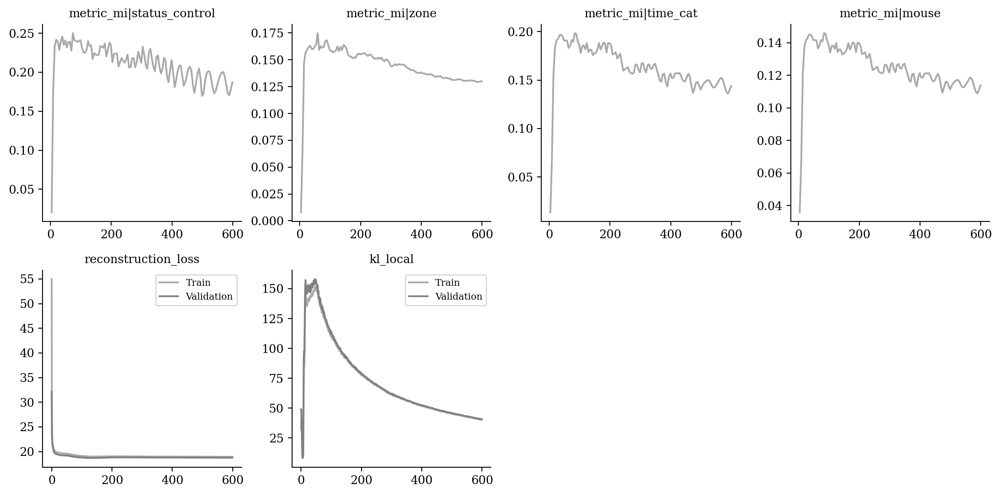

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

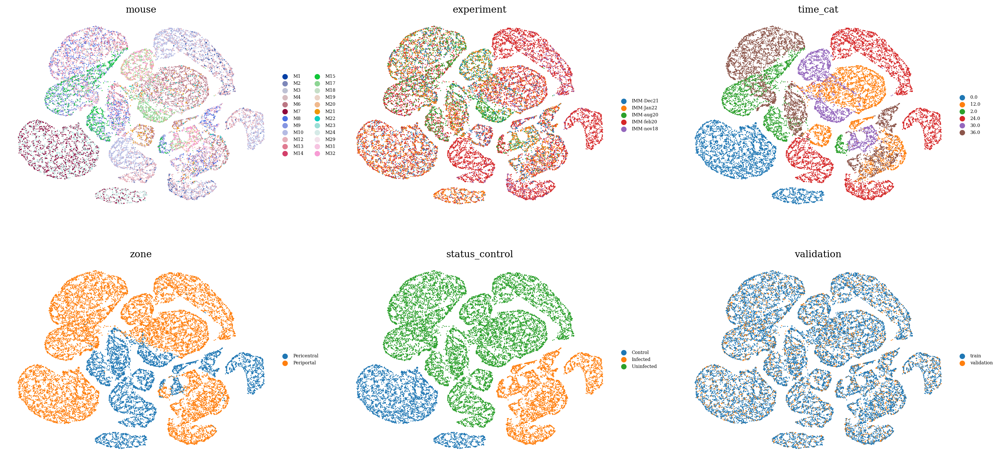

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

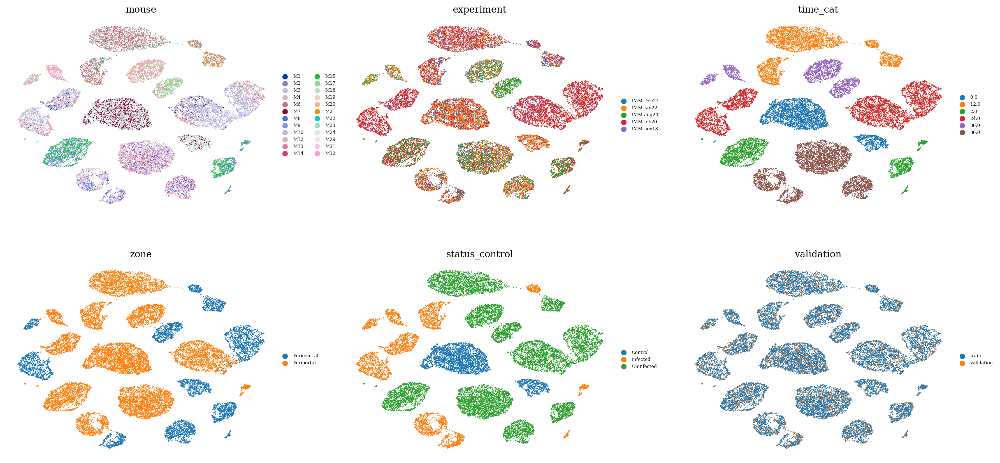

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

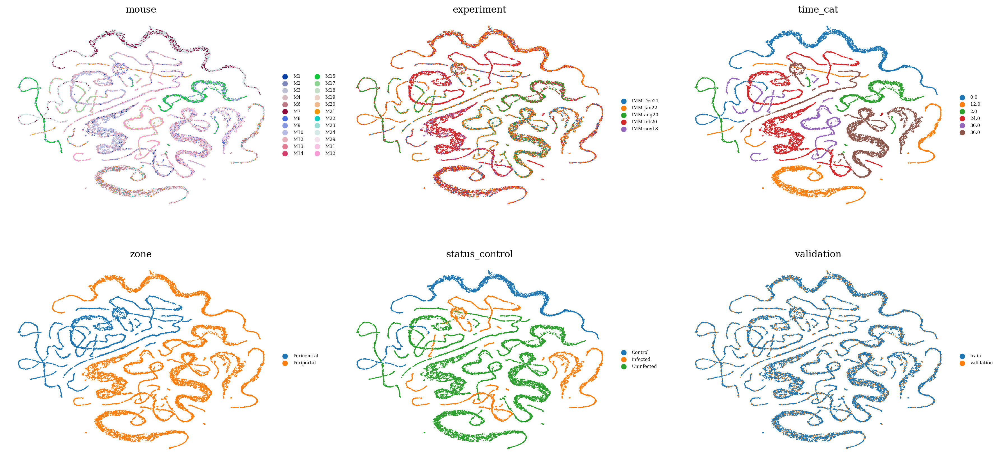

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

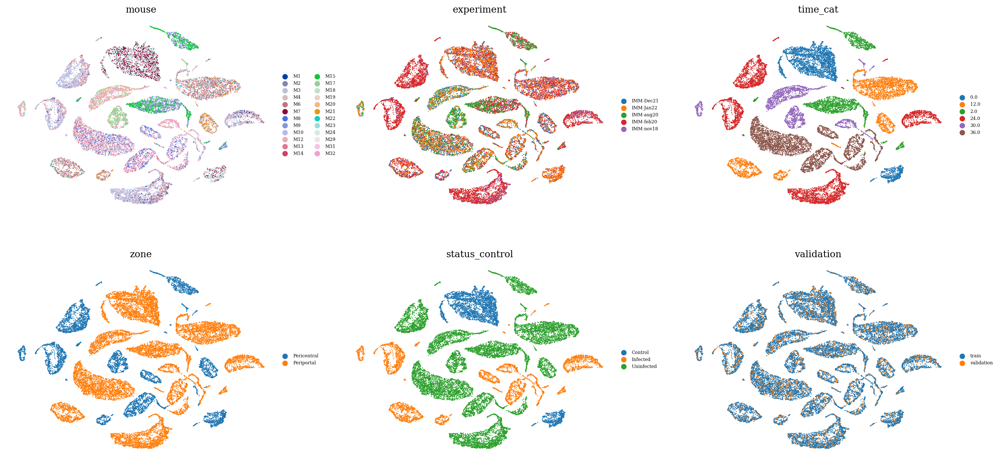

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

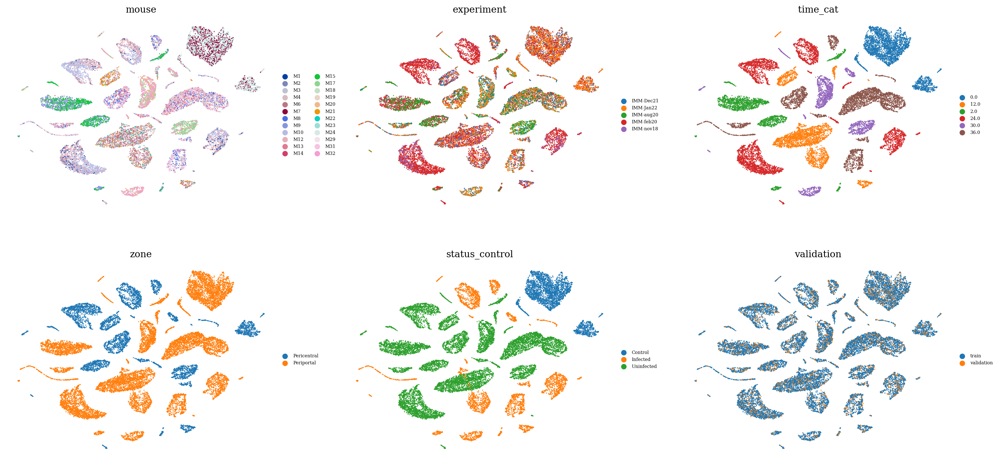

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.5772364951274861

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.55398722350026

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9962514768008153,
 ('validation', 'unreserved'): 0.40985595058759666,
 ('train', 'reserved'): 0.9961142559854264,
 ('train', 'unreserved'): 0.371626671009943}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9967420362183048,
 ('validation', 'unreserved'): 0.5520272604547826,
 ('train', 'reserved'): 0.995631430671039,
 ('train', 'unreserved'): 0.5207150622337969}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.9878899872668038,
 ('validation', 'unreserved'): 0.4880794849827571,
 ('train', 'reserved'): 0.9857199815082653,
 ('train', 'unreserved'): 0.43916299958746785}